# Preamble

In [1]:
# Preamble

import sys
github_dir = "C:/Users/Lab/Lab Software/GitHub/experiment_control"
if github_dir not in sys.path:
    sys.path.append(github_dir)
from chi2_wg_tools import *
from experiment_utilities import printval, printspan
from plotting_imports import * # my_default_plot_params, rcParamsDefault,

%matplotlib notebook
%config InlineBackend.print_figure_kwargs={'bbox_inches':'tight'}

#plt.rcParams.update(rcParamsDefault)
plt.rcParams.update(my_default_plot_params)
import warnings
warnings.filterwarnings('ignore') # set back to 'default' to see warnings again.
#warnings.filterwarnings('default')
colors = ['r','b','g','m','c','k','orange','purple']


## convenience functions for printing variable names and values together
def namestr(obj, namespace=globals()):
    return [name for name in namespace if namespace[name] is obj][0]
    try:
        x_units = str(x.unit)
        x = x.m
    except:
        pass
    if x_units:
        print(namestr(x)+ f': {x:{w}.{p}{form}} ' + x_units)
    else:
        print(namestr(x)+ f': {x:{w}.{p}{form}}')

def printspan(x,w=4,p=1,form='f'):
    x_units = None
    try:
        x_units = str(x.unit)
        x = x.m
    except:
        pass
    if x_units:
        print('max ' + namestr(x) + f': {x.max():{w}.{p}{form}} ' + x_units)
        print('min ' + namestr(x)+ f': {x.min():{w}.{p}{form}} ' + x_units)
    else:
        print('max ' + namestr(x)+ f': {x.max():{w}.{p}{form}}')
        print('min ' + namestr(x)+ f': {x.min():{w}.{p}{form}}')

In [2]:
import sys
github_dir = "C:/Users/Lab/Lab Software/GitHub/experiment_control"
if github_dir not in sys.path:
    sys.path.append(github_dir)
from chi2_wg_tools import tuning_curves_plot
%matplotlib notebook
colors = ['r','b','g','m','c','k','orange','purple']

# Reference code

In [ ]:
# for plotting different points or lines with colors from a colormap
cmap = cm.winter
norm = Normalize(d['Tset'].min().m,d['Tset'].max().m)
sm = cm.ScalarMappable(norm, cmap)
sm.set_array([]) # You have to set a dummy-array for this to work...


for Tind,TT in enumerate(d['Tset']):
    ax0.plot(d['t'][::data_skip].to(u.us),d['V_P_trans'][::data_skip,Tind],label=f'{TT.m:2.1f}K',color=cmap(norm(TT.m)))
ax0.set_xlim([1.2e4,1.55e4])
cbar = plt.colorbar(sm,ax=ax0)
cbar.set_label('Temperature [K]')

# Instruments

## SRS SR850 Lock-in Amplifier

In [2]:
li_address = 'ASRL18::INSTR'

from instrumental.drivers.lockins import sr850 # import driver for Enum constants
li = instrument(module='lockins.sr850',classname='SR850',visa_address=li_address)
li.set_reference_source(sr850.ReferenceSource.external) # use chopper reference out as lock-in reference signal
#li.set_time_constant(sr850.TimeConstant.x300ms)

In [25]:
# li.get_sensitivity() # <Sensitivity.x1V_uA: 26>
# li.get_reserve_mode() # <ReserveMode.minimum: 2>
# li.read_output(sr850.OutputType.R)
# li.auto_gain()
#li.get_time_constant() # <TimeConstant.x100ms: 8>
#li.set_sensitivity(sr850.Sensitivity.x100uV_pA)

<Sensitivity.x1uV_pA: 8>

## IPG SFTL

In [4]:
# import my ipg composite instrument library
github_dir = "C:/Users/Lab/Lab Software/GitHub/experiment_control"
if github_dir not in sys.path:
    sys.path.append(github_dir)
#import IPG_2um_SFTL as ipg
import ipg_sftl_lib as ipg

ipg.init()

### IPG calibration routines

In [8]:
ipg.calibrate_stepper_motor()

moving toward limit switch 1...
found limit switch 1 at encoder position -42913
moving toward limit switch 2...
found limit switch 2 at position 43969
limit switches found. moving back to initial position...


In [5]:
x_cal,lm_cal,f_x_to_lm_cal = ipg.calibrate_grating(speed=1000,nx=30,x_min=1*u.mm,x_max=12*u.mm)

Acquiring wavelength 1 of 30...
...found to be 2076.712 nm
Acquiring wavelength 2 of 30...
...found to be 2073.062 nm
Acquiring wavelength 3 of 30...
...found to be 2088.071 nm
Acquiring wavelength 4 of 30...
...found to be 2102.673 nm
Acquiring wavelength 5 of 30...
...found to be 2117.277 nm
Acquiring wavelength 6 of 30...
...found to be 2131.942 nm
Acquiring wavelength 7 of 30...
...found to be 2153.662 nm
Acquiring wavelength 8 of 30...
...found to be 2167.803 nm
Acquiring wavelength 9 of 30...
...found to be 2182.103 nm
Acquiring wavelength 10 of 30...
...found to be 2196.407 nm
Acquiring wavelength 11 of 30...
...found to be 2217.939 nm
Acquiring wavelength 12 of 30...
...found to be 2232.126 nm
Acquiring wavelength 13 of 30...
...found to be 2246.146 nm
Acquiring wavelength 14 of 30...
...found to be 2260.408 nm
Acquiring wavelength 15 of 30...
...found to be 2274.312 nm
Acquiring wavelength 16 of 30...
...found to be 2294.955 nm
Acquiring wavelength 17 of 30...
...found to be 2

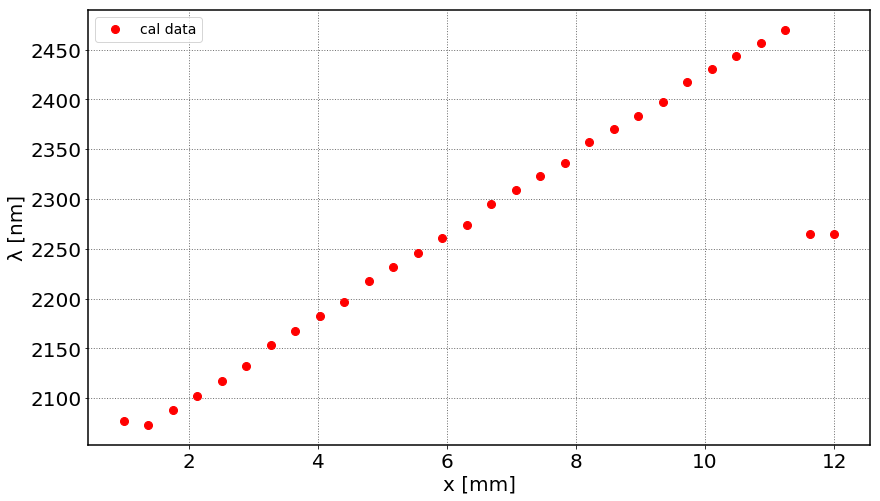

In [15]:
fig = plt.figure(figsize=(14,8))
ax=fig.add_subplot(111)
#x_interp = np.linspace(x_cal.min().m+1,x_cal.max().m-1,300)
#lm_interp = f_x_to_lm_cal(x_interp)
#ax.plot(x_interp,lm_interp,'k--',label='cal interp')
ax.plot(x_cal,lm_cal,'ro',label='cal data')
ax.set_xlabel('x [mm]')
ax.set_ylabel('λ [nm]')
ax.legend()

In [5]:
ipg.get_wavelength()

<Quantity(2408.2670916187626, 'nanometer')>

In [7]:
ipg.set_wavelength(2397*u.nm,tune_SHG=False)

## Sample mount temperature control

In [8]:
# import Labjack client functions
temp_mon_dir = "C:/Users/Lab/Lab Software/GitHub/experiment_control/temp_monitor"
if temp_mon_dir not in sys.path:
    sys.path.append(temp_mon_dir)
import labjack_client as ljc
from sample_mount_temp_control import *

## Bristol LSA/wavemeter server

In [ ]:
# import Bristol client functions
bristol_client_dir = "C:/Users/Lab/Lab Software/GitHub/experiment_control/temp_monitor"
if temp_mon_dir not in sys.path:
    sys.path.append(temp_mon_dir)
import labjack_client as ljc
from sample_mount_temp_control import *

## Tektronix DPO 2024 oscilloscope

In [6]:
# connect to scope
scope = instrument(module='scopes.tektronix', classname='MSO_DPO_4000', visa_address='USB0::0x0699::0x0374::C010960::INSTR')

In [7]:
# define functions to collect traces from oscilloscope

@ntries(3)
def collect_scope_trace(channel=1,name='',data_dir='C:/Users/Lab/Google Drive/data/',
                        return_data=True,use_tekscope_str=True,background=None,verbose=True,**kwargs):
    timestamp_str = datetime.strftime(datetime.now(),'%Y_%m_%d_%H_%M_%S')
    if use_tekscope_str:
        fname = 'Tektronix_MSO_scope_trace_' + name + '_' + timestamp_str
    else:
        fname = name + '_' + timestamp_str
    mfname = 'metadata_'+fname+'.dat'
    fpath = path.join(data_dir,fname)
    mfpath = path.join(data_dir,mfname)
    t,V = scope.get_data(channel=channel)
    # add a couple other things to kwargs and save as a metadata dict
    metadata = kwargs
    metadata['channel']=channel
    metadata['timestamp']=timestamp_str
    if background:
        V = V-background
        metadata['subtracted_background']=background
    data = np.stack((t.to(u.second).magnitude,V.to(u.volt).magnitude)).T
    if verbose:
        print('saving data to '+fpath)
        print('saving metadata to '+mfname +' in the same dir')
    np.save(fpath,data,fix_imports=True)
    with open(mfpath, 'wb') as f:
        pickle.dump(metadata,f)
    if return_data:
        return t,V
    else:
        del t
        del V
        del data

def load_scope_trace(name='',data_dir='C:/Users/Lab/Google Drive/data/',verbose=False,
                     use_tekscope_str=True,metadata=False,exact_name=False):
    # exact_name=True forces the date to come after the name, avoiding mistakenly loading the wrong trace
    # if two trace files in directory need to be distinguished and one's name contains the other
    if exact_name:
        star_str = '_2*'
    else:
        star_str = '_*'
    if use_tekscope_str:
        file_list =  glob(path.normpath(data_dir)+path.normpath('/Tektronix_MSO_scope_trace_' + name + star_str))
    else:
        file_list =  glob(path.normpath(data_dir)+path.normpath('/'+ name + star_str))
    latest_file = max(file_list,key=path.getctime)
    if verbose:
        print_statusline('Loading ' + name +' trace from file: ' + path.basename(path.normpath(latest_file)))
    data = np.load(latest_file)
    t = data[:,0] * u.second
    V = data[:,1] * u.volt
    if metadata:
        mfname = 'metadata_'+latest_file.split('\\')[-1][:-4]+'.dat' # remember to remove '.npy' added to data fname
        mfpath = path.normpath(path.join(data_dir,mfname))
        with open( mfpath, "rb" ) as f:
            mdata = pickle.load(f)
        return t,V,mdata
    else:
        return t,V

## Ando AQ6331 NIR OSA

In [6]:
#osa = instrument('AQ6331')
ando = instrument(module='spectrometers.ando', classname='AQ6331', visa_address='GPIB0::7::INSTR')
sleep(0.1)
osa._rsrc.timeout = 10000
#@ntries(10)
def collect_ando_spectrum(name='',data_dir='C:/Users/Lab/Google Drive/data/',trace='A'):
    timestamp_str = datetime.strftime(datetime.now(),'%Y_%m_%d_%H_%M_%S')
    fname = 'Ando_AQ6331_OSA_spectrum_' + name + '_' + timestamp_str
    fpath = path.join(data_dir,fname)
    osa.set_amplitude_units_PSD()
    sleep(0.3)
    lm,psd = osa.get_spectrum(trace=trace)
    data = np.stack((lm.to(u.nm).m,psd.m)).T
    print('saving to '+fpath)
    np.save(fpath,data,fix_imports=True)
    return lm,psd

def load_ando_spectrum(name='',data_dir='C:/Users/Lab/Google Drive/data/',verbose=False):
    file_list =  glob(path.normpath(data_dir)+path.normpath('/Ando_AQ6331_OSA_spectrum_' + name + '_*'))
    #print(path.normpath(data_dir)+path.normpath('/HP_OSA_spectrum_' + name + '_*'))
    latest_file = max(file_list,key=path.getctime)
    if verbose:
        print('Loading ' + name +' trace from file: ' + path.basename(path.normpath(latest_file)))
    data = np.load(latest_file)
    lm = data[:,0] * u.nm
    psd = data[:,1] * u.watt / u.nm
    return lm,psd

# IPG SFTL piezo tuning

In [3]:
# prototype functions for piezo tuning of IPG SFTL

def pzt_scan(V,pzt,n_pts_per_voltage=1,wait_time=0.5*u.second):
    nV = len(V)
    λ = np.zeros((nV,n_pts_per_voltage)) * u.nm
    for Vind, VV in enumerate(V):
        pzt.set_V(VV)
        for nn in range(n_pts_per_voltage):
            pct_complete = 100. * float(Vind*n_pts_per_voltage+nn) / float(n_pts_per_voltage*nV)
            print_statusline(f'Voltage {Vind+1} of {nV}, point {nn+1} of {n_pts_per_voltage}, {pct_complete:3.2f}% complete')
            sleep(wait_time.to(u.second).m)
            λ[Vind,nn] = ipg.get_lm()
    return λ

def pzt1_scan(V,n_pts_per_voltage=1,wait_time=0.1*u.second):
    return pzt_scan(V,ipg.pzt1,n_pts_per_voltage=n_pts_per_voltage,wait_time=wait_time)

def pzt2_scan(V,n_pts_per_voltage=1,wait_time=0.1*u.second):
    return pzt_scan(V,ipg.pzt2,n_pts_per_voltage=n_pts_per_voltage,wait_time=wait_time)

def pzt3_scan(V,n_pts_per_voltage=1,wait_time=0.1*u.second):
    return pzt_scan(V,ipg.pzt3,n_pts_per_voltage=n_pts_per_voltage,wait_time=wait_time)

### from playing around in Kinesis, it seems that the real maximum voltages achievable are:
# PZT1: 0-66.66 volts, positive voltages result in positive wavelength shifts, 0 - 1.2nm
# PZT2: 0-66.66 volts, positive voltages result in negative wavelength shifts, 0 - -1.1nm
# PZT3: 0-66.66 volts, positive voltages result in positive wavelength shifts, 0 - 20pm


In [4]:
# check IPG piezo tuning characteristics near 2.4μm

V = np.linspace(0,65,13) * u.volt
n_pts_per_voltage = 5
wait_time = 0.5*u.second

λ_pzt1_scan_fwd = pzt1_scan(V,n_pts_per_voltage=n_pts_per_voltage,wait_time=wait_time)
λ_pzt1_scan_bkwd = pzt1_scan(V[::-1],n_pts_per_voltage=n_pts_per_voltage,wait_time=wait_time)

λ_pzt2_scan_fwd = pzt2_scan(V,n_pts_per_voltage=n_pts_per_voltage,wait_time=wait_time)
λ_pzt2_scan_bkwd = pzt2_scan(V[::-1],n_pts_per_voltage=n_pts_per_voltage,wait_time=wait_time)

λ_pzt3_scan_fwd = pzt3_scan(V,n_pts_per_voltage=n_pts_per_voltage,wait_time=wait_time)
λ_pzt3_scan_bkwd = pzt3_scan(V[::-1],n_pts_per_voltage=n_pts_per_voltage,wait_time=wait_time)


Text(0,0.5,'λ [nm]')

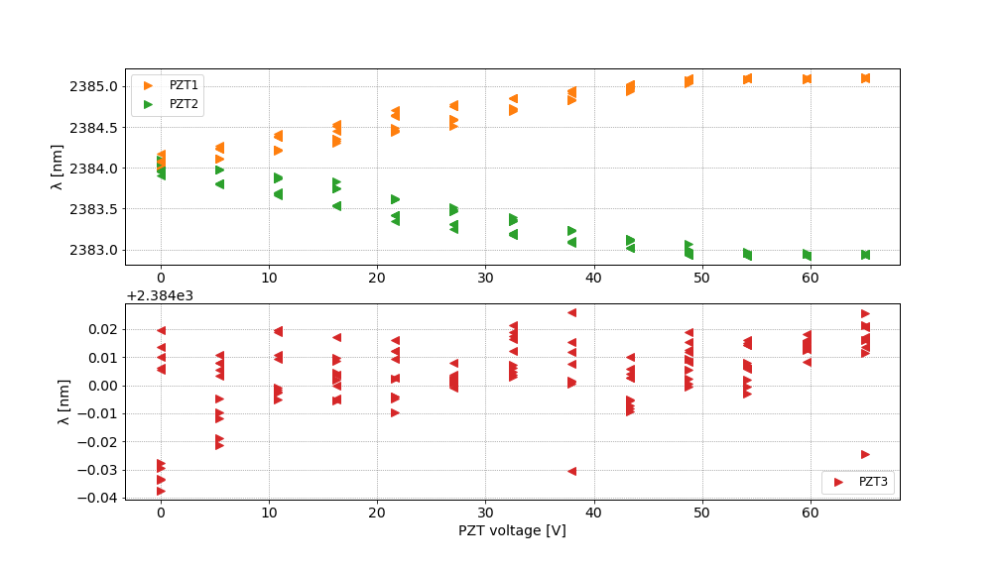

In [7]:
# plot PZT scan results
%matplotlib inline
fig,ax = plt.subplots(2,1,figsize=(14,8))

ax[0].plot(V,λ_pzt1_scan_fwd[:,0],'>',color='C1',label='PZT1')
ax[0].plot(V,λ_pzt2_scan_fwd[:,0],'>',color='C2',label='PZT2')
ax[1].plot(V,λ_pzt3_scan_fwd[:,0],'>',color='C3',label='PZT3')

ax[0].legend()
ax[1].legend()

ax[0].plot(V,λ_pzt1_scan_fwd[:,1:],'>',color='C1',label='PZT1')
ax[0].plot(V,λ_pzt2_scan_fwd[:,1:],'>',color='C2',label='PZT2')
ax[1].plot(V,λ_pzt3_scan_fwd[:,1:],'>',color='C3',label='PZT3')

ax[0].plot(V[::-1],λ_pzt1_scan_bkwd,'<',color='C1',label='PZT1, backward')
ax[0].plot(V[::-1],λ_pzt2_scan_bkwd,'<',color='C2',label='PZT2, backward')
ax[1].plot(V[::-1],λ_pzt3_scan_bkwd,'<',color='C3',label='PZT3, backward')


ax[1].set_xlabel('PZT voltage [V]')
ax[0].set_ylabel('λ [nm]')
ax[1].set_ylabel('λ [nm]')

# Phase matching

## Function Definitions

In [4]:
def scan_wavelength_measure_SHG(lm,t_sleep=1*u.second,autogain=True):
    # initialize lock-in
    # li.auto_gain()
    V_X = np.zeros(len(lm))*u.volt
    V_Y = np.zeros(len(lm))*u.volt    
    for lind, ll in enumerate(lm):
        ipg.set_wavelength(ll,tune_SHG=False)
        if autogain:   
            li.auto_gain()
        sleep(t_sleep.to(u.second).m)
        V_X[lind] = li.read_output(sr850.OutputType.X)
        V_Y[lind] = li.read_output(sr850.OutputType.Y)
    return V_X,V_Y

In [12]:
lm = np.linspace(2395,2405,100)*u.nm
V_X,V_Y = scan_wavelength_measure_SHG(lm)

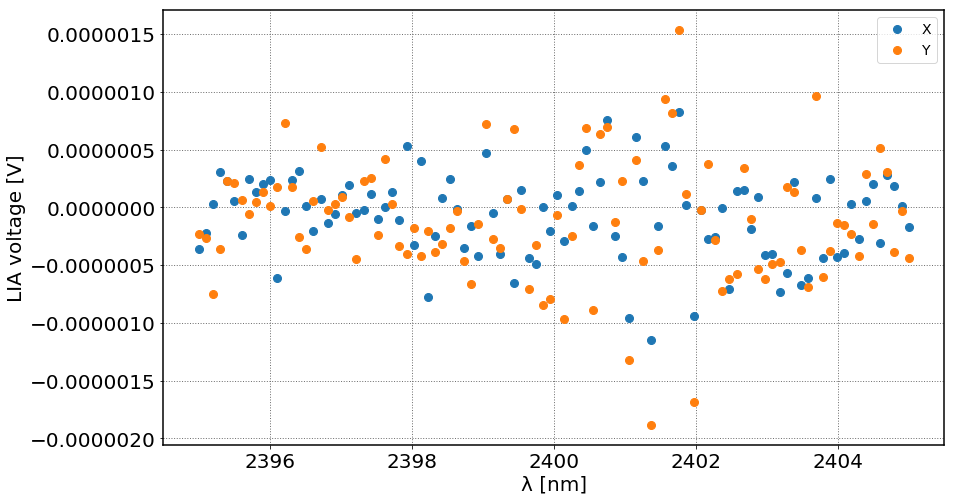

In [14]:
fig = plt.figure(figsize=(14,8))
ax=fig.add_subplot(111)

#ax.plot(lm,V_X0,'ko',label='X0')
ax.plot(lm,V_X,'C0o',label='X')
ax.plot(lm,V_Y,'C1o',label='Y')
ax.set_ylabel('LIA voltage [V]')
ax.set_xlabel('λ [nm]')
ax.legend()

In [15]:
ipg.set_wavelength(2401.85*u.nm)

tuning SHG:
	poling region: 1, LM=34.8000um
	set temperature: 105.8C
current_temp: 103.648 degC
set_temp: 105.83731683027433 degC


In [5]:
# overnight phase matching measurement

# li.set_time_constant(sr850.TimeConstant.x3s)


lm_long = np.linspace(2300,2450,200)*u.nm
V_X_long,V_Y_long = scan_wavelength_measure_SHG(lm_long,t_sleep=15*u.second,autogain=True)

In [15]:
# save data from this first-pass SHG scan data
data_dir = 'C:/Users/Lab/Google Drive/data'
fname = 'shg_ds_0.npz'
fpath = Path(path.normpath(path.join(data_dir,fname)))
np.savez(fpath,lm=lm_long,V_X=V_X_long,V_Y=V_Y_long)


In [51]:
# define functions for measurements

default_data_dir = 'C:/Users/Lab/Google Drive/data/'

def P_24_measurements(set_up_measurements=True,wait=False,wait_time=2*u.second,
                    P_24_trans_ch=1,P_24_ref_ch=3,P_24_trans_meas_num=1,
                    P_24_ref_meas_num=2):
    if set_up_measurements:
        scope.set_measurement_params(P_24_trans_meas_num,'amplitude',P_24_trans_ch)
        sleep(0.3)
        scope.set_measurement_params(P_24_ref_meas_num,'amplitude',P_24_ref_ch)
        sleep(0.3)
    if wait:
        sleep(wait_time.to(u.second).m)
    V_P_24_trans = scope.read_measurement_value(P_24_trans_meas_num)
    sleep(0.1)
    V_P_24_ref = scope.read_measurement_value(P_24_ref_meas_num)
    sleep(0.1)
    return V_P_24_trans,V_P_24_ref

def collect_shg_wavelength_sweep(lm_set,name='',data_dir=default_data_dir,n_pts_per_setpoint=1,
    time_constant=sr850.TimeConstant.x3s,settle_time=10*u.second,autogain=True,
    P_24_trans_ch=1,P_24_ref_ch=3,return_fpath=True,live_plot=True):
    li.set_time_constant(time_constant)
    timestamp_str = datetime.strftime(datetime.now(),'%Y_%m_%d_%H_%M_%S')
    fname = 'SHG_wavelength_sweep_' + name + '_' + timestamp_str+'.npz'
    fpath = path.normpath(path.join(data_dir,fname))
    print('saving to '+fpath)
    V_X = np.zeros((len(lm_set),n_pts_per_setpoint))*u.volt
    V_Y = np.zeros((len(lm_set),n_pts_per_setpoint))*u.degree
    lm_meas = np.zeros((len(lm_set),n_pts_per_setpoint))*u.nm
    V_P_24_trans = np.zeros((len(lm_set),n_pts_per_setpoint))*u.volt
    V_P_24_ref = np.zeros((len(lm_set),n_pts_per_setpoint))*u.volt
    V_P_24_data_init = P_24_measurements(set_up_measurements=True,
                                         wait=True,
                                         P_24_trans_ch=P_24_trans_ch,
                                         P_24_ref_ch=P_24_ref_ch)
    
    if live_plot:
        xlimits = [lm_set.to(u.nm).min().m-2., lm_set.to(u.nm).max().m+2.]
        #fig,ax=plt.subplots(1,1,figsize=(14,8))
        fig,ax=plt.subplots(1,1)
        ax.set_xlabel('Wavelength [nm]')
        ax.set_ylabel('$P_{1.2} / P_{2.4}^2$')
        ax.set_xlim(xlimits)
        plt.show()
    
    for lind, ll in enumerate(lm_set):
        ipg.set_wavelength(ll,tune_SHG=False)
        if autogain:
            li.auto_gain()
        for nn in range(n_pts_per_setpoint):
            lm_meas[lind,nn] = ipg.get_wavelength()
            sleep(settle_time.to(u.second).m)
            V_P_24_data = P_24_measurements(set_up_measurements=False,P_24_trans_ch=P_24_trans_ch,P_24_ref_ch=P_24_ref_ch)
            V_P_24_trans[lind,nn] = V_P_24_data[0]
            V_P_24_ref[lind,nn] = V_P_24_data[1]
            V_X[lind,nn] = li.read_output(sr850.OutputType.R)
            V_Y[lind,nn] = li.read_output(sr850.OutputType.theta)
            np.savez(Path(fpath),lm_set=lm_set.m,
                                    lm_meas=lm_meas.m,
                                    V_X=V_X.m,
                                    V_Y=V_Y.m,
                                    V_P_24_trans=V_P_24_trans.m,
                                    V_P_24_ref=V_P_24_ref.m)
            if live_plot:
                ax.plot(lm_meas[lind,nn],V_X[lind,nn]/V_P_24_trans[lind,nn]**2,'C0')
#                 ax.plot(lm_meas[lind,nn],V_Y[lind,nn]/V_P_24_trans[lind,nn]**2,'C1')
#                 ax.plot(lm_meas[lind,nn],np.sqrt(V_X[lind,nn]**2+V_Y[lind,nn]**2)/V_P_24_trans[lind,nn]**2,'C2')
                fig.canvas.draw()
                plt.show()
            
    if return_fpath:
        return fpath


def load_shg_wavelength_sweep(name='',data_dir=default_data_dir,verbose=False,
                     fpath=None,metadata=False,exact_name=False):
    # exact_name=True forces the date to come after the name, avoiding mistakenly loading the wrong trace
    # if two trace files in directory need to be distinguished and one's name contains the other
    if fpath:
        if verbose:
            print_statusline('Loading data from file: ' + path.basename(path.normpath(fpath)))
        data_npz = np.load(Path(fpath))
    else:
        file_list =  glob(path.normpath(data_dir)+path.normpath('/'+ name + star_str))
        latest_file = max(file_list,key=path.getctime)
        if verbose:
            print_statusline('Loading ' + name +' data from file: ' + path.basename(path.normpath(latest_file)))
        data_npz = np.load(latest_file)
    lm_set = data_npz['lm_set'] * u.nm
    lm_meas = data_npz['lm_meas'] * u.nm
    V_P_24_trans = data_npz['V_P_24_trans'] * u.volt
    V_P_24_ref = data_npz['V_P_24_ref'] * u.volt
    V_X = data_npz['V_X'] * u.volt
    V_Y = data_npz['V_Y'] * u.volt
    ds = {'lm_set':lm_set,
            'lm_meas':lm_meas,
            'V_P_24_trans':V_P_24_trans,
            'V_P_24_ref':V_P_24_ref,
            'V_X':V_X,
            'V_Y':V_Y}
    return ds

def plot_shg_wavelength_sweep(ds):
    fig,ax = plt.subplots(1,1,figsize=(12,8))
    ax.plot(ds['lm_meas'],ds['V_X']/ds['V_P_24_trans']**2,'C0o')
#     ax.plot(ds['lm_meas'],ds['V_Y']/ds['V_P_24_trans']**2,'C1o')
#     ax.plot(ds['lm_meas'],np.sqrt(ds['V_X']**2+ds['V_Y']**2)/ds['V_P_24_trans']**2,'C2o')
    xlimits = [ds['lm_set'].to(u.nm).min().m-2., ds['lm_set'].to(u.nm).max().m+2.]
    ax.set_xlabel('Wavelength [nm]')
    ax.set_ylabel('$P_{1.2} / P_{2.4}^2$')
    ax.set_xlim(xlimits)

## Wavelength Sweeps

saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_test0_2018_10_25_00_20_57.npz


<IPython.core.display.Javascript object>


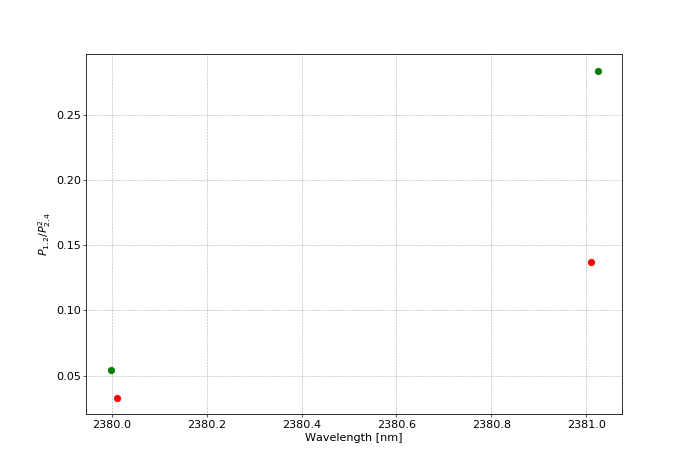

saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_test1_2018_10_25_00_21_28.npzps


In [2]:
# test wavelength sweep functions
%matplotlib notebook
# %matplotlib inline
# V_P_24_trans,V_P_24_ref = P_24_measurements(set_up_measurements=True)
# printval(V_P_24_trans)
# printval(V_P_24_ref)



lm_set = np.linspace(2380.0,2381.0,2)*u.nm
lia.set_sensitivity(sr850.Sensitivity.x200mV_nA)

fpath_test0,fig,ax = collect_shg_wavelength_sweep(lm_set,
                                     name='test0',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     time_constant=sr850.TimeConstant.x300ms,
                                     settle_time=3*u.second,
                                                 color=colors[0])



fpath_test1,fig,ax = collect_shg_wavelength_sweep(lm_set,
                                     name='test1',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     time_constant=sr850.TimeConstant.x300ms,
                                     settle_time=3*u.second,
                                             fig=fig,
                                             ax=ax,
                                             color=colors[2])

<IPython.core.display.Javascript object>


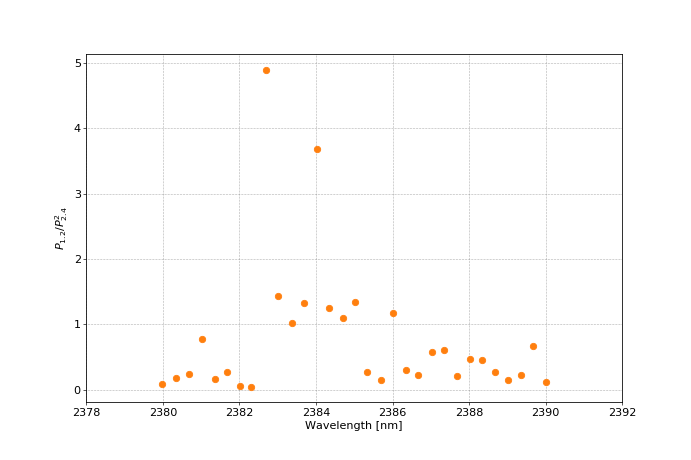

In [3]:
# %matplotlib inline
#ds_test = load_shg_wavelength_sweep(fpath=fpath)
ds0_22C = load_shg_wavelength_sweep(fpath=fpath_ds0_22C)
ax = plot_shg_wavelength_sweep(ds0_22C)
#plot_shg_wavelength_sweep(ds_test)

saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_ds1_22C_2018_10_25_09_10_03.npz


<IPython.core.display.Javascript object>


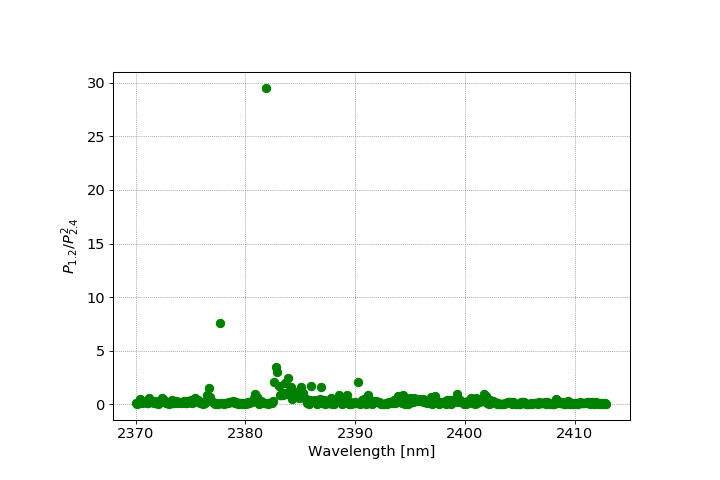

MemoryError: 

In [2]:
# wavelength sweeps at several temperatures

%matplotlib notebook
%config InlineBackend.print_figure_kwargs={'bbox_inches':None}

lm_set = np.linspace(2370.0,2420.0,401)*u.nm
lia.set_sensitivity(sr850.Sensitivity.x200mV_nA)

fig=None
ax=None

# # 18C
# set_temp_and_wait(18.0)
# fpath_ds1_18C,fig,ax = collect_shg_wavelength_sweep(lm_set,
#                                      name='ds1_18C',
#                                      autogain=False,
#                                      n_pts_per_setpoint=1,
#                                      time_constant=sr850.TimeConstant.x300ms,
#                                      settle_time=3*u.second,
#                                                    color=colors[0])



# # 20C
# set_temp_and_wait(20.0)
# fpath_ds1_20C,fig,ax = collect_shg_wavelength_sweep(lm_set,
#                                      name='ds1_20C',
#                                      autogain=False,
#                                      n_pts_per_setpoint=1,
#                                      time_constant=sr850.TimeConstant.x300ms,
#                                      settle_time=3*u.second,
#                                                    color=colors[1])

# 22C
set_temp_and_wait(22.0)
fpath_ds1_22C,fig,ax = collect_shg_wavelength_sweep(lm_set,
                                     name='ds1_22C',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     time_constant=sr850.TimeConstant.x300ms,
                                     settle_time=3*u.second,
                                                   fig=fig,
                                                   ax=ax,
                                                   color=colors[2])

# 24C
set_temp_and_wait(24.0)
fpath_ds1_24C,fig,ax = collect_shg_wavelength_sweep(lm_set,
                                     name='ds1_24C',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     time_constant=sr850.TimeConstant.x300ms,
                                     settle_time=3*u.second,
                                                   fig=fig,
                                                   ax=ax,
                                                   color=colors[3])

# 26C
set_temp_and_wait(26.0)
fpath_ds1_26C,fig,ax = collect_shg_wavelength_sweep(lm_set,
                                     name='ds1_26C',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     time_constant=sr850.TimeConstant.x300ms,
                                     settle_time=3*u.second,
                                                   fig=fig,
                                                   ax=ax,
                                                   color=colors[4])

# 28C
set_temp_and_wait(28.0)
fpath_ds1_28C,fig,ax = collect_shg_wavelength_sweep(lm_set,
                                     name='ds1_86C',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     time_constant=sr850.TimeConstant.x300ms,
                                     settle_time=3*u.second,
                                                   fig=fig,
                                                   ax=ax,
                                                   color=colors[5])

<IPython.core.display.Javascript object>


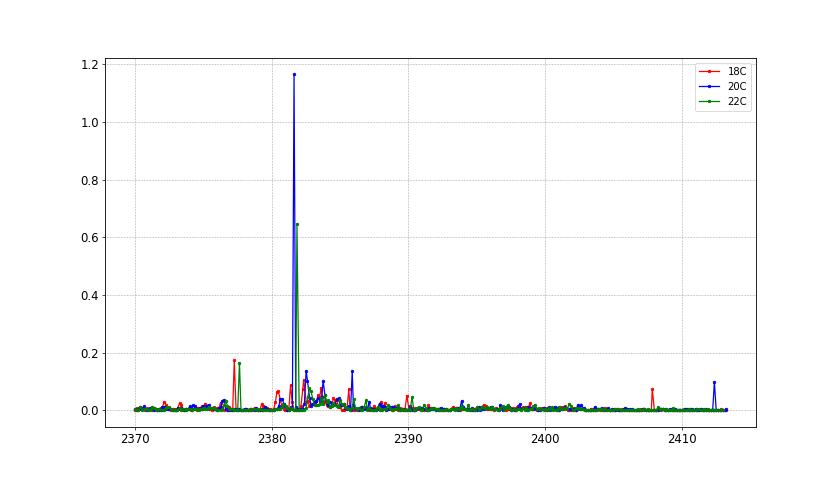

In [27]:
#ds0_18C = load_shg_wavelength_sweep(name='ds0_18C')
ds1_18C = load_shg_wavelength_sweep(name='ds1_18C')
ds1_20C = load_shg_wavelength_sweep(name='ds1_20C')
ds1_22C = load_shg_wavelength_sweep(name='ds1_22C')

d = [ds1_18C,ds1_20C,ds1_22C]
labels = ['18C','20C','22C']

#xlim = [2368,2410]

fig, ax = plt.subplots(1,1,figsize=(14,8))

for dind,ds in enumerate(d):
    V_P_24_trans_rel = ds['V_P_24_trans'] / ds['V_P_24_trans'].max()
    x = ds['lm_meas'][np.nonzero(ds['V_R'])]
    y = ds['V_R'][np.nonzero(ds['V_R'])]/V_P_24_trans_rel[np.nonzero(ds['V_R'])]**2
    ax.plot(x,y,'o-',ms=3,label=labels[dind],color=colors[dind]) 

    
#ax.set_xlim(xlim)
ax.legend()

saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_test0_ol_2018_10_25_12_08_57.npz


<IPython.core.display.Javascript object>


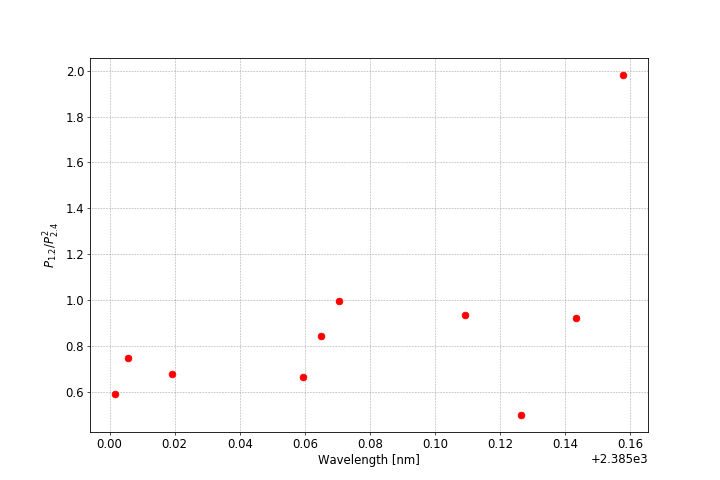

In [2]:
# try open loop wavelength sweeps,
# just starting at a known wavelength then stepping the grating stepper

lia.set_sensitivity(sr850.Sensitivity.x200mV_nA)

fig=None
ax=None


lm_start = 2385*u.nm
steps_per_point = 3
n_pts = 10

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     time_constant=sr850.TimeConstant.x300ms,
                                     settle_time=3*u.second,
                                                   color=colors[0])

# note, near 2.4μm I see ~150pm / (30*3) steps = 1.5pm/step => ~600steps/nm
# I also see that steps "forward", i.e. new_pos = current_pos + n_steps result in wavelength increase

saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_test3_ol_2018_10_25_13_27_54.npz


<IPython.core.display.Javascript object>


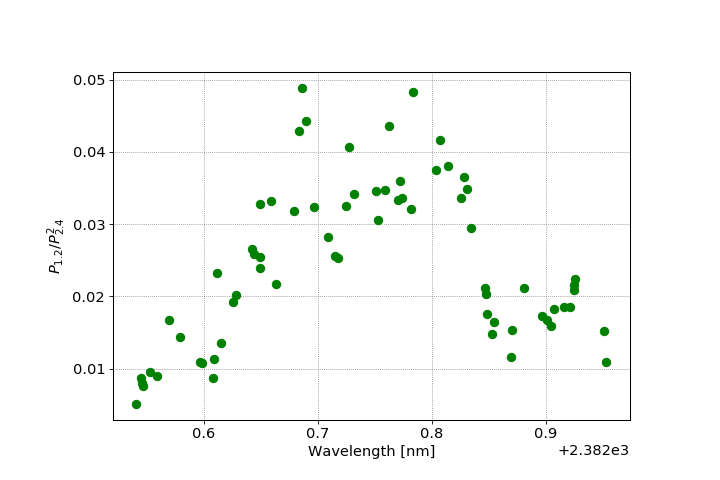

VisaIOError: VI_ERROR_TMO (-1073807339): Timeout expired before operation completed.

In [2]:
lia.set_sensitivity(sr850.Sensitivity.x200mV_nA)

# fig=None
# ax=None


lm_start = 2382.5*u.nm
steps_per_point = 2
n_pts = 1000

fpath_test3_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test3_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=2,
                                     time_constant=sr850.TimeConstant.x300ms,
                                     settle_time=1.5*u.second,
                                                   color=colors[2])


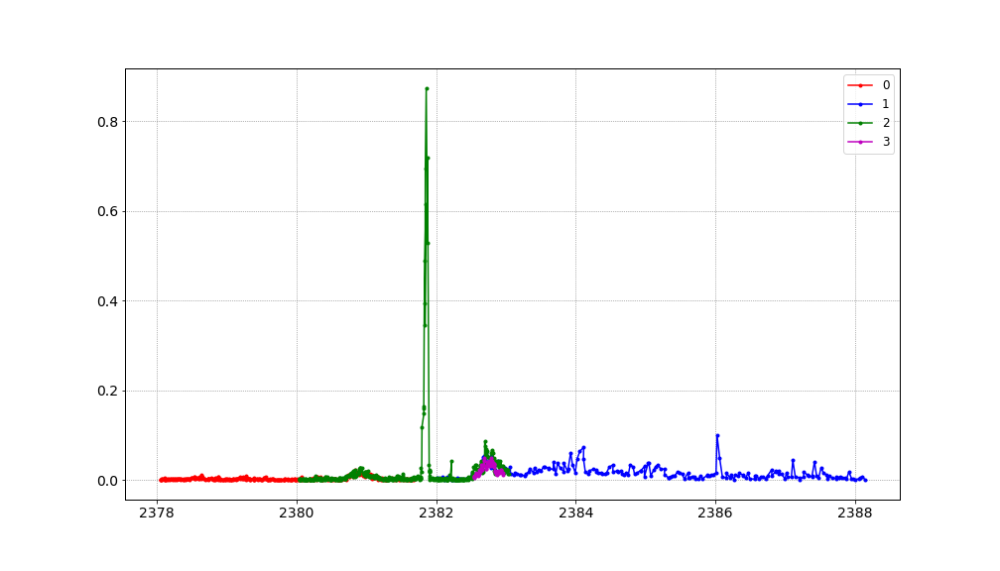

In [4]:
ds_ol_test0 = load_shg_wavelength_sweep(name='ds0_ol')
# ds_ol_test0 = load_shg_wavelength_sweep(name='test0_ol')
# ds_ol_test1 = load_shg_wavelength_sweep(name='test1_ol')
# ds_ol_test2 = load_shg_wavelength_sweep(name='test2_ol')
# ds_ol_test3 = load_shg_wavelength_sweep(name='test3_ol')

d = [ds_ol_test0,ds_ol_test1,ds_ol_test2,ds_ol_test3]
labels = ['0','1','2','3']

%matplotlib inline
#xlim = [2368,2410]

fig, ax = plt.subplots(1,1,figsize=(14,8))

for dind,ds in enumerate(d):
    V_P_24_trans_rel = ds['V_P_24_trans'] / ds['V_P_24_trans'].max()
    x = ds['lm_meas'][np.nonzero(ds['V_R'])]
    y = ds['V_R'][np.nonzero(ds['V_R'])]/V_P_24_trans_rel[np.nonzero(ds['V_R'])]**2
    ax.plot(x,y,'o-',ms=3,label=labels[dind],color=colors[dind]) 

    
#ax.set_xlim(xlim)
ax.legend()

saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_test1_ol_2018_11_04_17_32_59.npz


<IPython.core.display.Javascript object>


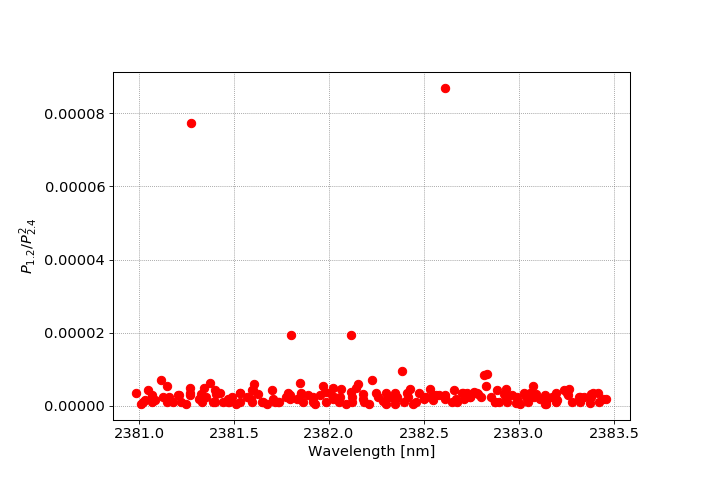

In [2]:
%matplotlib notebook
%config InlineBackend.print_figure_kwargs={'bbox_inches':None}

#lm_set = np.linspace(2381.0,2382.5,151)*u.nm
lia.set_sensitivity(sr850.Sensitivity.x10mV_nA)

fig=None
ax=None

lm_start = 2381*u.nm
steps_per_point = 1
n_pts = 100

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test1_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     time_constant=sr850.TimeConstant.x1s,
                                     norm_with_P_trans=False,
                                     settle_time=5*u.second,
                                                   color=colors[0])


saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_test1_ol_2018_11_04_21_39_59.npz


<IPython.core.display.Javascript object>


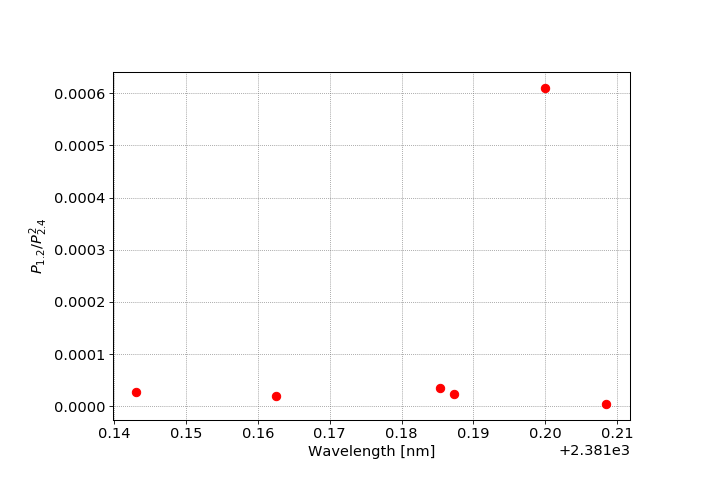

KeyboardInterrupt: 

In [2]:
%matplotlib notebook
%config InlineBackend.print_figure_kwargs={'bbox_inches':None}

#lm_set = np.linspace(2381.0,2382.5,151)*u.nm
lia.set_sensitivity(sr850.Sensitivity.x100mV_nA)

fig=None
ax=None

lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 1000

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test1_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     time_constant=sr850.TimeConstant.x300ms,
                                     norm_with_P_trans=False,
                                     settle_time=3*u.second,
                                                   color=colors[0])


<IPython.core.display.Javascript object>


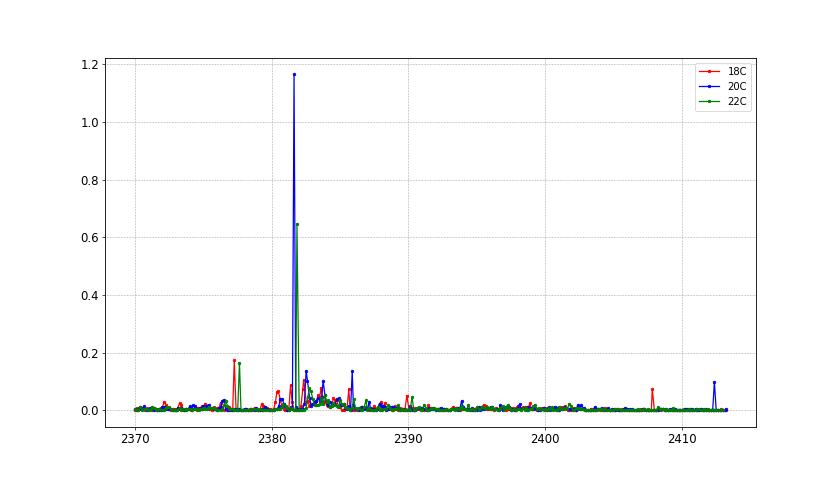

In [33]:
#ds0_18C = load_shg_wavelength_sweep(name='ds0_18C')
ds1_18C = load_shg_wavelength_sweep(name='ds1_18C')
ds1_20C = load_shg_wavelength_sweep(name='ds1_20C')
ds1_22C = load_shg_wavelength_sweep(name='ds1_22C')

d = [ds1_18C,ds1_20C,ds1_22C]
labels = ['18C','20C','22C']

#xlim = [2368,2410]

fig, ax = plt.subplots(1,1,figsize=(14,8))

for dind,ds in enumerate(d):
    V_P_24_trans_rel = ds['V_P_24_trans'] / ds['V_P_24_trans'].max()
    x = ds['lm_meas'][np.nonzero(ds['V_R'])]
    y = ds['V_R'][np.nonzero(ds['V_R'])]/V_P_24_trans_rel[np.nonzero(ds['V_R'])]**2
    ax.plot(x,y,'o-',ms=3,label=labels[dind],color=colors[dind]) 

    
#ax.set_xlim(xlim)
ax.legend()

In [3]:
FSR_meas = (2382.5*u.nm).to(u.GHz,'sp') - (2383.75*u.nm).to(u.GHz,'sp')
FSR_λ_meas =(2383.75*u.nm) - (2382.5*u.nm)  

# rough idea of phase and group index difference at pump and signal
# from "visual inspection" of my lumerical data plots
n_eff_12 = 2.95
n_eff_24 = 2.05
ng_eff_12 = 4.0
ng_eff_24 = 3.6

# Expected cavity FSR's from designed device size 
d_ring = 120 * u.um # ring mirror diameter and racetrack width
L_straight = 580 * u.um # racetrack straight portion length
L_ring = np.pi * d_ring # ring mirror cavity round trip length
L_racetrack = np.pi * d_ring + 2 * L_straight # racetrack cavity round trip length
FSR_ring = (u.speed_of_light / ng_eff_24 / L_ring).to(u.GHz) # expected ring mirror cavity FSR near 2.4um
FSR_racetrack = (u.speed_of_light / ng_eff_24 / L_racetrack).to(u.GHz) # expected racetrack mirror cavity FSR near 2.4um
FSR_λ_ring = 2400*u.nm - ((2400*u.nm).to(u.GHz,'sp') + FSR_ring).to(u.nm,'sp')
FSR_λ_racetrack = 2400*u.nm -((2400*u.nm).to(u.GHz,'sp') + FSR_racetrack).to(u.nm,'sp')


L_cav_meas = (u.speed_of_light / ng_eff_24 / FSR_meas).to(u.um)


print('## FSR in nm near 2.4μm ##')
printval(FSR_λ_meas)
printval(FSR_λ_ring)
printval(FSR_λ_racetrack)

print('## FSR in GHz ##')
printval(FSR_meas)
printval(FSR_ring)
printval(FSR_racetrack)

print('## Cavity round trip length ##')
printval(L_cav_meas)
printval(L_ring)
printval(L_racetrack)


FWHM_bound = (2386*u.nm).to(u.GHz,'sp') - (2386.02*u.nm).to(u.GHz,'sp')
printval(FWHM_bound)

## FSR in nm near 2.4μm ##
FSR_λ_meas: 1.2 nanometer
FSR_λ_ring: 4.2 nanometer
FSR_λ_racetrack: 1.0 nanometer
## FSR in GHz ##
FSR_meas: 66.0 gigahertz
FSR_ring: 220.9 gigahertz
FSR_racetrack: 54.2 gigahertz
## Cavity round trip length ##
L_cav_meas: 1262.1 micrometer
L_ring: 377.0 micrometer
L_racetrack: 1537.0 micrometer
FWHM_bound: 1.1 gigahertz


## Temperature Sweeps

saving to C:\Users\Lab\Google Drive\data\SHG_temperature_sweep_test0_2018_10_24_20_17_01.npzs


<IPython.core.display.Javascript object>


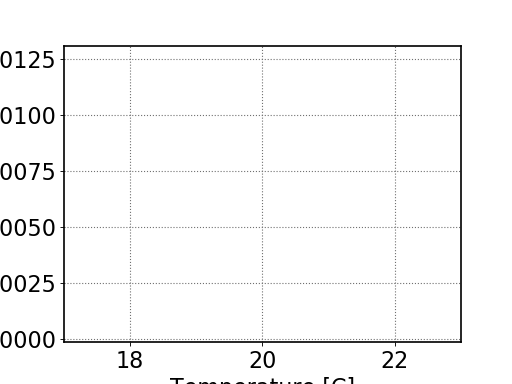

In [2]:
# test temperature sweep function

T_set = np.linspace(18,22,20)
ipg.set_wavelength(2386*u.nm)
lia.set_sensitivity(sr850.Sensitivity.x10nV_fA)
sleep(0.5)
%matplotlib notebook
fpath = collect_shg_temperature_sweep(T_set,
                                     name='test0',
                                     autogain=False,
                                     n_pts_per_setpoint=3,
                                     time_constant=sr850.TimeConstant.x1s,
                                     settle_time=3*u.second)

In [6]:
def plot_shg_temperature_sweep(ds,ax=None,color='C0'):
    if not ax:
        fig,ax = plt.subplots(1,1,figsize=(12,8))
    ax.plot(ds['T_meas'],ds['V_R']/ds['V_P_24_trans']**2,'o',color=color)
    xlimits = [ds['T_meas'].min().m-1., ds['T_meas'].max().m+1.]
    ax.set_xlabel('Temperature [C]')
    ax.set_ylabel('$P_{1.2} / P_{2.4}^2$')
    ax.set_xlim(xlimits)
    return ax

<IPython.core.display.Javascript object>


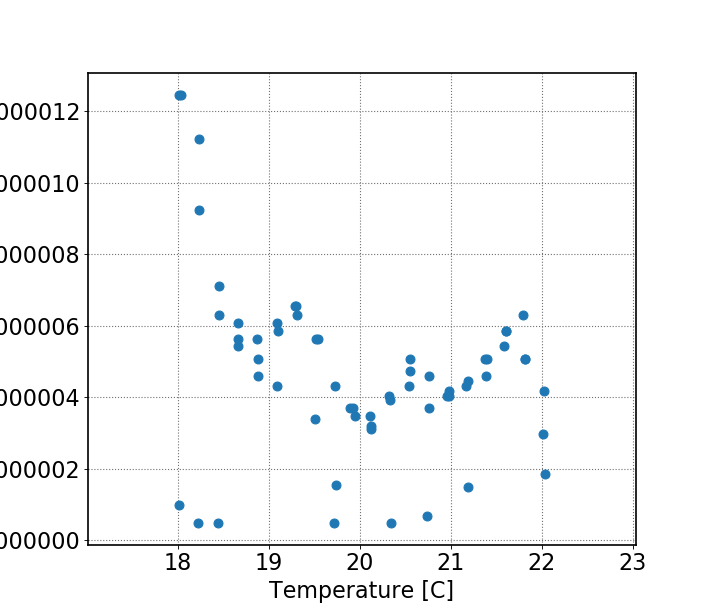

In [7]:

ds_Tsweep0 = load_shg_temperature_sweep(fpath=fpath)
plot_shg_temperature_sweep(ds_Tsweep0)

## Heater voltage sweeps

**Doped region resistivities and carrier concentrations**
![](doped_region_resistivities.PNG)

**Doped region co**
![](carrier_concentrations.PNG)

**V2 OPO ring mirror heater geometry (P1-doped)**
![](V2_opo_ring_mirror_heater_geometry_P1_doped.PNG)

**V2 OPO "U" heater geometry (P1-doped)**
![](V2_opo_U_heater_geometry_P1_doped.PNG)

In [3]:
### Expected heater resistances ###

σ = 2.11 * u.kohm # Ω/square sheet resistance of P-medium (P1 in KLayout) doped regions

## ring mirror heater
w_ring_heater = 2 * 3 * u.um # 3 um wide, 2 parallel lengths of resistor on either side of circle
r0_ring_heater = (60-8)*u.um
r1_ring_heater = (60-13)*u.um
L0_ring_heater = r0_ring_heater * np.pi - 16*u.um # measured empty sections with two more rulers not shown above 
L1_ring_heater = r1_ring_heater * np.pi - 18*u.um

n_squares_ring_heater0 = (L0_ring_heater / w_ring_heater).to(u.dimensionless).m
n_squares_ring_heater1 = (L1_ring_heater / w_ring_heater).to(u.dimensionless).m

resistance_ring_heater0 = n_squares_ring_heater0 * σ
resistance_ring_heater1 = n_squares_ring_heater1 * σ

ρ_ring_heater = 1./(1/resistance_ring_heater0 + 1/resistance_ring_heater1)

print('## ring mirror heater ##')
printval(n_squares_ring_heater0)
printval(n_squares_ring_heater1)
printval(ρ_ring_heater)


## U heater
w_U_heater = 3 * u.um # 3 um wide
r_U_heater = 42*u.um # radius of semicircle at end
L_U_heater = 700*u.um + r_U_heater * np.pi # sum of two straight regions and semicircle perimeter


n_squares_U_heater = (L_U_heater / w_U_heater).to(u.dimensionless).m
ρ_U_heater = n_squares_U_heater * σ

print('\n## U heater ##')
printval(n_squares_U_heater)
printval(ρ_U_heater)

# from carrier extraction ohmic heating of the telecom waveguides, I expect
# ~1mA * 20V = 20mW creates a local temperature difference of something like ~20-40K
# for 20mW I would need V_ring = sqrt(ρ_ring * 20mW)

print('\n## Power ==> Voltage,Current calculation ##')
P_heat = 20 * u.mW
V_ring = np.sqrt(P_heat*ρ_ring_heater).to(u.volt)
I_ring = (P_heat/V_ring).to(u.milliampere)
V_U = np.sqrt(P_heat*ρ_U_heater).to(u.volt)
I_U = (P_heat/V_U).to(u.microampere)

printval(P_heat)
printval(V_ring)
printval(I_ring)
printval(V_U)
printval(I_U)


## ring mirror heater ##
n_squares_ring_heater0: 24.6
n_squares_ring_heater1: 21.6
ρ_ring_heater: 24.3 kiloohm

## U heater ##
n_squares_U_heater: 277.3
ρ_U_heater: 585.1 kiloohm

## Power ==> Voltage,Current calculation ##
P_heat: 20.0 milliwatt
V_ring: 22.0 volt
I_ring: 0.9 milliampere
V_U: 108.2 volt
I_U: 184.9 microampere


# Grating couplers

## Reference images
some images from Shahryar's presentations for reference about the "Azimuth-Elevation" and "theta-phi" coordinate systems


**2.4$\mu$m grating coupler geometry**
![](coupler_FDTD_sim_data/gc24_geometry_screenshot.PNG)

**Shahryar's FDTD simulated emission pattern with coordinate axes**
![](coupler_FDTD_sim_data/emission_pattern_with_axes.png)

**different emission pattern demonstrating "azimuth-elevation" coordiantes**
![](coupler_FDTD_sim_data/el_az_sample.PNG)

**different emission pattern demonstrating "theta-phi" coordiantes**
![](coupler_FDTD_sim_data/th_phi_sample.PNG)

**typical meaning of azimuth-elevation coordiantes from wikipedia**
![](https://upload.wikimedia.org/wikipedia/commons/thumb/f/f7/Azimuth-Altitude_schematic.svg/436px-Azimuth-Altitude_schematic.svg.png)

**typical meaning of theta-phi coordiantes in physics from wikipedia's spherical coordiantes article**
![](https://upload.wikimedia.org/wikipedia/commons/thumb/4/4f/3D_Spherical.svg/558px-3D_Spherical.svg.png)

**typical meaning of theta-phi coordiantes in mathematics from wikipedia's spherical coordiantes article**
![](https://upload.wikimedia.org/wikipedia/commons/thumb/d/dc/3D_Spherical_2.svg/558px-3D_Spherical_2.svg.png)

In this data, -179<$\theta$<180 and -90<$\phi$<90

## load data

In [29]:
# import data from Shahryar's FDTD simulation of 2.4um grating couplers on IMEC chips (at least V1, I think all three versions)

data_dir = 'coupler_FDTD_sim_data'
# fname_12_tp_log = 'GC_1.2um_ThetaPhi_3DFF_Gain.txt'
# fname_12_tp_lin = 'GC_1.2um_ThetaPhi_3DFF_Gain_Linear.txt'
fname_12_ae_log = 'GC_1.2um_AzEl_3DFF_Gain.txt'
fname_12_ae_lin = 'GC_1.2um_AzEl_3DFF_Gain_Linear.txt'
# fname_24_tp_log = 'GC_2.4um_ThetaPhi_3DFF_Gain.txt'
# fname_24_tp_lin = 'GC_2.4um_ThetaPhi_3DFF_Gain_Linear.txt'
fname_24_ae_log = 'GC_2.4um_AzEl_3DFF_Gain.txt'
fname_24_ae_lin = 'GC_2.4um_AzEl_3DFF_Gain_Linear.txt'

# data_theta_phi = np.loadtxt(path.normpath(path.join(data_dir,fname_12_tp_log)),usecols=(0,1),skiprows=2)
# data_12_tp_log_flat = np.loadtxt(path.normpath(path.join(data_dir,fname_12_tp_log)),usecols=2,skiprows=2)
# data_12_tp_lin_flat = np.loadtxt(path.normpath(path.join(data_dir,fname_12_tp_lin)),usecols=2,skiprows=2)
# data_24_tp_log_flat = np.loadtxt(path.normpath(path.join(data_dir,fname_24_tp_log)),usecols=2,skiprows=2)
# data_24_tp_lin_flat = np.loadtxt(path.normpath(path.join(data_dir,fname_24_tp_lin)),usecols=2,skiprows=2)

data_azimuth_elevation = np.loadtxt(path.normpath(path.join(data_dir,fname_12_ae_log)),usecols=(0,1),skiprows=2)
data_12_ae_log_flat = np.loadtxt(path.normpath(path.join(data_dir,fname_12_ae_log)),usecols=2,skiprows=2)
data_12_ae_lin_flat = np.loadtxt(path.normpath(path.join(data_dir,fname_12_ae_lin)),usecols=2,skiprows=2)
data_24_ae_log_flat = np.loadtxt(path.normpath(path.join(data_dir,fname_24_ae_log)),usecols=2,skiprows=2)
data_24_ae_lin_flat = np.loadtxt(path.normpath(path.join(data_dir,fname_24_ae_lin)),usecols=2,skiprows=2)

data_test = np.loadtxt(path.normpath(path.join(data_dir,fname_12_ae_log)),usecols=1,skiprows=2)

# # generate theta,phi and azimuthal,elevation angle meshgrids
# old_theta, old_phi = np.meshgrid(np.array(data_theta_phi[:360,0]),np.array(data_theta_phi[::360,1]))
elevation, azimuth = np.meshgrid(np.array(data_azimuth_elevation[:360,0]),np.array(data_azimuth_elevation[::360,1]))

# convert flattened array intensity data into 2D grids of I values corresponding to 2D angle meshgrids
# all data has shape (181,360)

n_azimuth = 181
n_elevation = 360

n_old_phi = 181
n_old_theta = 360

data_24_ae_lin = np.array([[data_24_ae_lin_flat[j*n_elevation+i] for i in range(n_elevation)] for j in range(n_azimuth)])
data_24_ae_log = np.array([[data_24_ae_log_flat[j*n_elevation+i] for i in range(n_elevation)] for j in range(n_azimuth)])

data_12_ae_lin = np.array([[data_12_ae_lin_flat[j*n_elevation+i] for i in range(n_elevation)] for j in range(n_azimuth)])
data_12_ae_log = np.array([[data_12_ae_log_flat[j*n_elevation+i] for i in range(n_elevation)] for j in range(n_azimuth)])

# data_24_tp_lin = np.array([[data_24_tp_lin_flat[j*n_old_theta+i] for i in range(n_old_theta)] for j in range(n_old_phi)])
# data_24_tp_log = np.array([[data_24_tp_log_flat[j*n_old_theta+i] for i in range(n_old_theta)] for j in range(n_old_phi)])

# data_12_tp_lin = np.array([[data_12_tp_lin_flat[j*n_old_theta+i] for i in range(n_old_theta)] for j in range(n_old_phi)])
# data_12_tp_log = np.array([[data_12_tp_log_flat[j*n_old_theta+i] for i in range(n_old_theta)] for j in range(n_old_phi)])



## coordinate transformation

In [135]:
#### transform to sensible coordinate system

# switch to radians first
old_phi_rad = np.deg2rad(old_phi)
old_theta_rad = np.deg2rad(old_theta)

# following the general coordinate transformation procedure between spherical coordinate axes described here:
# https://math.stackexchange.com/questions/2015343/vector-transform-spherical-coordinates-in-one-frame-to-another-staying-in-sphe

## step 1:
# transform to cartesian coordinates in original coordinate system 

# note I am treating the coordinate system in the figure above as essentially incorrect

# their y should be z, their x should be y, and their z should be x 
# to make their y the polar axis of the coordinate system
# this is needed to justify the fact that their theta, which is in the x-z plane and has 360 degree span
# while their phi runs from -90 to 90

old_x = np.cos(old_phi_rad) * np.cos(old_theta_rad)
old_y = np.cos(old_phi_rad) * np.sin(old_theta_rad)
old_z = np.sin(old_phi_rad)

## step 2:
# use transformation matrix:

# describing the rotation of the axes needed to transform from their old ones to your new ones
# with old_theta = gamma, old_phi = delta

gamma = np.pi / 2.0
delta = - np.pi / 2.0



T = np.array(   [ [np.sin(delta)*np.cos(gamma), np.sin(delta)*np.sin(gamma), -np.cos(delta)],
                  [-np.sin(gamma), np.cos(gamma), 0.0],
                  [np.cos(delta)*np.cos(gamma), np.cos(delta)*np.sin(gamma), np.sin(delta)] ] )

print('T:')
print(T)

new_x = T[0,0]*old_x + T[0,1]*old_y + T[0,2]*old_z
new_y = T[1,0]*old_x + T[1,1]*old_y + T[1,2]*old_z
new_z = T[2,0]*old_x + T[2,1]*old_y + T[2,2]*old_z

# to swap cartesian axes in this system

## step 3: 
# transform back to spherical coordinates and identify new angles as functions of old ones

# find coordiante transformations here:
# https://en.wikipedia.org/wiki/List_of_common_coordinate_transformations#From_Cartesian_coordinates_2

# note from wikipedia
# use np.arctan2(a,b) to calculate arctan(a/b) while correctly choosing the quadrant based on the signs of a and b


a1 = np.sqrt( new_x**2 + new_y**2 )
b1 = new_z

a2 = new_y
b2 = new_x

# phi = np.rad2deg(np.arctan2(a1,b1)) # -pi < phi < pi, azimuthal angle
# theta = np.rad2deg(np.arctan(a2/b2)) # -pi/2 < theta < pi/2, polar angle (or "elevation")

phi = np.rad2deg(np.arctan2(a2,b2)) # -pi < phi < pi, azimuthal angle
theta = np.rad2deg(np.arctan(a1/b1)) # -pi/2 < theta < pi/2, polar angle (or "elevation")

# phi = np.rad2deg(np.arctan2(a2,b2)) # -pi < phi < pi, azimuthal angle
# theta = np.rad2deg(np.arctan2(a1,b1))-90. # -pi/2 < theta < pi/2, polar angle (or "elevation")




printspan(a1)
printspan(b1)
printspan(a2)
printspan(b2)
printspan(phi)
printspan(theta)


T:
[[-6.123e-17 -1.000e+00 -6.123e-17]
 [-1.000e+00  6.123e-17  0.000e+00]
 [ 3.749e-33  6.123e-17 -1.000e+00]]
max a1:  1.0
min a1:  0.0
max b1:  1.0
min b1: -1.0
max a2:  1.0
min a2: -1.0
max b2:  1.0
min b2: -1.0
max phi: 180.0
min phi: -179.5
max theta: 90.0
min theta: -90.0


In [136]:


# data_12_tp_log.shape
# :(65160, 3)

# theta.shape
# : (360,)

# theta.max()
# : 179

# theta.min()
# -180

# phi.shape
# : (181,)

# phi.min()
# : -90
    
# phi.max()
# : 90



# note, we only get -90<phi<90 (181 points) because of the mirror symmetry in the XZ plane
# the plot the intensity is the same under the transformation: phi-> mod(phi+180,360)


## plots and analysis

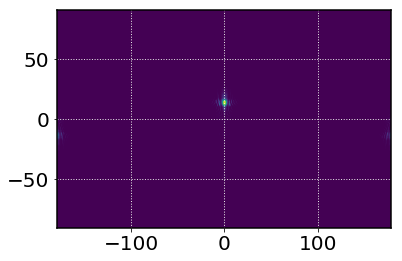

In [250]:
plt.pcolormesh(elevation,azimuth,np.flipud(test_ae),cmap=cm.viridis)
#plt.pcolormesh(test_ae,cmap=cm.viridis)

ax = plt.gca()
ax.grid(color='0.9')
# ax.set_ylim([-10,30])
# ax.set_xlim([-20,20])

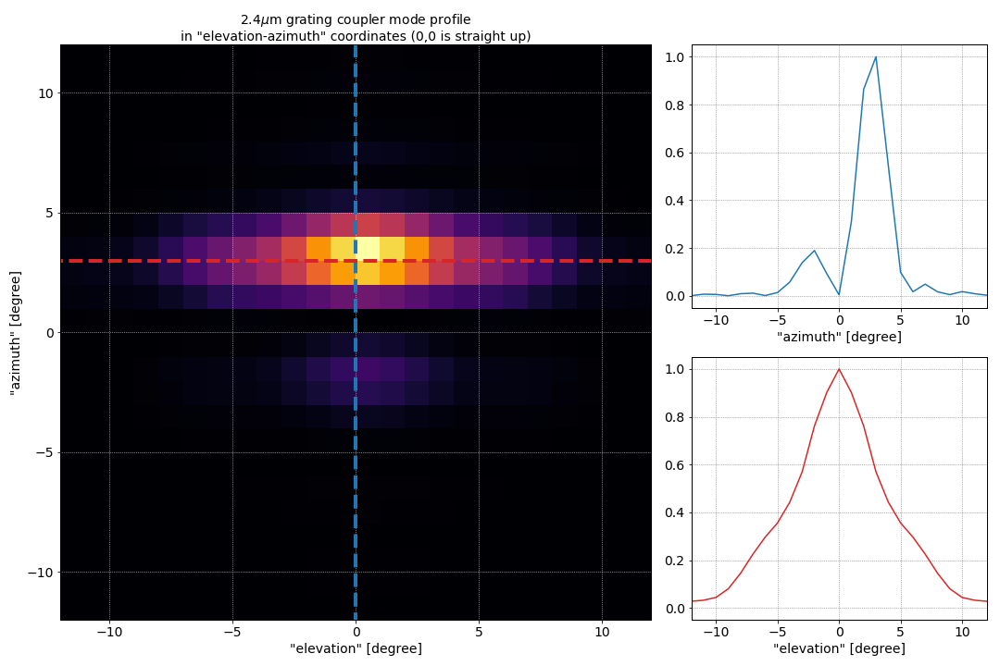

In [39]:
# plot 2.4um grating coupler mode profile for mode matching
from matplotlib.gridspec import GridSpec
import matplotlib.cm as cm
%matplotlib inline
d = data_24_ae_lin[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()
a_lim = 12

el = elevation[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()[0,:]
az = azimuth[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()[:,0]
az_ind_max,el_ind_max = np.unravel_index(d.argmax(),d.shape)
az_max = az[az_ind_max]
el_max = el[el_ind_max]

fig = plt.figure(figsize=(15,10))
gs = GridSpec(2,2,width_ratios=(2,1),height_ratios=(1,1))

ax0 = fig.add_subplot(gs[:,0])
ax0.pcolormesh(el,az,d,cmap=cm.inferno)
ax0.grid(color='0.9')
ax0.set_ylim([-a_lim,a_lim])
ax0.set_xlim([-a_lim,a_lim])
ax0.vlines(el_max,az.min(),az.max(),color='C0',linestyle='--',linewidths=4)
ax0.hlines(az_max,el.min(),el.max(),color='C3',linestyle='--',linewidths=4)
ax0.set_xlabel('"elevation" [degree]')
ax0.set_ylabel('"azimuth" [degree]')

ax1 = fig.add_subplot(gs[0,1])
ax1.plot(az,d[:,el_ind_max]/d.max(),'C0')
ax1.set_xlim([-a_lim,a_lim])
ax1.set_xlabel('"azimuth" [degree]')

ax2 = fig.add_subplot(gs[1,1])
ax2.plot(el,d[az_ind_max,:]/d.max(),'C3')
ax2.set_xlim([-a_lim,a_lim])
ax2.set_xlabel('"elevation" [degree]')

ax0.set_title('2.4$\mu$m grating coupler mode profile\nin "elevation-azimuth" coordinates (0,0 is straight up)')
gs.tight_layout(fig)

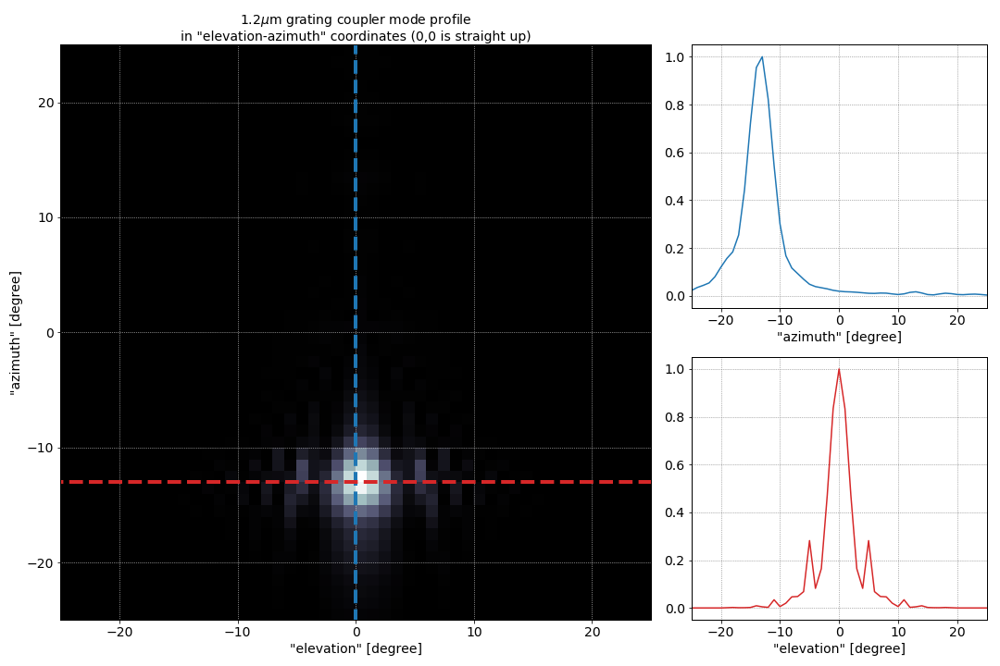

In [40]:
# plot 1.2um grating coupler mode profile for mode matching

d = data_12_ae_lin[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()
a_lim = 25

el = elevation[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()[0,:]
az = azimuth[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()[:,0]
az_ind_max,el_ind_max = np.unravel_index(d.argmax(),d.shape)
az_max = az[az_ind_max]
el_max = el[el_ind_max]

fig = plt.figure(figsize=(15,10))
gs = GridSpec(2,2,width_ratios=(2,1),height_ratios=(1,1))

ax0 = fig.add_subplot(gs[:,0])
ax0.pcolormesh(el,az,d,cmap=cm.bone)
ax0.grid(color='0.9')
ax0.set_ylim([-a_lim,a_lim])
ax0.set_xlim([-a_lim,a_lim])
ax0.vlines(el_max,az.min(),az.max(),color='C0',linestyle='--',linewidths=4)
ax0.hlines(az_max,el.min(),el.max(),color='C3',linestyle='--',linewidths=4)
ax0.set_xlabel('"elevation" [degree]')
ax0.set_ylabel('"azimuth" [degree]')

ax1 = fig.add_subplot(gs[0,1])
ax1.plot(az,d[:,el_ind_max]/d.max(),'C0')
ax1.set_xlim([-a_lim,a_lim])
ax1.set_xlabel('"azimuth" [degree]')

ax2 = fig.add_subplot(gs[1,1])
ax2.plot(el,d[az_ind_max,:]/d.max(),'C3')
ax2.set_xlim([-a_lim,a_lim])
ax2.set_xlabel('"elevation" [degree]')

ax0.set_title('1.2$\mu$m grating coupler mode profile\nin "elevation-azimuth" coordinates (0,0 is straight up)')
gs.tight_layout(fig)

In [66]:
### perform gaussian fits to get target spot sizes for mode matching, plotted below
from scipy.optimize import minimize_scalar, curve_fit

## isolate data for fitting
f = 20 * u.mm
lm = 2.4*u.um

d_24 = data_24_ae_lin[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()
d_12 = data_12_ae_lin[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()
r_lim = 7

color_12 = 'C4'
color_24 = 'C1'

r_el = f*np.tan(np.deg2rad(elevation[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()[0,:]))
r_az = f*np.tan(np.deg2rad(azimuth[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()[:,0]))

r_az_ind_max_24,r_el_ind_max_24 = np.unravel_index(d_24.argmax(),d_24.shape)
r_az_max_24 = r_az[r_az_ind_max_24]
r_el_max_24 = r_el[r_el_ind_max_24]

r_az_ind_max_12,r_el_ind_max_12 = np.unravel_index(d_12.argmax(),d_12.shape)
r_az_max_12 = r_az[r_az_ind_max_12]
r_el_max_12 = r_el[r_el_ind_max_12]

r_parallel = r_az # linear dimension parallel to waveguide for astigmatic mode shape fit
I_parallel_24 = d_24[:,r_el_ind_max_24]/d_24.max()
I_parallel_12 = d_12[:,r_el_ind_max_12]/d_12.max()
r_perp = r_el # linear dimension perpendicular to waveguide for astigmatic mode shape fit
I_perp_24 = d_24[r_az_ind_max_24,:]/d_24.max()
I_perp_12 = d_12[r_az_ind_max_12,:]/d_12.max()

## fit the data to the relative intensity distribution of a gaussian beam to extract the waist
def I_rel_Gauss(r,r0,w0):
    return np.exp(-2*(r-r0)**2 / ( w0**2 ))

# fit masks
mask_parallel_24 = r_parallel.m > 0.0
mask_parallel_12 = r_parallel.m < 0.0
mask_perp_24 = r_perp.m > -1000.0 #True
mask_perp_12 = r_perp.m > -1000.0 #True


# initial guesses
p0_parallel_24 = [1.0,0.8]
p0_parallel_12 = [-4.5,1.5]
p0_perp_24 = [0.0,2.2]
p0_perp_12 = [0.0,1.1]

popt_parallel_24, pcov_parallel_24 = curve_fit(I_rel_Gauss,
                                               r_parallel.m[mask_parallel_24],
                                               I_parallel_24[mask_parallel_24],
                                               p0=p0_parallel_24)

popt_perp_24, pcov_perp_24 = curve_fit(I_rel_Gauss,
                                               r_perp.m[mask_perp_24],
                                               I_perp_24[mask_perp_24],
                                               p0=p0_perp_24)

popt_parallel_12, pcov_parallel_12 = curve_fit(I_rel_Gauss,
                                               r_parallel.m[mask_parallel_12],
                                               I_parallel_12[mask_parallel_12],
                                               p0=p0_parallel_12)

popt_perp_12, pcov_perp_12 = curve_fit(I_rel_Gauss,
                                               r_perp.m[mask_perp_12],
                                               I_perp_12[mask_perp_12],
                                               p0=p0_perp_12)



r_parallel_fit = np.linspace(-10,10,300)
r_perp_fit = np.linspace(-10,10,300)

w0_parallel_24_fit = popt_parallel_24[1] * u.mm
r0_parallel_24_fit = popt_parallel_24[0] * u.mm
zR_parallel_24_fit = (np.pi * w0_parallel_24_fit**2 / (2.4*u.um)).to(u.cm)
I_parallel_24 = I_rel_Gauss(r_parallel_fit,r0_parallel_24_fit.m,w0_parallel_24_fit.m)

w0_perp_24_fit = popt_perp_24[1] * u.mm
r0_perp_24_fit = popt_perp_24[0] * u.mm
zR_perp_24_fit = (np.pi * w0_perp_24_fit**2 / (2.4*u.um)).to(u.cm)
I_perp_24 = I_rel_Gauss(r_perp_fit,r0_perp_24_fit.m,w0_perp_24_fit.m)

w0_parallel_12_fit = popt_parallel_12[1] * u.mm
r0_parallel_12_fit = popt_parallel_12[0] * u.mm
zR_parallel_12_fit = (np.pi * w0_parallel_12_fit**2 / (1.2*u.um)).to(u.cm)
I_parallel_12 = I_rel_Gauss(r_parallel_fit,r0_parallel_12_fit.m,w0_parallel_12_fit.m)

w0_perp_12_fit = popt_perp_12[1] * u.mm
r0_perp_12_fit = popt_perp_12[0] * u.mm
zR_perp_12_fit = (np.pi * w0_perp_12_fit**2 / (1.2*u.um)).to(u.cm)
I_perp_12 = I_rel_Gauss(r_perp_fit,r0_perp_12_fit.m,w0_perp_12_fit.m)


# print fit values
printval(r0_parallel_24_fit,p=3)
printval(w0_parallel_24_fit,p=3)
printval(zR_parallel_24_fit,p=1)

printval(r0_perp_24_fit,p=3)
printval(w0_perp_24_fit,p=3)
printval(zR_perp_24_fit,p=1)

printval(r0_parallel_12_fit,p=3)
printval(w0_parallel_12_fit,p=3)
printval(zR_parallel_12_fit,p=1)

printval(r0_perp_12_fit,p=3)
printval(w0_perp_12_fit,p=3)
printval(zR_perp_12_fit,p=1)

r0_parallel_24_fit: 0.946 millimeter
w0_parallel_24_fit: 0.797 millimeter
zR_parallel_24_fit: 83.2 centimeter
r0_perp_24_fit: 0.000 millimeter
w0_perp_24_fit: 2.437 millimeter
zR_perp_24_fit: 777.7 centimeter
r0_parallel_12_fit: -4.752 millimeter
w0_parallel_12_fit: 1.663 millimeter
zR_parallel_12_fit: 724.1 centimeter
r0_perp_12_fit: -0.000 millimeter
w0_perp_12_fit: 1.169 millimeter
zR_perp_12_fit: 358.0 centimeter


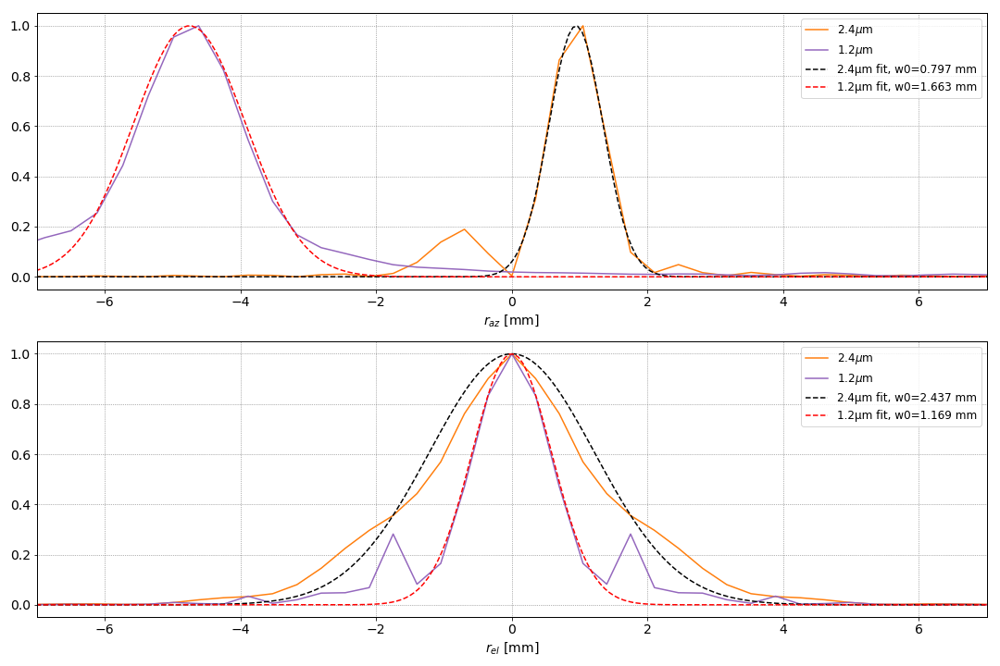

In [72]:
# using an f=20mm singlet these offset angles and angular widths plotted above should be roughly converted spot sizes
# at the lens

f = 20 * u.mm

d_24 = data_24_ae_lin[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()
d_12 = data_12_ae_lin[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()
r_lim = 7

color_12 = 'C4'
color_24 = 'C1'

r_el = f*np.tan(np.deg2rad(elevation[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()[0,:]))
r_az = f*np.tan(np.deg2rad(azimuth[:,np.where((-90<elevation[0,:])*(elevation[0,:]<90))].squeeze()[:,0]))

r_az_ind_max_24,r_el_ind_max_24 = np.unravel_index(d_24.argmax(),d_24.shape)
r_az_max_24 = r_az[r_az_ind_max_24]
r_el_max_24 = r_el[r_el_ind_max_24]

r_az_ind_max_12,r_el_ind_max_12 = np.unravel_index(d_12.argmax(),d_12.shape)
r_az_max_12 = r_az[r_az_ind_max_12]
r_el_max_12 = r_el[r_el_ind_max_12]

fig = plt.figure(figsize=(15,10))
gs = GridSpec(2,1,height_ratios=(1,1))

ax0 = fig.add_subplot(gs[0])

ax0.plot(r_az,d_24[:,r_el_ind_max_24]/d_24.max(),'-',color=color_24,label='2.4$\mu$m')
ax0.plot(r_az,d_12[:,r_el_ind_max_12]/d_12.max(),'-',color=color_12,label='1.2$\mu$m')
ax0.plot(r_parallel_fit,I_parallel_24,'k--',label=f'2.4μm fit, w0={w0_parallel_24_fit.m:3.3f} mm')
ax0.plot(r_parallel_fit,I_parallel_12,'r--',label=f'1.2μm fit, w0={w0_parallel_12_fit.m:3.3f} mm')
ax0.set_xlim([-r_lim,r_lim])
ax0.set_xlabel('$r_{az}$ [mm]')

ax1 = fig.add_subplot(gs[1])
ax1.plot(r_el,d_24[r_az_ind_max_24,:]/d_24.max(),'-',color=color_24,label='2.4$\mu$m')
ax1.plot(r_el,d_12[r_az_ind_max_12,:]/d_12.max(),'-',color=color_12,label='1.2$\mu$m')
ax1.plot(r_perp_fit,I_perp_24,'k--',label=f'2.4μm fit, w0={w0_perp_24_fit.m:3.3f} mm')
ax1.plot(r_perp_fit,I_perp_12,'r--',label=f'1.2μm fit, w0={w0_perp_12_fit.m:3.3f} mm')
ax1.set_xlim([-r_lim,r_lim])
ax1.set_xlabel('$r_{el}$ [mm]')

ax0.legend()
ax1.legend()

gs.tight_layout(fig)

**separation of 2.4$\mu$m grating coupler**
![](coupler_FDTD_sim_data/OPO_gc24_separation.PNG)


In [42]:
# Define stereographic map function for polar map
def sg_map(lat_deg,long_deg,lat0_deg=0,long0_deg=0):
    lat0 = np.deg2rad(lat0_deg)
    lat = np.deg2rad(lat_deg)
    long0 = np.deg2rad(long0_deg)
    long = np.deg2rad(long_deg)
    k = 1 / ( 1 + np.sin(lat0) * np.sin(lat) + np.cos(lat0) * np.cos(lat) * np.cos(long-long0) )
    x = k * np.cos(lat) * np.sin(long - long0)
    y = k * ( np.cos(lat0) * np.sin(lat) - np.sin(lat0) * np.cos(lat) * np.cos(long - long0) )
    return x, y



# Define a function to plot gridlines for stereographically mapped coordinant system
def sg_grid(ax,color='k',npts=300):
    lat = ( np.linspace(-80,80,npts) )
    for ang in np.linspace(-90,90,19):
        long = ( np.ones(npts) * ang ) 
        x,y = sg_map(lat,long)
        plt.plot(x,y,color)

    long = ( np.linspace(-90,90,npts) )
    for ang in np.linspace(-90,90,19):
        lat = ( np.ones(npts) * ang ) 
        x,y = sg_map(lat,long)
        plt.plot(x,y,color)

In [77]:
lm = 2.4*u.um

# 2.4um grating coupler mode matching through Mitutoyo 20x objective
# # w_skinny = w0_parallel_24_fit # waist (1/e^2 diameter) parallel to wg optical axis at 20mm from FDTD data above
# # w_fat = w0_perp_24_fit # waist (1/e^2 diameter) perpendicular to waveguide optical axis at 20mm from FDTD data above

# printval(w_skinny,p=3)
# printval(w_fat,p=3)

# Mitutoyo NIR M Plan Apo 20x details
ba_meas = 8 * u.mm # back aperture diameter, measured
fa_meas = 23 * u.mm # front aperture diameter, measured
NA = 0.4 
wd = 20 * u.mm # working distance, from data sheet: https://www.mitutoyo.com/wp-content/uploads/2012/11/E4191-378_010611.pdf
theta = np.arcsin(NA) * u.rad
theta_deg = theta.to(u.deg)
fa_theory = 2 * wd * np.tan(theta) # theoretical front aperture (diameter) from official working distance and NA
ba_eff = ba_meas * fa_theory / fa_meas # assume the same fraction of the front and back lenses are used
w_parallel_ba = w_skinny * ba_eff / fa_theory
w_perp_ba = w_fat * ba_eff / fa_theory
zR_parallel_ba = (np.pi * w_skinny_ba**2 / lm).to(u.cm)
zR_perp_ba = (np.pi * w_fat_ba**2 / lm).to(u.cm)

printval(fa_theory)
printval(theta)
printval(theta_deg)
printval(ba_eff)
printval(w_parallel_ba,p=3)
printval(w_perp_ba,p=3)
printval(zR_parallel_ba)
printval(zR_perp_ba)

fa_theory: 17.5 millimeter
theta: 0.4 radian
theta_deg: 23.6 degree
ba_eff: 6.1 millimeter
w_parallel_ba: 0.277 millimeter
w_perp_ba: 0.848 millimeter
zR_parallel_ba: 10.1 centimeter
zR_perp_ba: 94.1 centimeter


In [5]:
# 2.4um grating coupler output mode shape vs. distance for mode matching
# measured with Fejer group bolometer camera. corresponding images saved if needed

# "d" is ~1/e^2 intensity full width, so d/2=w, where w is the gaussian waist

# at ~53mm behind mitutoyo NIR 20x objective back aperture
dx_53 = 3.3*u.mm
dy_53 = 0.6*u.mm


# at ~63mm behind mitutoyo NIR 20x objective back aperture
dx_63 = 3*u.mm
dy_63 = 1*u.mm

# at 74mm behind mitutoyo NIR 20x objective back aperture
dx_74 = 4.5*u.mm
dy_74 = 1.9*u.mm

# I want to set the spot size near the first input steering mirror for 2.4um light, ~67mm from the objective back aperture



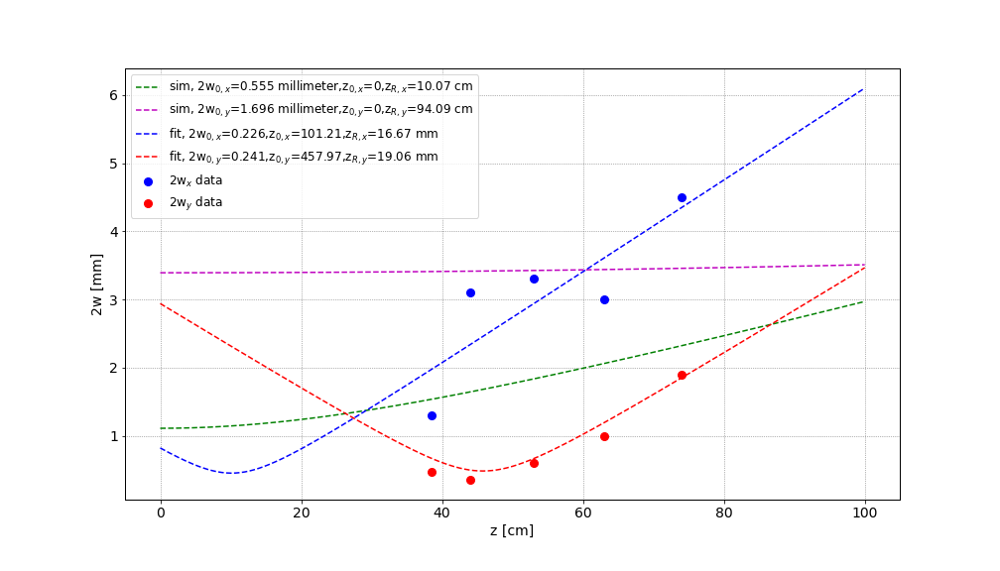

In [84]:
# plot measured output mode waist data with gaussian fits and expected gaussian shape

from scipy.optimize import curve_fit
lm_mm = (2.4*u.um).to(u.mm).m

def f_2w_fit(z,z0,w0):
    zR = np.pi * w0**2 / lm_mm
    return 2*w0 * np.sqrt( 1 + ( (z-z0) / zR )**2 )

#z_data = np.array([38.5,44,53,63,74]) # mm  This must be wrong.... I must have meant cm
z_data_cm = np.array([38.5,44,53,63,74]) * u.cm # cm
z_data = z_data_cm.to(u.mm).m  # mm
dx_data = np.array([1.3,3.1,3.3,3.,4.5]) # mm
dy_data = np.array([0.47,0.35,0.6,1.,1.9]) # mm

p0_x = (10.,.02)
p0_y = (0.,.03)#(40.,.3)

popt_x, pcov_x = curve_fit(f_2w_fit, z_data,dx_data,p0=p0_x)
popt_y, pcov_y = curve_fit(f_2w_fit, z_data,dy_data,p0=p0_y)

w0_x_fit = popt_x[1]/2.0
zR_x_fit = np.pi * w0_x_fit**2 / lm_mm

w0_y_fit = popt_y[1]/2.0
zR_y_fit = np.pi * w0_y_fit**2 / lm_mm

z_fit = np.linspace(0,1000,300)
dx_fit = f_2w_fit(z_fit,*popt_x)
dy_fit = f_2w_fit(z_fit,*popt_y)

## note that "y" in this beam waist data corresponds to the waist perpendicular to the wg in the plane of the chip,
## and "x" corresponds to the waist parallel to the wg axis
## also note that waists calculated from FDTD data above are gaussian 1/e^2 radii, while dx/dy in this measured data should be the 1/e^2 diameter
dx_sim = f_2w_fit(z_fit,0.0,2*w_parallel_ba.to(u.mm).m)
dy_sim = f_2w_fit(z_fit,0.0,2*w_perp_ba.to(u.mm).m)

## from FDTD simulation of beam launch from grating coupler


fig = plt.figure(figsize=(14,8))
ax = fig.add_subplot(111)

ax.plot(z_fit/10,dx_sim,'g--',label='sim, 2w$_{0,x}$='+f'{2*w_parallel_ba:3.3f}'+',z$_{0,x}$=0,z$_{R,x}$='+f'{zR_parallel_ba.m:3.2f} cm')
ax.plot(z_fit/10,dy_sim,'m--',label='sim, 2w$_{0,y}$='+f'{2*w_perp_ba:3.3f}'+',z$_{0,y}$=0,z$_{R,y}$='+f'{zR_perp_ba.m:3.2f} cm')
ax.plot(z_fit/10,dx_fit,'b--',label='fit, 2w$_{0,x}$='+f'{2*w0_x_fit:3.3f}'+',z$_{0,x}$='+f'{popt_x[0]:3.2f}'+',z$_{R,x}$='+f'{zR_x_fit:3.2f} mm')
ax.plot(z_fit/10,dy_fit,'r--',label='fit, 2w$_{0,y}$='+f'{2*w0_y_fit:3.3f}'+',z$_{0,y}$='+f'{popt_y[0]:3.2f}'+',z$_{R,y}$='+f'{zR_y_fit:3.2f} mm')
ax.plot(z_data/10,dx_data,'bo',label='2w$_x$ data')
ax.plot(z_data/10,dy_data,'ro',label='2w$_y$ data')


ax.set_xlabel('z [cm]')
ax.set_ylabel('2w [mm]')
ax.legend()

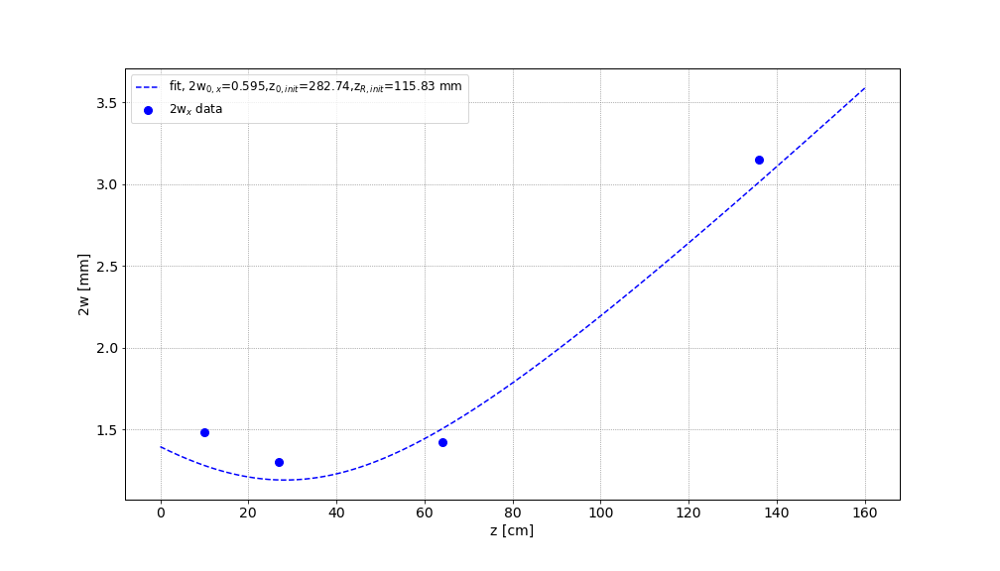

In [104]:
##### mode matching ######

def f_2w_fit(z,z0,w0):
    zR = np.pi * w0**2 / lm_mm
    return 2*w0 * np.sqrt( 1 + ( (z-z0) / zR )**2 )

# mode profile data after collimating from PM2000 fiber with f=5.95mm BD2 asphere
z_data_init_cm = np.array([10,27,64,136,]) * u.cm # cm
z_data_init = z_data_init_cm.to(u.mm).m  # mm
d_data_init = np.array([1.48,1.3,1.42,3.15,]) # mm


p0_init = (0.,0.65)
popt_init, pcov_init = curve_fit(f_2w_fit, z_data_init,d_data_init,p0=p0_init)

w0_init_fit = popt_init[1]/2.0
zR_init_fit = np.pi * w0_init_fit**2 / lm_mm

z_fit = np.linspace(0,1600,300)
d_fit_init = f_2w_fit(z_fit,*popt_init)

# plot

fig = plt.figure(figsize=(14,8))
ax = fig.add_subplot(111)

ax.plot(z_fit/10,d_fit_init,'b--',label='fit, 2w$_{0,x}$='+f'{2*w0_init_fit:3.3f}'+',z$_{0,init}$='+f'{popt_init[0]:3.2f}'+',z$_{R,init}$='+f'{zR_init_fit:3.2f} mm')
ax.plot(z_data_init/10,d_data_init,'bo',label='2w$_x$ data')


ax.set_xlabel('z [cm]')
ax.set_ylabel('2w [mm]')
ax.legend()

In [105]:
# from watching the measured wavelength of the 2μm SFTL on the Bristol wavementer:
lm = 2.382*u.um
std_dev_lm = 5*u.pm

std_dev_f = lm.to(u.GHz,'sp') - (lm+std_dev_lm).to(u.GHz,'sp')

printval(std_dev_f)

std_dev_f: 0.3 gigahertz


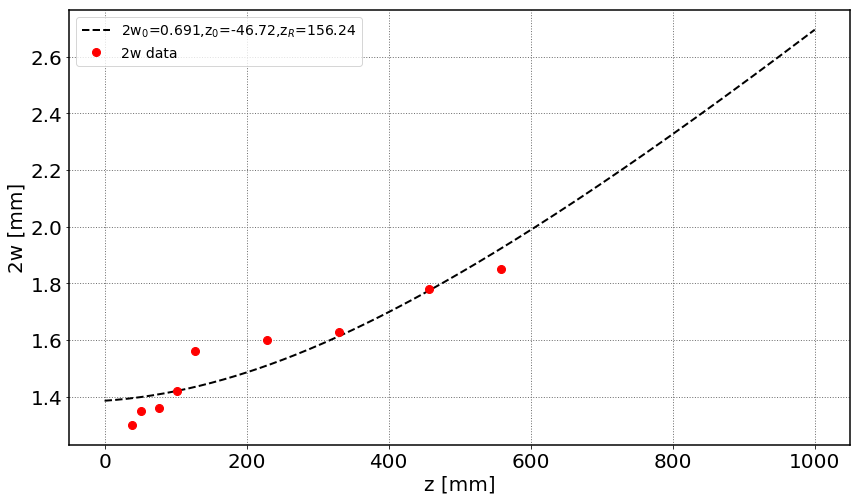

In [25]:
# measure and fit gaussian beam from fixed focus fiber launch (f = 5.95 mm,NA = 0.56 Mounted BD2 Geltech Aspheric Lens) @ 2.4um

lm_mm = (2.4*u.um).to(u.mm).m

def f_2w_fit(z,z0,w0):
    zR = np.pi * w0**2 / lm_mm
    return 2*w0 * np.sqrt( 1 + ( (z-z0) / zR )**2 )

z_data = np.array([1.5,2,3,4,5,9,13,18,22]) * u.inch # distance from fiber launch
z_data_mm = z_data.to(u.mm).m
d_data = np.array([1.3,1.35,1.36,1.42,1.56,1.6,1.63,1.78,1.85]) # 1/e^2 beam diameter in mm

p0 = (10.,.02)

popt, pcov = curve_fit(f_2w_fit, z_data_mm,d_data,p0=p0)

w0_fit = popt[1]/2.0
zR_fit = np.pi * w0_fit**2 / lm_mm

z_fit = np.linspace(0,1000,300)
d_fit = f_2w_fit(z_fit,*popt)


fig = plt.figure(figsize=(14,8))
ax = fig.add_subplot(111)

ax.plot(z_fit,d_fit,'k--',label='2w$_{0}$='+f'{2*w0_fit:3.3f}'+',z$_{0}$='+f'{popt[0]:3.2f}'+',z$_{R}$='+f'{zR_fit:3.2f}')
ax.plot(z_data_mm,d_data,'ro',label='2w data')



ax.set_xlabel('z [mm]')
ax.set_ylabel('2w [mm]')
ax.legend()


In [54]:
# Note 2.4um input fiber coupling efficiency and voltage-to-power ratio of 2.4um sampler detector on microscope

P_offset = 5 * u.mW # small DC thermal detector offset

### 2.4um fiber couple efficiency measurements ###

# Oct 23 2018
P_in_24 = 290*u.mW - P_offset # avg. power measured with thermal detector after chopper, 50% duty cycle 
P_out_24 = 53*u.mW - P_offset # after passes through 6 D-coated lenses (5 CaF2 singlet, 1 BD2 asphere) and one 2.2um HWP

eta_fc_24 = (P_out_24 / P_in_24).m

### sample detector calibration measurements ###
## sample is taken with UC CaF2 8deg wedge, T~92%, measuring one of two 4% spots
## detector is DET10D with 50Ohm load resistor and NE30A absorbtive attenuator, ~6dB at 2.4um

# Oct 23 2018
P_microscope_24 = 2*(53*u.mW - P_offset) # peak power of 50% duty cycle chopped signal's P_avg measured with thermal detector
V_sample_det_24 = 73 * u.mV # full amplitude of square wave measured with scope

sample_voltage_to_power = (P_microscope_24 / V_sample_det_24).to(u.mW/u.mV)

printval(eta_fc_24,p=3)
printval(sample_voltage_to_power)

eta_fc_24: 0.168
sample_voltage_to_power: 1.3 milliwatt / millivolt


In [46]:
# estimate 2.4um power in the device based on detected transmitted signal amplitude
# also conservatively estimate peak SHG power expected

# 2.4um detector properties (Thorlabs PDA10D2)
responsivity_24 = 1.3 * u.ampere / u.watt
tia_gain_24 = 1e4 * u.volt / u.ampere
NEP_24 = 1e-11*u.watt/(u.Hz**(0.5))
det_bw_24 = 10 * u.kHz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)

# # 1.2um detector properties (Thorlabs PDA10CF)
# responsivity_12 = 0.76 * u.ampere / u.watt
# tia_gain_12 = 1e4 * u.volt / u.ampere
# NEP_12 = 1.2e-11*u.watt/(u.Hz**(0.5)) # this is the NEP at peak responsivity = 1.04A/W @ 1.5um, should adjust
# det_bw_12 = 1 * u.Hz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)

# # 1.2um detector properties (Thorlabs PDA10CS at 60dB gain setting)
# responsivity_12 = 0.83 * u.ampere / u.watt
# tia_gain_12 = 1.5e6 * u.volt / u.ampere
# NEP_12 = 1.5e-12*u.watt/(u.Hz**(0.5)) # this is the NEP at peak responsivity = 1.04A/W @ 1.5um, should adjust
# det_bw_12 = 3e3 * u.Hz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)


# 1.2um detector properties (New Focus 2011 "candybar" at G=1e4 gain setting)
responsivity_12 = 0.8 * u.ampere / u.watt
tia_gain_12 = 1.5e7 * u.volt / u.ampere
NEP_12 = 2e-13*u.watt/(u.Hz**(0.5)) # this is the NEP at peak responsivity = 1.04A/W @ 1.5um, should adjust
det_bw_12 = 3e3 * u.Hz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)


# signal properties
V_det_24 = 60*u.mV #30*u.mV

# peak SHG efficiency eta_SHG=P_SHG/P_wg**2, (for now taken from Timurdogan Watts paper, also using ~1mm device) 
eta_SHG = 0.12/u.watt

# 2.4um path losses
T_bs_24 = 0.5 # beamsplitter transmission
T_obj_24 = 0.3 # objective transmission
T_gc_24 = 0.3 # 2.4um grating coupler efficiency

# 1.2um path losses
T_bs_12 = 0.5 # beamsplitter transmission
T_obj_12 = 0.5 # objective transmission
T_gc_12 = 0.5 # 1.2um grating coupler efficiency

#  power calculations
P_det_24 = (V_det_24 / tia_gain_24 / responsivity_24).to(u.uW)
SNR_24 = (P_det_24 / (NEP_24 * det_bw_24**(0.5))).to(u.dimensionless).m
P_gc_24 = P_det_24 / T_bs_24 / T_obj_24
P_wg_24 = P_gc_24 / T_gc_24
P_wg_12 = (P_wg_24**2 * eta_SHG).to(u.W)
P_gc_12 = P_wg_12 * T_gc_12
P_det_12 = P_gc_12 * T_bs_12 * T_obj_12
V_det_12 = (P_det_12 * responsivity_12 * tia_gain_12).to(u.V)
SNR_12 = (P_det_12 / (NEP_12 * det_bw_12**(0.5))).to(u.dimensionless).m

# syntax: printval(x,w=4,p=1,form='f')

printval(V_det_24)
printval(SNR_24)
printval(P_det_24)
printval(P_gc_24)
printval(P_wg_24)
printval(P_det_12,form='g')
printval(P_gc_12,form='g')
printval(P_wg_12,form='g')
printval(V_det_12,form='g')
printval(SNR_12)

V_det_24: 60.0 millivolt
SNR_24: 4615.4
P_det_24: 4.6 microwatt
P_gc_24: 30.8 microwatt
P_wg_24: 102.6 microwatt
P_det_12: 2e-10 watt
P_gc_12: 6e-10 watt
P_wg_12: 1e-09 watt
V_det_12: 0.002 volt
SNR_12: 14.4


## 1.2$\mu$m grating coupling

In [3]:
P_behind_obj = 0.9 * u.mW
P_thru_obj = 0.5 * u.mW
T_BSW23_12 = 0.28 # s-polarized
R_BSW23_12 = 0.71
P_thru_bs_ref = 12*u.uW
P_thru_bs_wg = 20*u.uW

T_obj_12 = P_thru_obj / P_behind_obj

printval(T_obj_12,p=3)

T_chip_12 = (P_thru_bs_wg / P_behind_obj / T_obj_12**2 / T_BSW23_12).to(u.dimensionless).m

printval(T_chip_12,p=3)

T_gc_12_min = np.sqrt(T_chip_12)

printval(T_gc_12_min,p=3)


T_obj_12: 0.556 dimensionless
T_chip_12: 0.257
T_gc_12_min: 0.507


# Lock-In measurements

In [37]:
# lia.get_reference_source()
# # <ReferenceSource.external: 2>
# lia.get_reference_frequency()
# # 239.96 hertz 
# lia._rsrc.query('LIAS?')
# # 16, then 0, indicating RANGE changed indirectly
# lia._rsrc.query('ERRS?')
# # 0
# lia._rsrc.query('LIAE?')
# # 0
# lia.get_low_pass_slope()
# # <LowPassSlope.twelve_dB_per_octave: 1>
# lia.get_reference_slope()
# # <ReferenceSlope.sine_zero: 0>
# lia.set_reference_slope(sr850.ReferenceSlope.ttl_rising)
# lia.get_reference_slope()
# # <ReferenceSlope.ttl_rising: 1>
# lia.get_input_configuration()
# # <InputConfiguration.A: 0>
# lia.get_input_coupling()
# # <InputCoupling.AC: 0>
# lia.get_line_filter_status()
# # <LineFilter.no_filters: 0>

In [4]:
## configure LIA
lia.clear_registers()
# configure reference frequency
lia.set_reference_source(sr850.ReferenceSource.external) # use chopper reference out as lock-in reference signal
lia.set_reference_slope(sr850.ReferenceSlope.ttl_rising)
#lia.set_reference_phase(10.7*u.degree) # checked for current alignment by maximizing signal and running auto_phase, then checking reference phase
# configure inputs
lia.set_input_coupling(sr850.InputCoupling.AC)
#lia.set_input_ground(sr850.InputGround.floating)
lia.set_input_ground(sr850.InputGround.ground)
lia.set_input_configuration(sr850.InputConfiguration.I)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
lia.set_line_filter_status(sr850.LineFilter.both_filters)

In [6]:
# # configure gain, time constant, sensitivity
# lia.set_sensitivity(sr850.Sensitivity.x100nV_fA)
# lia.set_time_constant(sr850.TimeConstant.x1s)
#lia.set_low_pass_slope(sr850.LowPassSlope.twentyfour_dB_per_octave)

# # configure scans and traces
# t_scan = 30*u.second
# lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
# lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
# lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
# lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
# lia.set_scan_mode(sr850.ScanMode.single_shot)
# lia.set_scan_sample_rate(sr850.ScanSampleRate.x500mHz)
# lia.set_scan_length(t_scan)
# lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.no)
# lia.reset_scan()


# configure gain, time constant, sensitivity
lia.set_sensitivity(sr850.Sensitivity.x5uV_pA)
lia.set_time_constant(sr850.TimeConstant.x300ms)
lia.set_low_pass_slope(sr850.LowPassSlope.twelve_dB_per_octave)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
# configure scans and traces
t_scan = 10*u.second
lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
lia.set_scan_mode(sr850.ScanMode.single_shot)
lia.set_scan_sample_rate(sr850.ScanSampleRate.x1Hz)
lia.set_scan_length(t_scan)
lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.no)
lia.reset_scan()


In [26]:
# read scans in
t_scan = 10*u.second
lia.reset_scan()
sleep(0.2)
lia.start_scan()
sleep(0.2)
sleep(t_scan.to(u.second).m)
while lia.scan_in_progress():
    sleep(0.2)
    
#tr1 = lia.get_trace(sr850.TraceNumber.one)
#tr2 = lia.get_trace(sr850.TraceNumber.two)
#tr3 = lia.get_trace(sr850.TraceNumber.three)
#tr4 = lia.get_trace(sr850.TraceNumber.four)

# LIA X+Y recording with both sources blocked    
# tr1_bg = lia.get_trace(sr850.TraceNumber.one)
# tr2_bg = lia.get_trace(sr850.TraceNumber.two)
# tr3_bg = lia.get_trace(sr850.TraceNumber.three)
# tr4_bg = lia.get_trace(sr850.TraceNumber.four)

# # LIA X+Y recording with IPG injected, Argos blocked
# tr1_ipg_only = lia.get_trace(sr850.TraceNumber.one)
# tr2_ipg_only = lia.get_trace(sr850.TraceNumber.two)
# tr3_ipg_only = lia.get_trace(sr850.TraceNumber.three)
# tr4_ipg_only = lia.get_trace(sr850.TraceNumber.four)

# LIA X+Y recording with Argos injected, IPG blocked 
# tr1_argos_only = lia.get_trace(sr850.TraceNumber.one)
# tr2_argos_only = lia.get_trace(sr850.TraceNumber.two)
# tr3_argos_only = lia.get_trace(sr850.TraceNumber.three)
# tr4_argos_only = lia.get_trace(sr850.TraceNumber.four)

# LIA X+Y recording with both sources injected    
tr1_both = lia.get_trace(sr850.TraceNumber.one)
tr2_both = lia.get_trace(sr850.TraceNumber.two)
tr3_both = lia.get_trace(sr850.TraceNumber.three)
tr4_both = lia.get_trace(sr850.TraceNumber.four)

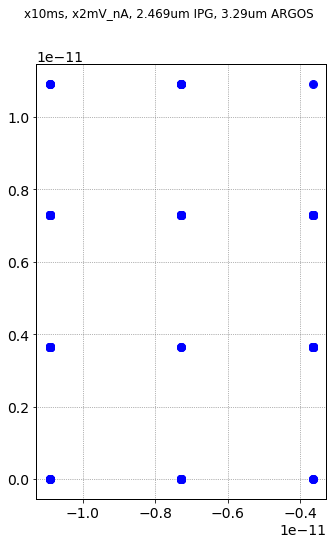

In [31]:
# plot scan data
%matplotlib inline
fig,ax = plt.subplots(1,1,figsize=(14,8))

r_max = 2.5e-10


ax.errorbar(tr1_both[1],tr2_both[1],fmt='bo', ecolor='b',)
fig.suptitle('x10ms, x2mV_nA, 2.469um IPG, 3.29um ARGOS')
# ax.set_xlim([-r_max,r_max])
# ax.set_ylim([-r_max,r_max])
ax.set_aspect('equal',adjustable='box')

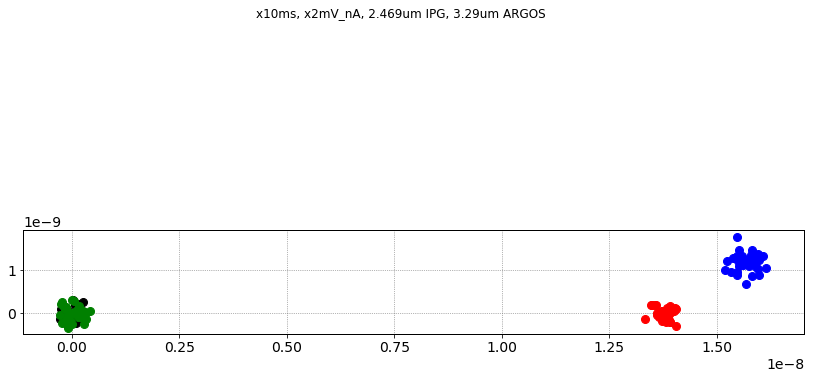

In [243]:
# plot scan data
%matplotlib inline
fig,ax = plt.subplots(1,1,figsize=(14,8))

r_max = 2.5e-10

ax.errorbar(tr1_bg[1],tr2_bg[1],yerr=tr4_bg[1],xerr=tr3_bg[1],fmt='ko', ecolor='k',)
ax.errorbar(tr1_ipg_only[1],tr2_ipg_only[1],yerr=tr4_ipg_only[1],xerr=tr3_ipg_only[1],fmt='go', ecolor='g',)
ax.errorbar(tr1_argos_only[1],tr2_argos_only[1],yerr=tr4_argos_only[1],xerr=tr3_argos_only[1],fmt='ro', ecolor='r',)
ax.errorbar(tr1_both[1],tr2_both[1],yerr=tr4_both[1],xerr=tr3_both[1],fmt='bo', ecolor='b',)
fig.suptitle('x10ms, x2mV_nA, 2.469um IPG, 3.29um ARGOS')
# ax.set_xlim([-r_max,r_max])
# ax.set_ylim([-r_max,r_max])
ax.set_aspect('equal',adjustable='box')

In [7]:
lia.get_reference_frequency()

<Quantity(73.0286, 'hertz')>

In [9]:
set_Vrb(0.5*u.volt)
#ipg.set_wavelength(2385.75*u.nm,tune_SHG=False)

saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_test0_ol_2018_11_10_19_58_13.npz


<IPython.core.display.Javascript object>


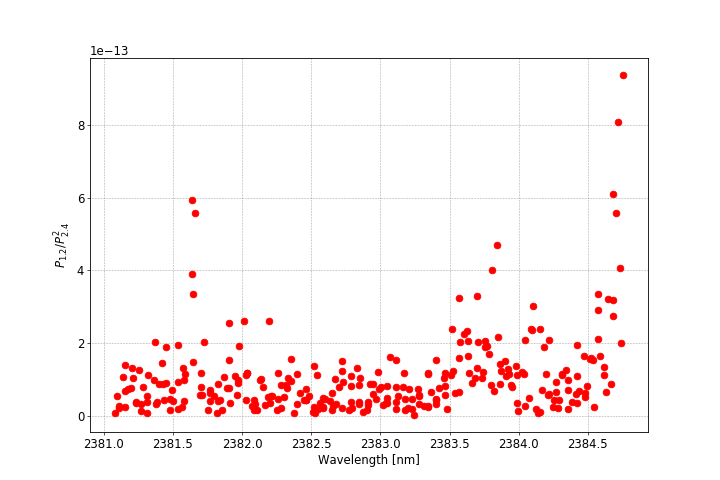

In [31]:
fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 300

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])


saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_test0_ol_2018_11_10_20_11_08.npz


<IPython.core.display.Javascript object>


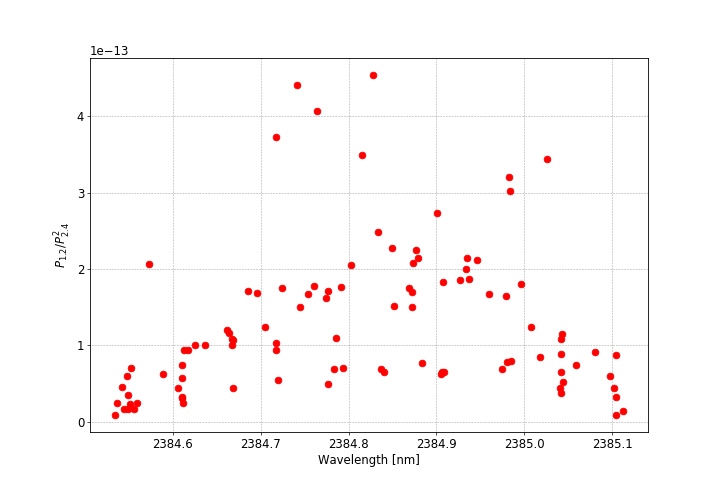

In [32]:
fig=None
ax=None

%matplotlib notebook
lm_start = 2384.5*u.nm
steps_per_point = 1
n_pts = 100

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])


saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_test0_ol_2018_11_10_20_43_19.npz


<IPython.core.display.Javascript object>


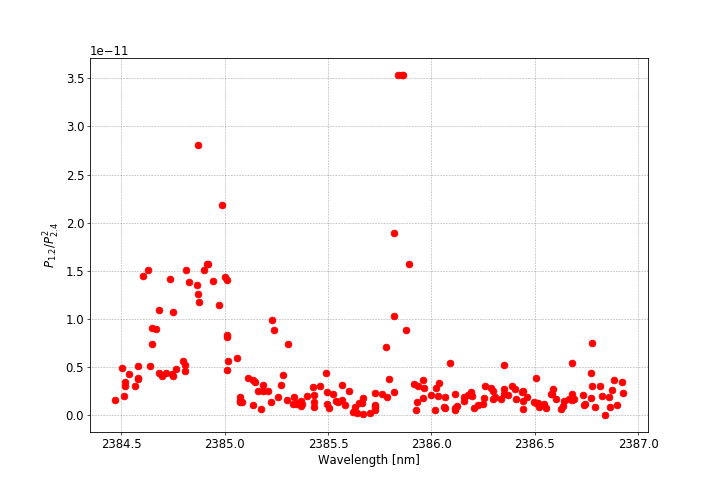

In [33]:
fig=None
ax=None

%matplotlib notebook
lm_start = 2384.5*u.nm
steps_per_point = 2
n_pts = 200

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])


saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_ds2_20C_2018_11_10_22_48_40.npz


<IPython.core.display.Javascript object>


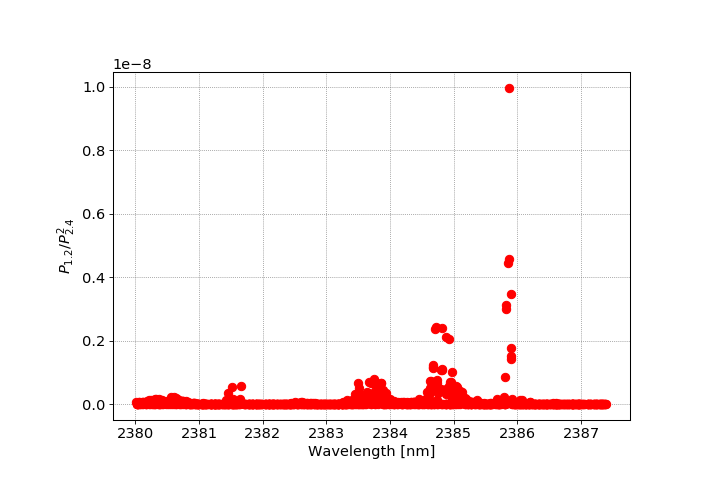

VisaIOError: VI_ERROR_TMO (-1073807339): Timeout expired before operation completed.

In [184]:
fig=None
ax=None

%matplotlib notebook
lm_start = 2380*u.nm
steps_per_point = 2
n_pts = 10000

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='ds2_20C',
                                     autogain=False,
                                     n_pts_per_setpoint=2,
                                     settle_time=0.5*u.second,
                                                   color=colors[0])


In [ ]:
def load_shg_wavelength_sweep(name='',data_dir=default_data_dir,verbose=False,
                     fpath=None,metadata=False,exact_name=False):
    if fpath:
        if verbose:
            print_statusline('Loading data from file: ' + path.basename(path.normpath(fpath)))
        data_npz = np.load(Path(fpath))
    else:
        file_list =  glob(path.normpath(data_dir)+path.normpath('/'+ 'SHG_wavelength_sweep_' + name + '*'))
        latest_file = max(file_list,key=path.getctime)
        if verbose:
            print_statusline('Loading ' + name +' data from file: ' + path.basename(path.normpath(latest_file)))
        data_npz = np.load(latest_file)
    lm_meas = data_npz['lm_meas'] * u.nm
    V_R = data_npz['V_R'] * u.volt
    theta = data_npz['theta'] * u.volt
    try:
        lm_set = data_npz['lm_set'] * u.nm
        ds = {'lm_set':lm_set,
                'lm_meas':lm_meas,
                'V_P_24_trans':V_P_24_trans,
                'V_P_24_ref':V_P_24_ref,
                'V_R':V_R,
                'theta':theta}
    except:
        ds = {'lm_meas':lm_meas,
                'V_R':V_R,
                'theta':theta}
    return ds

ds2_20C = load_shg_wavelength_sweep('ds2_20C')
ds3_20C = load_shg_wavelength_sweep('ds3_20C')


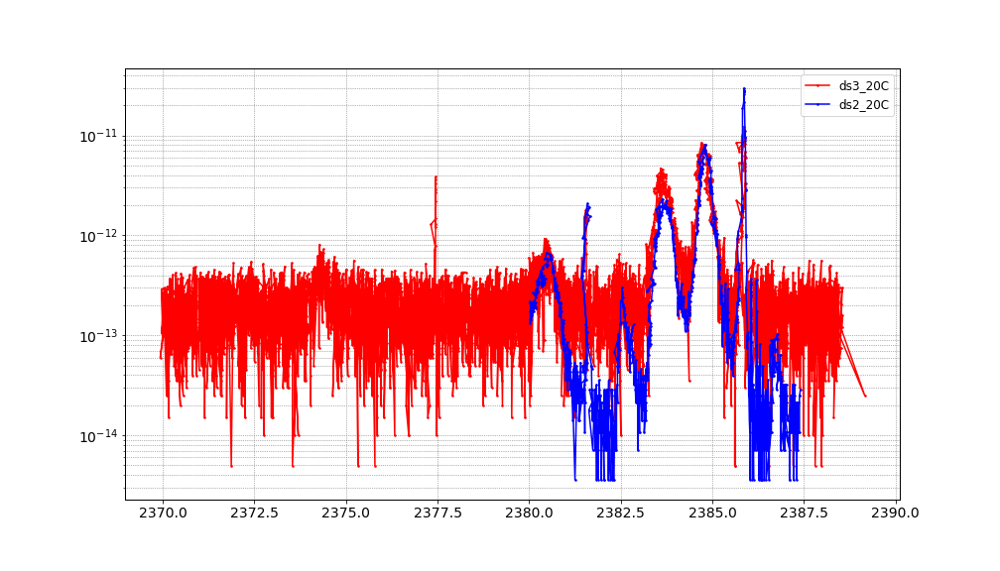

In [69]:
%matplotlib inline

xlim = [2377.25,2377.5]
ylim = [1e-13,4e-12]

fig,ax = plt.subplots(1,1,figsize=(14,8))

d = [ds3_20C,ds2_20C]
labels = ['ds3_20C','ds2_20C']
scale = [0.7,1.0]

# d = [ds2_20C]
# labels = ['ds2_20C']
# scale = [1]

for dind,ds in enumerate(d):
    #V_P_24_trans_rel = ds['V_P_24_trans'] / ds['V_P_24_trans'].max()
    x = ds['lm_meas'][np.nonzero(ds['V_R'])]
    #y = ds['V_R'][np.nonzero(ds['V_R'])]/V_P_24_trans_rel[np.nonzero(ds['V_R'])]**2
    y = scale[dind]*ds['V_R'][np.nonzero(ds['V_R'])]
    ax.semilogy(x,y,'.-',ms=3,label=labels[dind],color=colors[dind]) 

    
#ax.set_xlim(xlim)
#ax.set_ylim(ylim)
ax.legend()

saving to C:\Users\Lab\Google Drive\data\SHG_wavelength_sweep_ds3_20C_2018_11_11_11_23_03.npz


<IPython.core.display.Javascript object>


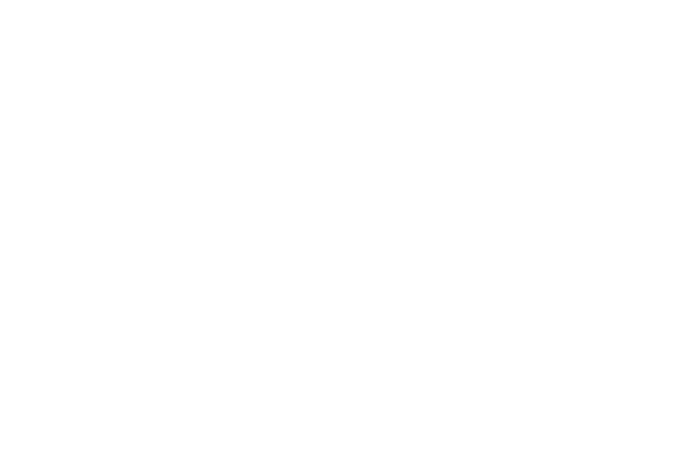

<IPython.core.display.Javascript object>


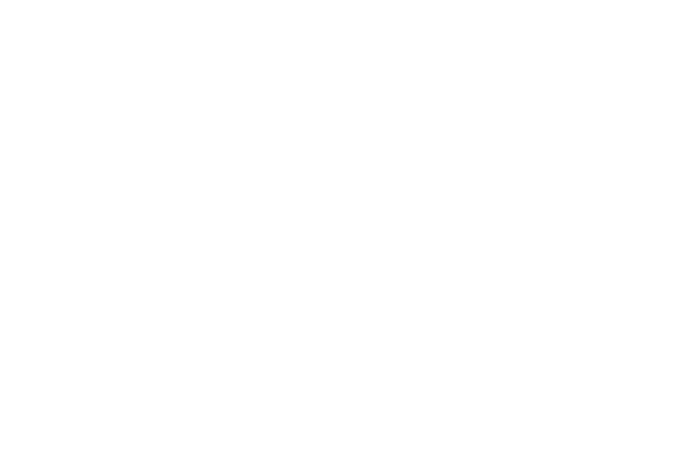

In [36]:
fig=None
ax=None

%matplotlib notebook
lm_start = 2370*u.nm
steps_per_point = 2
n_pts = 3000

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='ds3_20C',
                                     autogain=False,
                                     norm_with_P_trans=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=0.2*u.second,
                                                   color=colors[0])


<IPython.core.display.Javascript object>


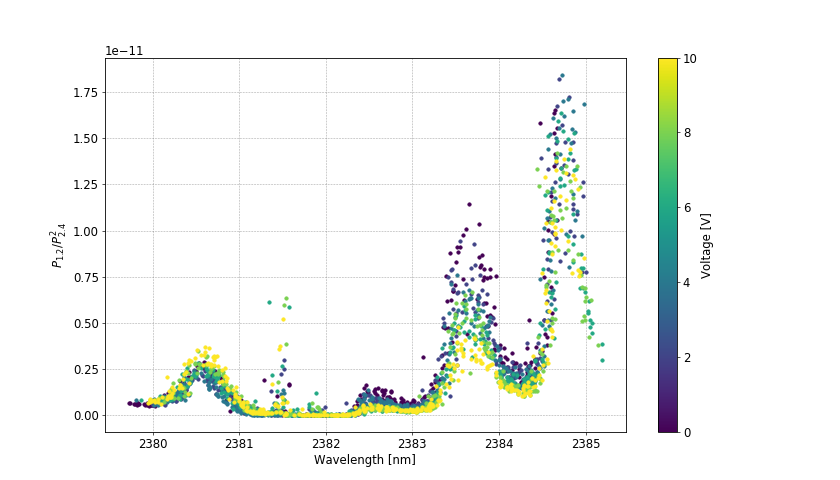

saving to C:\Users\Lab\Google Drive\data\SHG_V_wavelength_sweep_V_ring_sweep_test1_2018_11_11_21_56_27\0.00V\0.00V.npz
saving to C:\Users\Lab\Google Drive\data\SHG_V_wavelength_sweep_V_ring_sweep_test1_2018_11_11_21_56_27\2.00V\2.00V.npz
saving to C:\Users\Lab\Google Drive\data\SHG_V_wavelength_sweep_V_ring_sweep_test1_2018_11_11_21_56_27\4.00V\4.00V.npz
saving to C:\Users\Lab\Google Drive\data\SHG_V_wavelength_sweep_V_ring_sweep_test1_2018_11_11_21_56_27\6.00V\6.00V.npz
saving to C:\Users\Lab\Google Drive\data\SHG_V_wavelength_sweep_V_ring_sweep_test1_2018_11_11_21_56_27\8.00V\8.00V.npz
saving to C:\Users\Lab\Google Drive\data\SHG_V_wavelength_sweep_V_ring_sweep_test1_2018_11_11_21_56_27\10.00V\10.00V.npz


In [10]:

%matplotlib notebook
name = 'V_ring_sweep_test1'
V = np.linspace(0,10,6) * u.volt
set_V_fn = set_V_ring
lm_start = 2380*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 400



collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


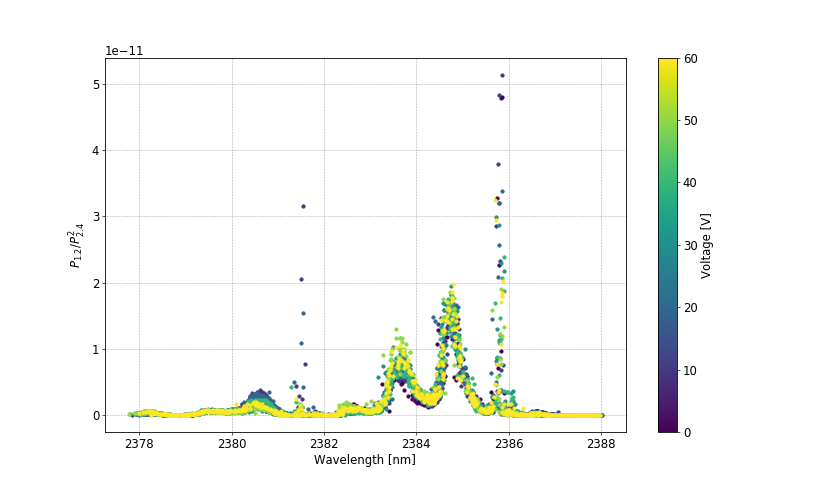

In [9]:

%matplotlib notebook
name = 'V_ring_sweep0_20C'
V = np.linspace(0,60,7) * u.volt
set_V_fn = lambda x: xhr_write(x,V_max=61*u.volt)
lm_start = 2378*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 1.5*u.second
n_pts = 800



collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

<IPython.core.display.Javascript object>


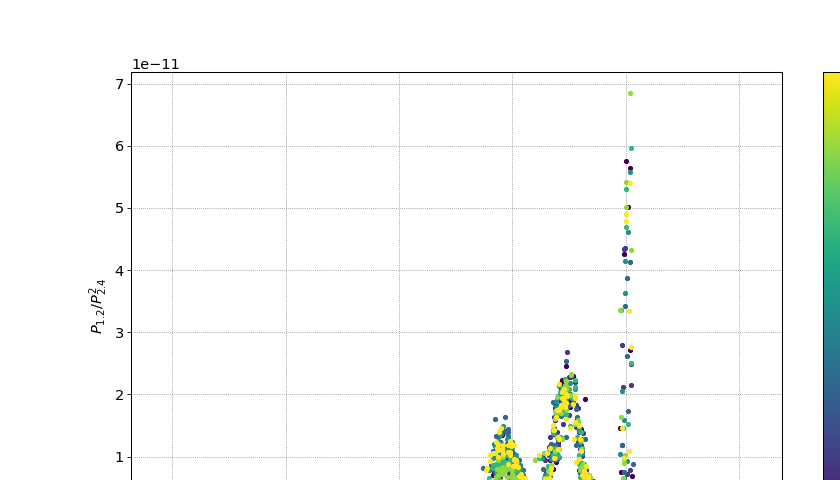

In [10]:
# 22C
set_temp_and_wait(22.0)
name = 'V_ring_sweep0_22C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)


<IPython.core.display.Javascript object>


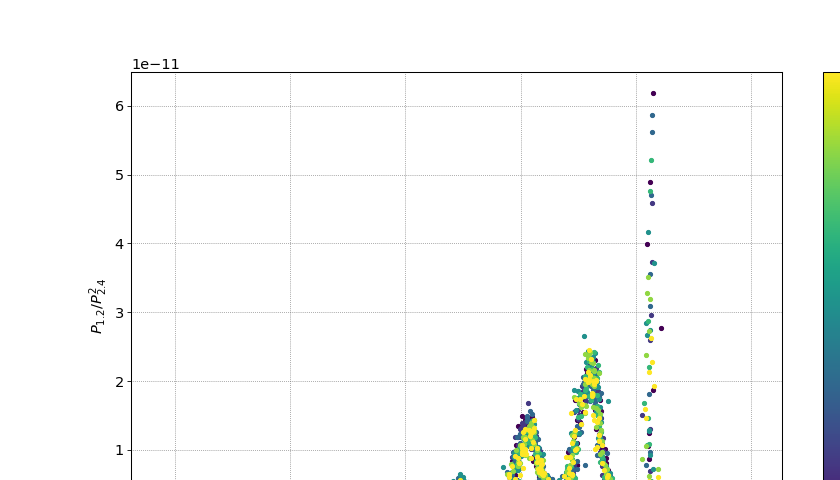

<IPython.core.display.Javascript object>


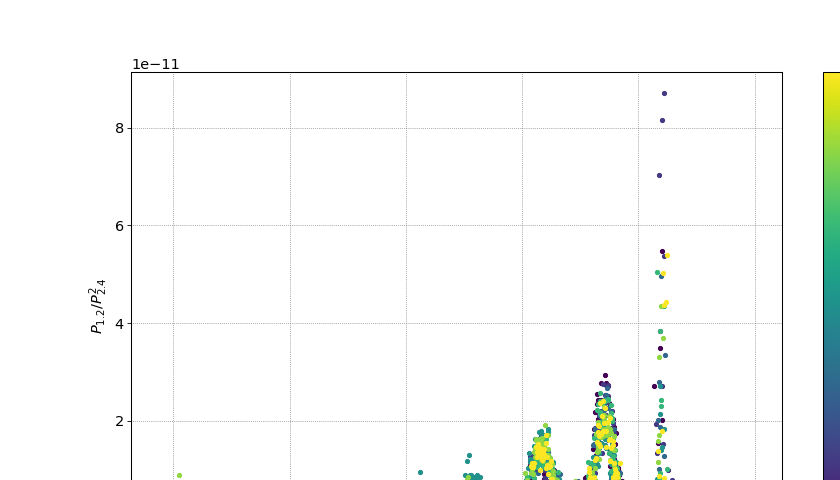

<IPython.core.display.Javascript object>


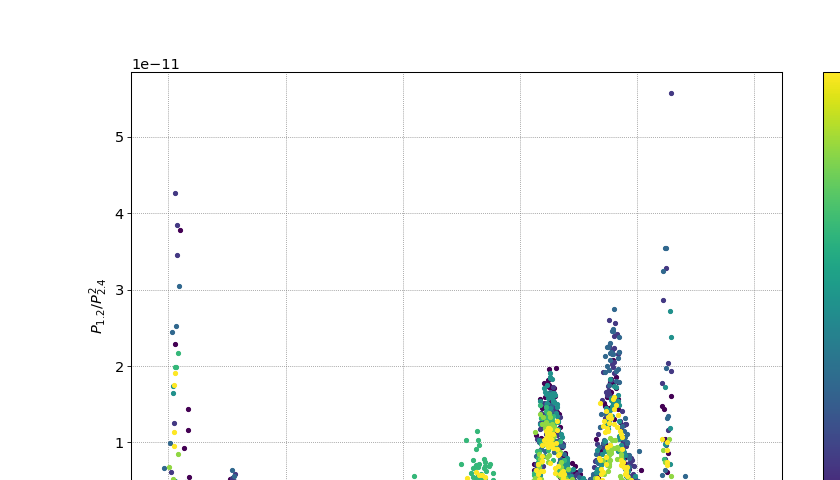

<IPython.core.display.Javascript object>


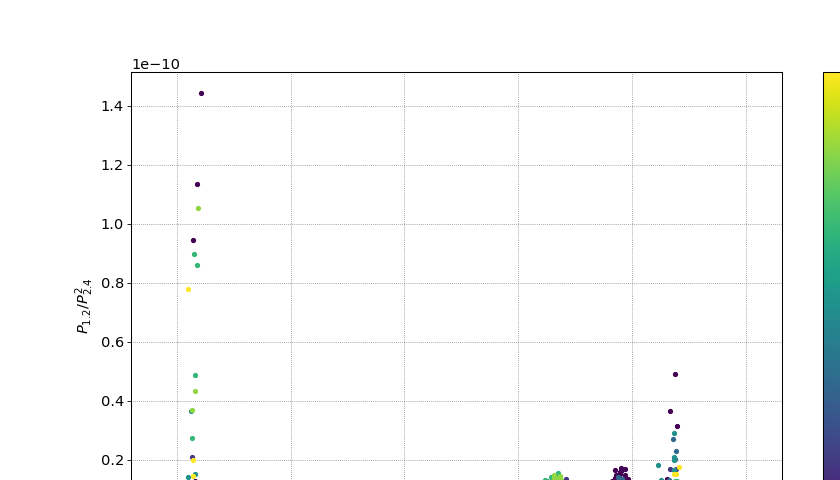

In [11]:
# 24C
set_temp_and_wait(24.0)
name = 'V_ring_sweep0_24C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

# 26C
set_temp_and_wait(26.0)
name = 'V_ring_sweep0_26C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

# 28C
set_temp_and_wait(28.0)
name = 'V_ring_sweep0_28C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

# 30C
set_temp_and_wait(30.0)
name = 'V_ring_sweep0_30C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

<IPython.core.display.Javascript object>


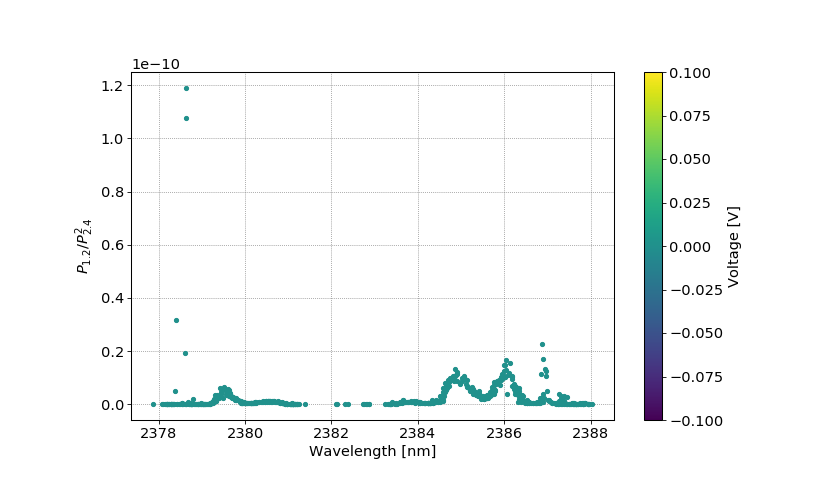

KeyboardInterrupt: 

In [20]:
%matplotlib notebook
V = np.array([0.0]) * u.volt
set_V_fn = lambda x: xhr_write(x,V_max=61*u.volt)
lm_start = 2378*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 1.5*u.second
n_pts = 800

# 32C
set_temp_and_wait(32.0)
name = 'V_ring_sweep0_32C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

# 34C
set_temp_and_wait(34.0)
name = 'V_ring_sweep0_34C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

# 36C
set_temp_and_wait(36.0)
name = 'V_ring_sweep0_36C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

# 38C
set_temp_and_wait(38.0)
name = 'V_ring_sweep0_38C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

# 40C
set_temp_and_wait(40.0)
name = 'V_ring_sweep0_40C'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

set_V_fn(0.0*u.volt)

<IPython.core.display.Javascript object>


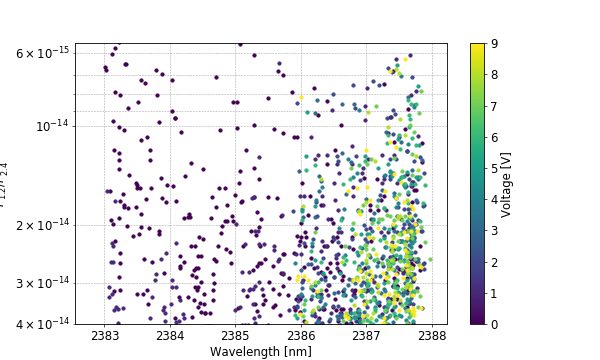

In [2]:
# V_rb sweep at 18C

%matplotlib notebook
V = np.linspace(0,9,10) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.1*u.volt)
lm_start = 2383*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 1.5*u.second
n_pts = 400
name = 'V_rb_sweep0_18C'

collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)




In [7]:
#ds_Vrb_sweep = load_SHG_V_wavelength_sweep(name = 'V_rb_sweep0_18C')
ds_Vrb_sweep.keys()

dict_keys(['V', 'lm_meas', 'V_R', 'theta'])

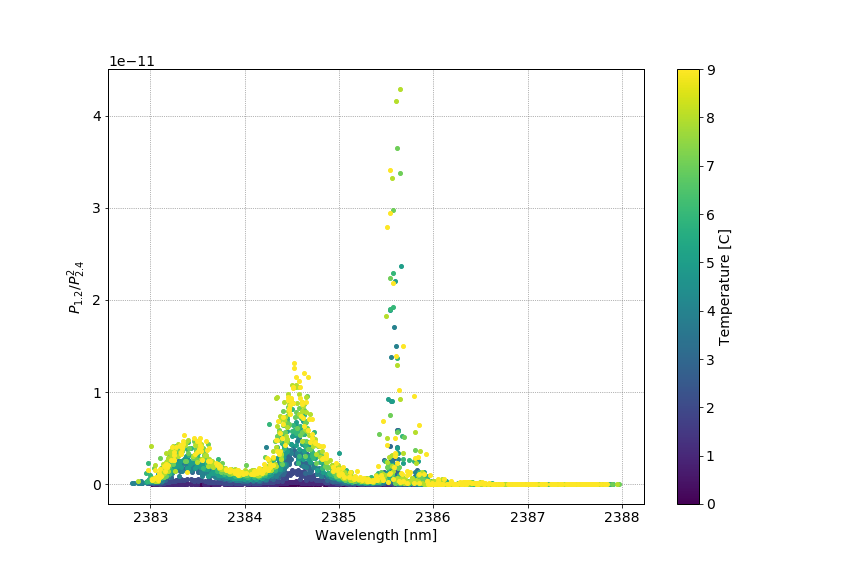

In [11]:
%matplotlib inline

cmap = cm.viridis

fig,ax = plt.subplots(1,1,figsize=(12,8))
ax.set_xlabel('Wavelength [nm]')
ax.set_ylabel('$P_{1.2} / P_{2.4}^2$')

# colormap for plotting
norm = Normalize(ds_Vrb_sweep['V'].min().m,ds_Vrb_sweep['V'].max().m)
sm = cm.ScalarMappable(norm, cmap)
sm.set_array([]) # You have to set a dummy-array for this to work...

cbar = plt.colorbar(sm,ax=ax)
cbar.set_label('Temperature [C]')


for Vind,VV in enumerate(ds_Vrb_sweep['V']): 
    x = ds_Vrb_sweep['lm_meas'][:,0,Vind]
#     V_P_24_ref = ds_Vrb_sweep['V_P_24_ref'][:,0,Vind]
#     V_R = ds_Vrb_sweep['V_R'][:,0,Vind]
#     V_P_24_ref_rel = V_P_24_ref / V_P_24_ref.max()
#     y = V_R[np.nonzero(V_R)]/V_P_24_ref_rel[np.nonzero(V_R)]**2
    y = ds_Vrb_sweep['V_R'][:,0,Vind]
    ax.plot(x,y,'.',color=cmap(norm(VV.m)))

<IPython.core.display.Javascript object>


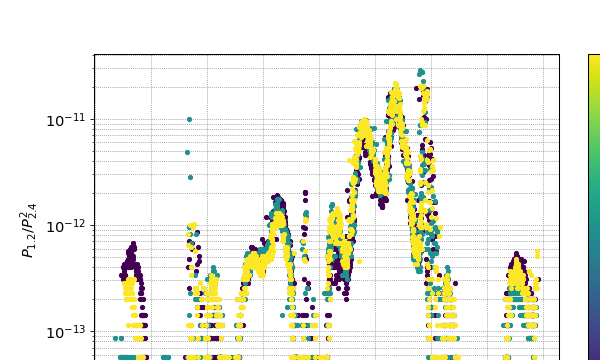

<IPython.core.display.Javascript object>


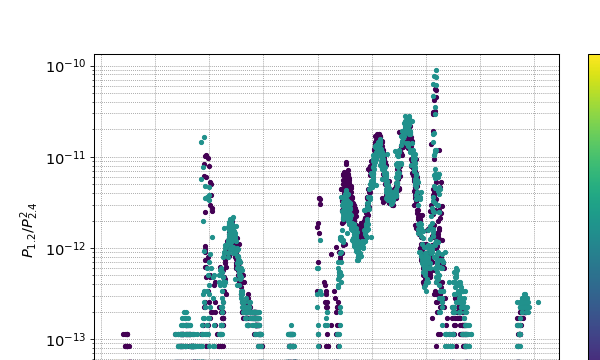

KeyboardInterrupt: 

In [4]:
%matplotlib notebook
V = np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2375*u.nm
steps_per_point = 2
n_pts_per_setpoint = 2
settle_time = 1.5*u.second
n_pts = 1200

T = np.array([20,25,30,35,40,45,50,55,60])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep1_{TT}C'
    set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

set_temp_and_wait(1.0*TT)
set_V_fn(8.5*u.volt)

<IPython.core.display.Javascript object>


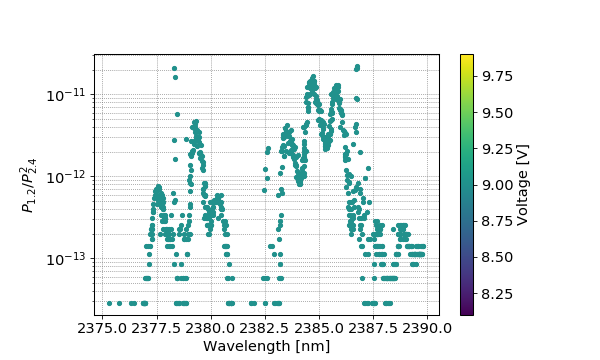

<IPython.core.display.Javascript object>


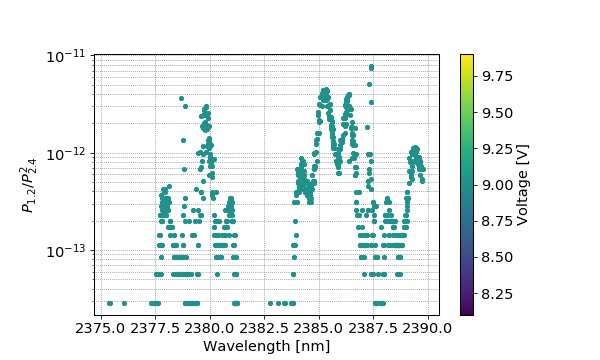

<IPython.core.display.Javascript object>


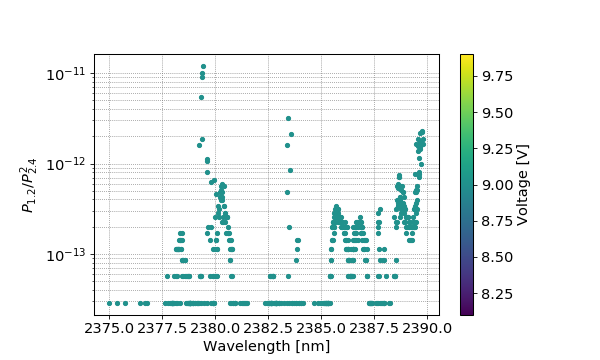

<IPython.core.display.Javascript object>


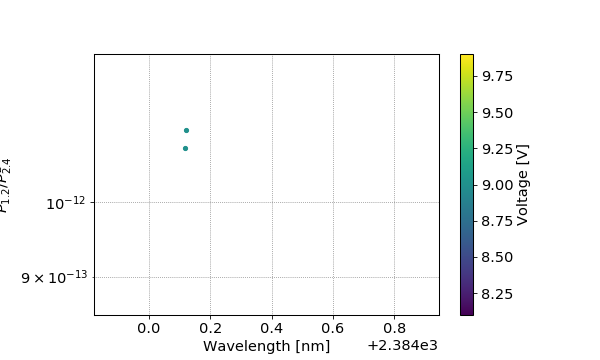

KeyboardInterrupt: 

In [5]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2375*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 1.5*u.second
n_pts = 1200

T = np.array([30,35,40,45,50,55,60])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep1_{TT}C'
    set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

set_temp_and_wait(42.0)
#set_V_fn(8.5*u.volt)

<IPython.core.display.Javascript object>


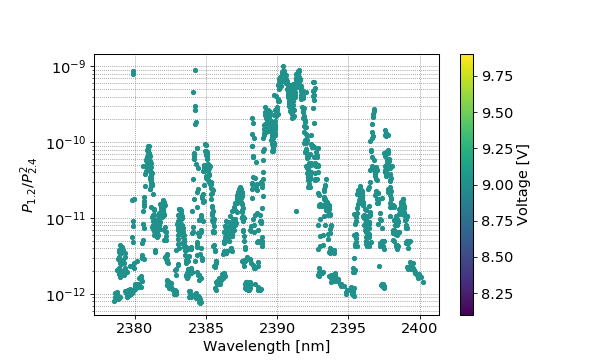

<IPython.core.display.Javascript object>


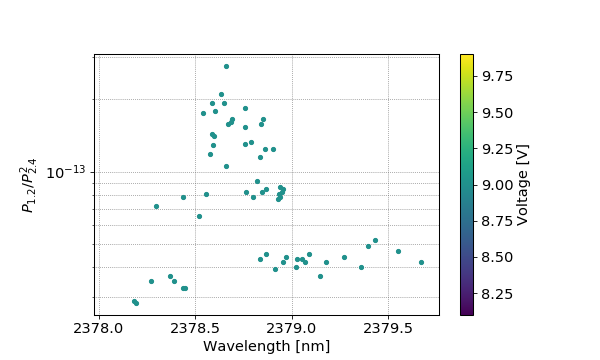

KeyboardInterrupt: 

In [4]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2378*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 1800

T = np.array([45,50,55])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep1_{TT}C'
    set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=True,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

set_temp_and_wait(42.0)
#set_V_fn(8.5*u.volt)

<IPython.core.display.Javascript object>


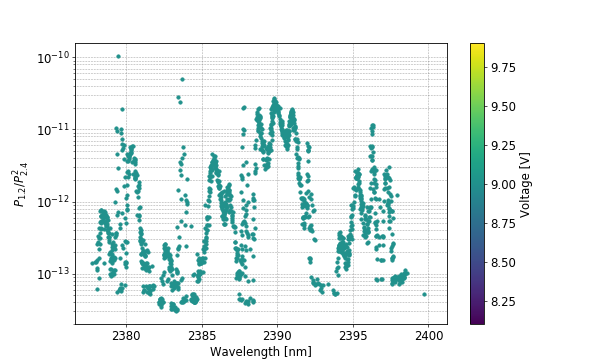

41.99474869988181

In [35]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2378*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 1800

T = np.array([40])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep1_{TT}C'
    set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=True,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

set_temp_and_wait(42.0)

<IPython.core.display.Javascript object>


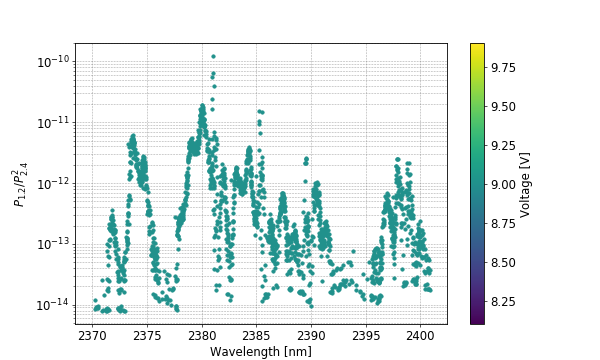

In [5]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2370*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 2500

T = np.array([15])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep1_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=True,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


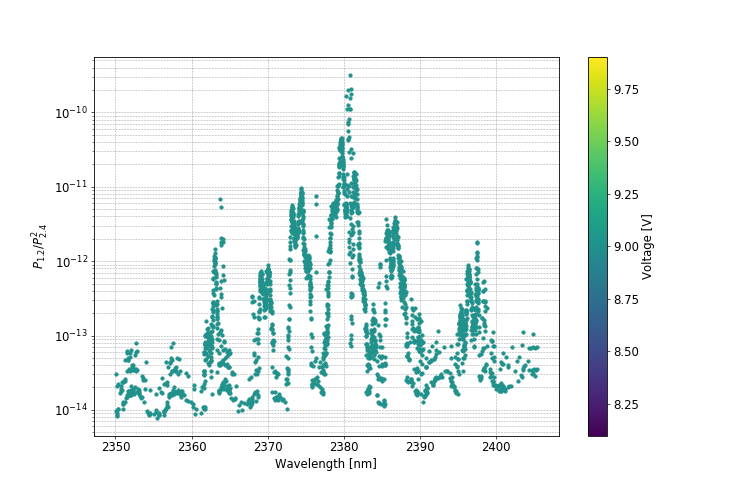

In [10]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2350*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 4500

T = np.array([10])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep1_{TT}C'
    set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=True,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


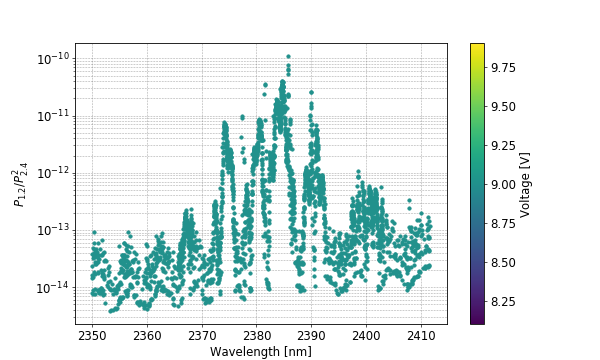

<IPython.core.display.Javascript object>


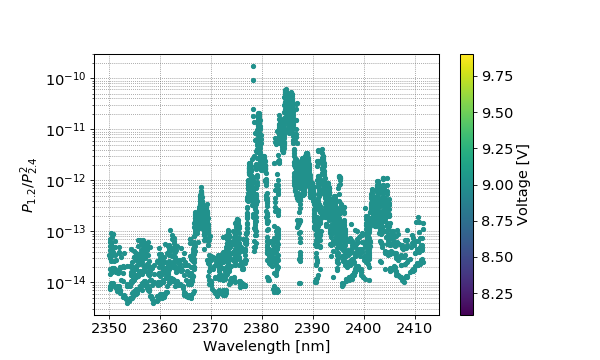

<IPython.core.display.Javascript object>


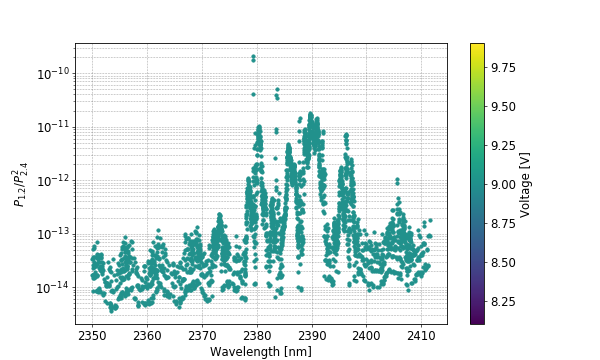

<IPython.core.display.Javascript object>


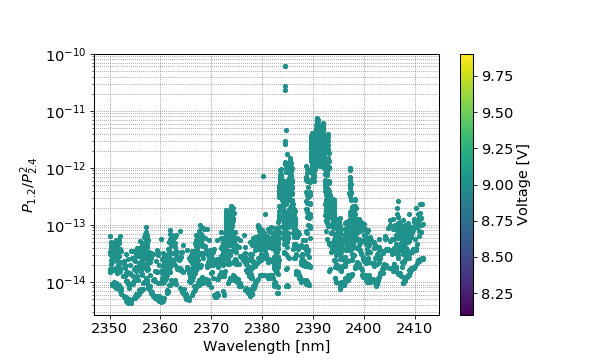

In [14]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2350*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 5000

T = np.array([20,30,40,49])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep2_{TT}C'
    set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=True,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


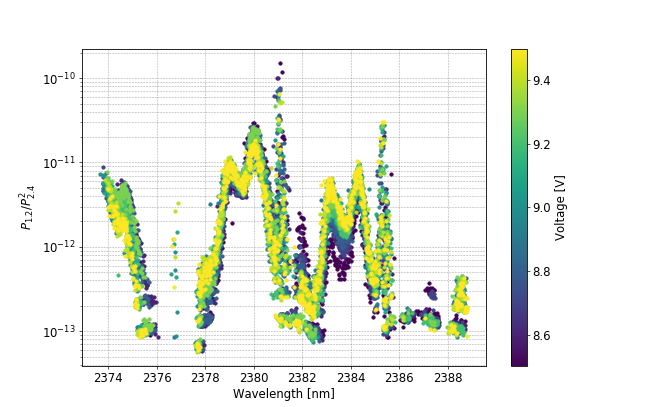

In [21]:
# High-range V_rb sweep at 15C to probe heating/tuning effect

%matplotlib notebook
V = np.linspace(8.5,9.5,11) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.6*u.volt)
lm_start = 2374*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 1200
name = 'high_Vrb_sweep0_15C'

collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


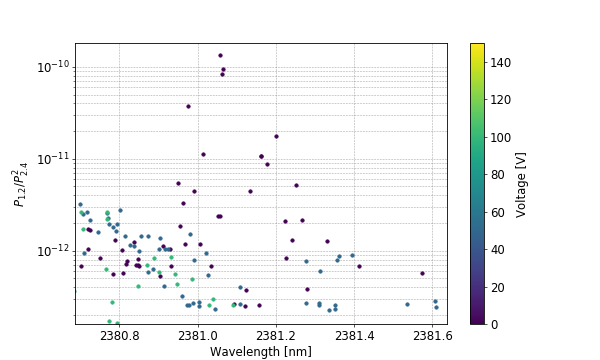

In [24]:
# 0-150V V_ring sweep at 15C to probe heating/tuning effect

%matplotlib notebook
V = np.linspace(0,150,4) * u.volt
set_V_fn = lambda x: xhr_write(x,V_max=151*u.volt)
lm_start = 2374*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 1200
name = 'Vring_sweep1_15C'

collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

## V2 WB bach 1 chip 3 left OPO

<IPython.core.display.Javascript object>


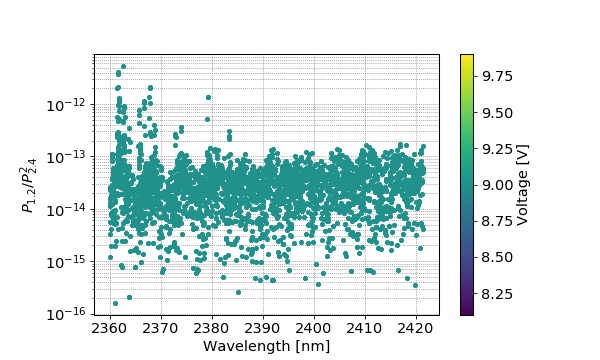

In [13]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2360*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 5000
name = 'V2_WB1_Ch3_left_opo_alignment_0'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


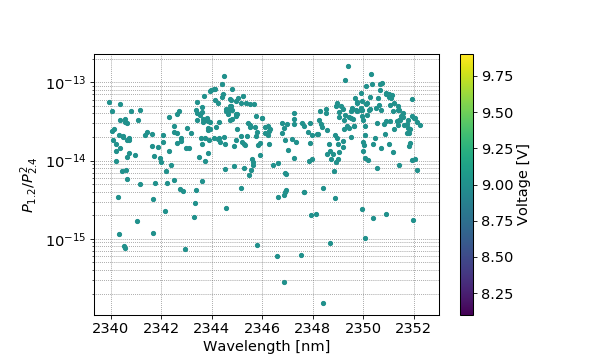

In [2]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2340*u.nm
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 500
name = 'V2_WB1_Ch3_left_opo_alignment_1'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


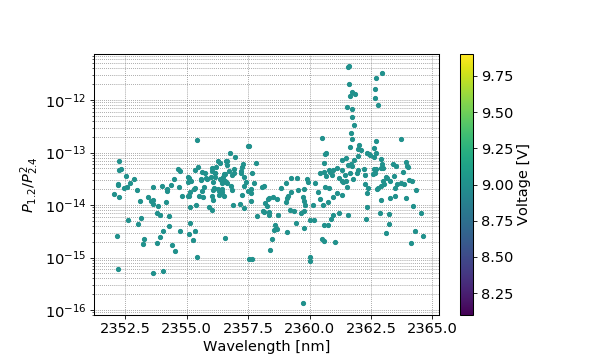

In [3]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2352*u.nm
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 500
name = 'V2_WB1_Ch3_left_opo_alignment_1'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


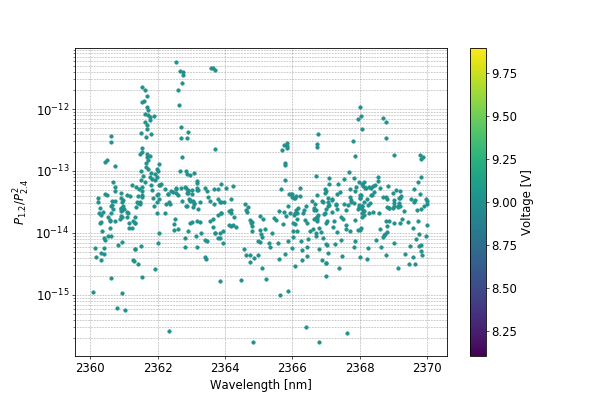

In [4]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2360*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 800
name = 'V2_WB1_Ch3_left_opo_alignment_2'
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


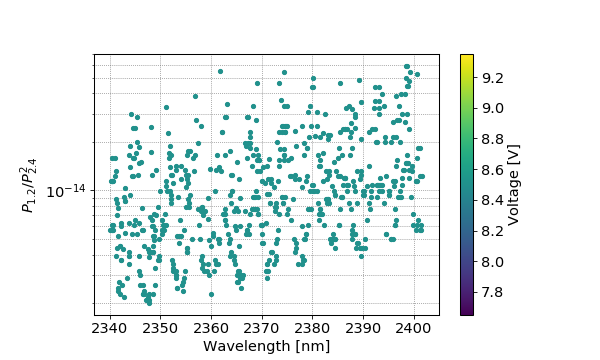

<IPython.core.display.Javascript object>


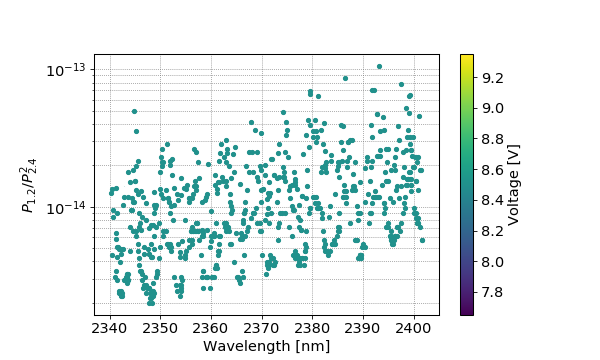

In [10]:
%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2340*u.nm
steps_per_point = 1
n_pts_per_setpoint = 1
settle_time = 1.5*u.second
n_pts = 10000

T = np.array([15,30])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB1_Ch3L_Vrb_sweep0_{TT}C'
    set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=True,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

In [158]:
ipg.sm.step_foreward()
#ipg.sm.step_backward()

In [87]:
ipg.get_lm()

<Quantity(2385.82421875, 'nanometer')>

In [168]:
lia.read_output(sr850.OutputType.R)

<Quantity(4.18335e-012, 'volt')>

In [165]:
sleep(2)
set_Vrb(0.1*u.volt)
sleep(2)
set_Vrb(7.9*u.volt)
sleep(2)
set_Vrb(0.1*u.volt)
sleep(2)
set_Vrb(7.9*u.volt)
sleep(2)
set_Vrb(0.1*u.volt)
sleep(2)
set_Vrb(7.9*u.volt)

In [171]:
#ipg.pzt1.close()
#ipg.pzt2.close()
#ipg.pzt3.close()

### recovering SHG signal :(

In [2]:
def configure_12_chop(f_12_chop=240*u.Hz,sleep_time=30*u.ms):
    rigol_afg.use_external_clock()
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('output:load inf')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('output:load:ch2 inf')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('function square')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('function:ch2 square')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('function:square:dcycle 50.0') # chop square wave duty cycle in %
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('function:square:dcycle:ch2 50.0') # chop square wave duty cycle in %
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write(f'frequency {f_12_chop.to(u.Hz).m:6.3E}')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write(f'frequency:ch2 {f_12_chop.to(u.Hz).m:6.3E}')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('voltage:high 5.0')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('voltage:low 0.0')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('voltage:high:ch2 2.9') # rigol DG1022A ch2 has a lower voltage range, this is for the TTL frequency reference input to SR850 lock-in amplifier
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('voltage:low:ch2 0.0')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.enable(ch=2) # turn on reference frequency signal, this is left on all the time so that the lock-in is always ready

configure_12_chop()
sleep(0.1)

In [ ]:
# def configure_lia(t_scan=2*u.second,sensitivity=sr850.Sensitivity.x50uV_pA,reference_phase=0*u.degree,
#                  time_constant=sr850.TimeConstant.x10ms,sample_rate=sr850.ScanSampleRate.x64Hz):
#     ## configure LIA
#     lia.clear_registers()
#     # turn off alarms to avoid lots of trigger noises
#     lia.set_alarm_mode(sr850.AlarmMode.off)
#     # configure reference frequency
#     lia.set_reference_source(sr850.ReferenceSource.external) # use chopper reference out as lock-in reference signal
#     lia.set_reference_slope(sr850.ReferenceSlope.ttl_rising)
#     lia.set_reference_phase(reference_phase) # checked for current alignment by maximizing signal and running auto_phase, then checking reference phase
#     # configure inputs
#     lia.set_input_coupling(sr850.InputCoupling.AC)
#     #lia.set_input_ground(sr850.InputGround.floating)
#     #lia.set_input_ground(sr850.InputGround.ground)
#     lia.set_input_configuration(sr850.InputConfiguration.I)
#     lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
#     #lia.set_current_gain(sr850.CurrentGain.oneMegaOhm)
#     lia.set_line_filter_status(sr850.LineFilter.both_filters)

#     # configure gain, time constant, sensitivity
#     lia.set_sensitivity(sensitivity)
#     lia.set_time_constant(time_constant)
#     lia.set_low_pass_slope(sr850.LowPassSlope.twentyfour_dB_per_octave)
#     #lia.set_low_pass_slope(sr850.LowPassSlope.twelve_dB_per_octave)

#     # configure scans and traces
#     lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
#     lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
#     lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
#     lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
#     lia.set_scan_mode(sr850.ScanMode.single_shot)
#     lia.set_scan_sample_rate(sample_rate)
#     lia.set_scan_length(t_scan)
#     lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.yes)
#     #lia.reset_scan()

    

# configure_lia()


In [28]:
## configure LIA
lia.clear_registers()
# configure reference frequency
lia.set_reference_source(sr850.ReferenceSource.external) # use chopper reference out as lock-in reference signal
lia.set_reference_slope(sr850.ReferenceSlope.ttl_rising)
lia.set_reference_phase(10.6*u.degree) # checked for current alignment by maximizing signal and running auto_phase, then checking reference phase
# configure inputs
lia.set_input_coupling(sr850.InputCoupling.AC)
#lia.set_input_ground(sr850.InputGround.floating)
lia.set_input_ground(sr850.InputGround.ground)
lia.set_input_configuration(sr850.InputConfiguration.I)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
lia.set_line_filter_status(sr850.LineFilter.both_filters)

# configure gain, time constant, sensitivity
lia.set_sensitivity(sr850.Sensitivity.x10uV_pA)
#lia.set_sensitivity(sr850.Sensitivity.x500mV_nA)
lia.set_time_constant(sr850.TimeConstant.x300ms)
lia.set_low_pass_slope(sr850.LowPassSlope.twentyfour_dB_per_octave)

# # configure scans and traces
# t_scan = 30*u.second
# lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
# lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
# lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
# lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
# lia.set_scan_mode(sr850.ScanMode.single_shot)
# lia.set_scan_sample_rate(sr850.ScanSampleRate.x2Hz)
# lia.set_scan_length(t_scan)
# lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.no)
# lia.reset_scan()


<IPython.core.display.Javascript object>


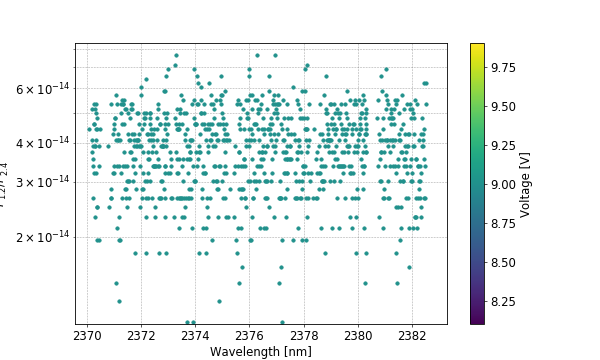

In [7]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2370*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 2*u.second
n_pts = 1000

T = np.array([15])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep2_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


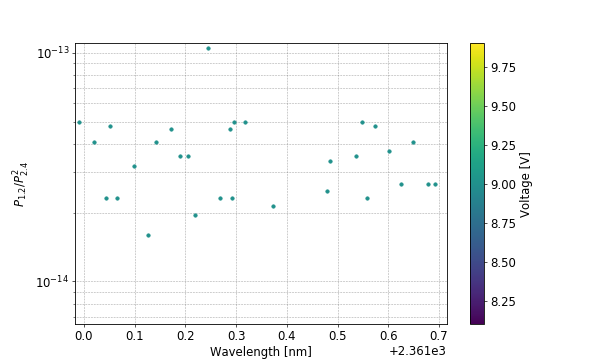

In [8]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2360*u.nm
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 2*u.second
n_pts = 500

T = np.array([15])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep2_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


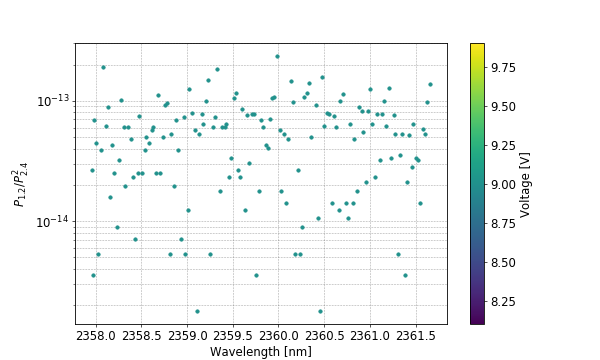

In [33]:
%matplotlib notebook
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2358*u.nm
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 2*u.second
n_pts = 150

T = np.array([15])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep2_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


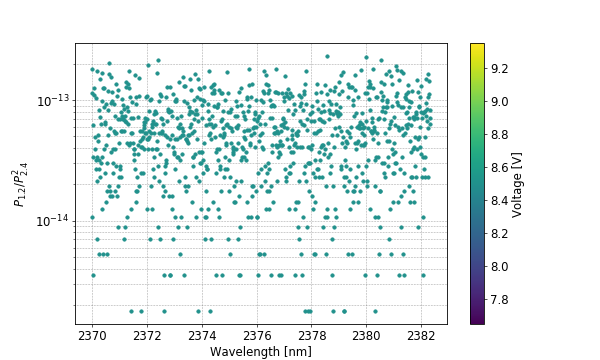

In [34]:
%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2370*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 2*u.second
n_pts = 1000

T = np.array([15])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep2_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


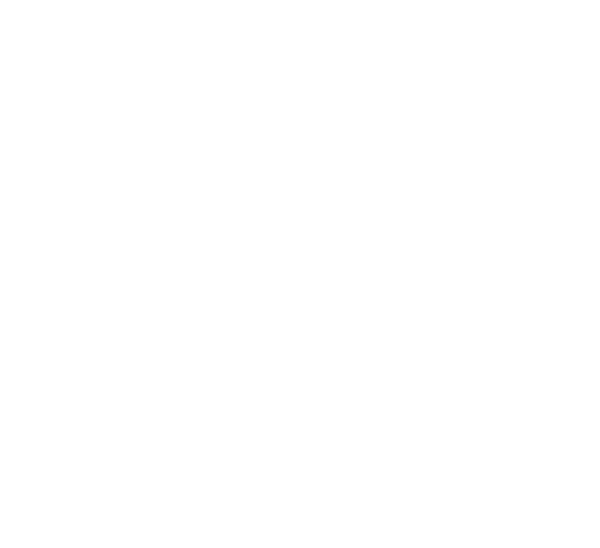

In [4]:
# g=300nm, w=800nm device from V2,WB2, 15C
%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2380*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 2*u.second
n_pts = 2000

T = np.array([15])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V_rb_sweep2_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


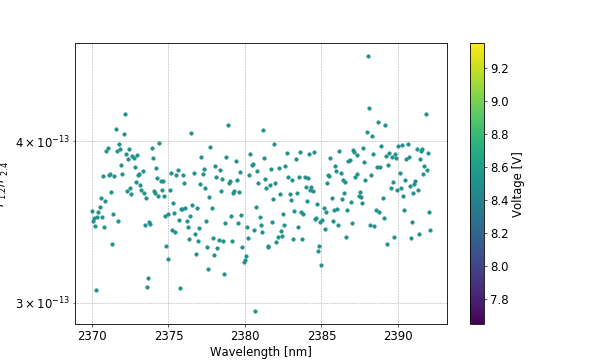

In [2]:
# now with g=400nm, w=800nm device from V2,WB2

%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2370*u.nm
steps_per_point = 12
n_pts_per_setpoint = 1
settle_time = 2*u.second
n_pts = 300

T = np.array([15])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH1_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


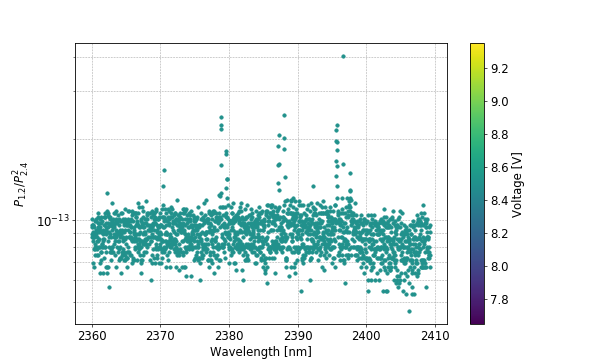

In [5]:
# now with g=400nm, w=800nm device from V2,WB2

%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2360*u.nm
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 2*u.second
n_pts = 2000

T = np.array([15])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH1_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


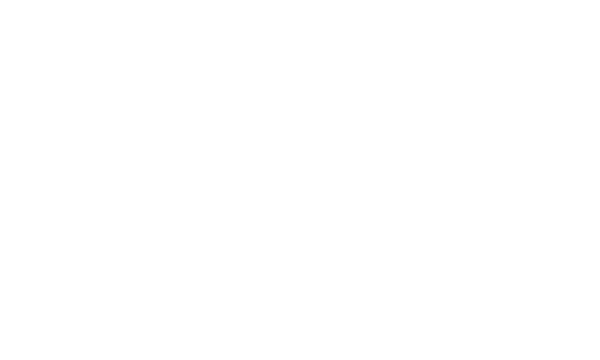

<IPython.core.display.Javascript object>


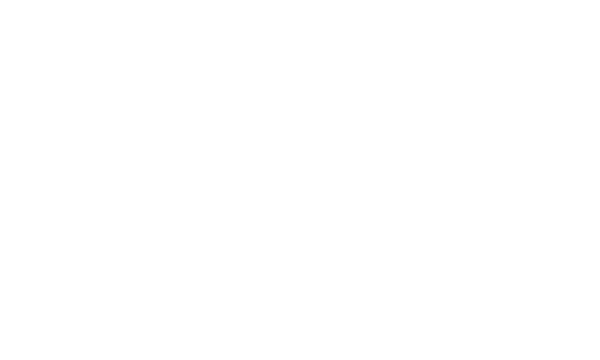

<IPython.core.display.Javascript object>


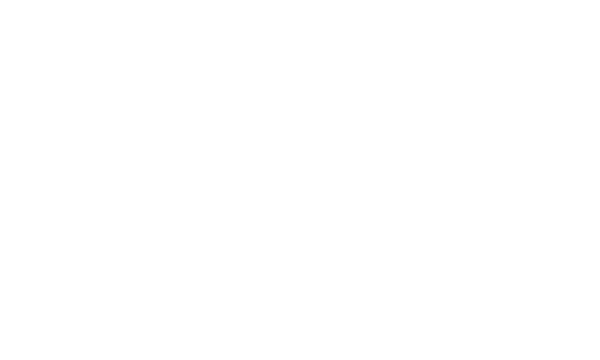

In [30]:
# now with g=400nm, w=800nm device from V2,WB2

%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2360*u.nm
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 2*u.second
n_pts = 2000

T = np.array([15,25,35])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_w780_{TT}C'
    if TT>T[0]:

        
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


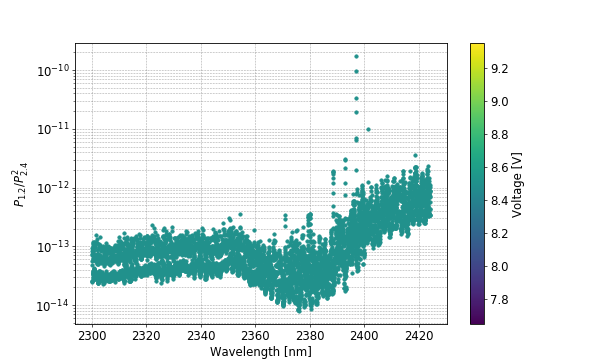

In [52]:
##############       #############################
#############   NEW! ##################
#############################################################


%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2300*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
sleep(0.2)
lia.set_time_constant(sr850.TimeConstant.x300ms)
settle_time = 2*u.second
n_pts = 10000

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_w800_g400_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=True,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


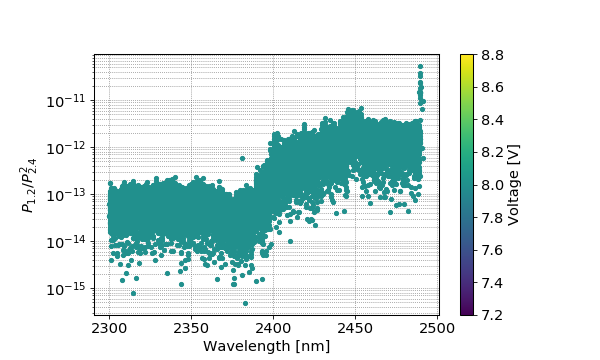

KeyboardInterrupt: 

In [97]:

##############       #############################
#############   NEW! ##################
#############################################################

lia_ref_phase = -21.432 * u.degree


%matplotlib notebook
V = np.array([8])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2300*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
sleep(0.2)
lia.set_sensitivity(sr850.Sensitivity.x500nV_fA)
lia.set_time_constant(sr850.TimeConstant.x300ms)
settle_time = 2*u.second
n_pts = 17000

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_w780_g400_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=True,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


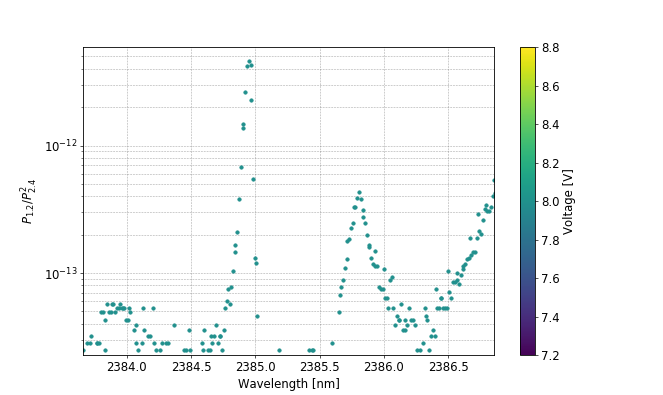

In [108]:
##############       #############################
#############   NEW! ##################
#############################################################


%matplotlib notebook
V = np.array([8.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2300*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
sleep(0.2)
lia.set_sensitivity(sr850.Sensitivity.x5uV_pA)
lia.set_time_constant(sr850.TimeConstant.x300ms)
settle_time = 2*u.second
n_pts = 8000

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_w800_g400_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


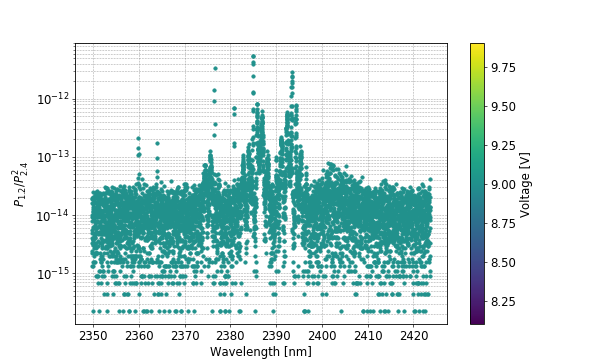

In [64]:
##############       #############################
#############   NEW! ##################
#############################################################

# reference phase -20.45 degree from peak in previous measurement
# changed to only 60Hz line filter (not "both" for 60 and 120Hz), re-ran auto phase, got -28.79 degrees
# changed back to both filters, got -20.217

# lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
# lia.set_low_pass_slope(sr850.LowPassSlope.twentyfour_dB_per_octave)
# lia.set_sensitivity(sr850.Sensitivity.x5uV_pA)
# lia.set_time_constant(sr850.TimeConstant.x100ms)
# lia.auto_phase()
# sleep(1)
# lia.get_reference_phase() 
#: 1.344 degree


### Note: this data is from the chip on the chip carrier marked "IMEC V2 WB1 CH2"
# for reference when comparing with linear transmission data

%matplotlib notebook
V = np.array([9])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2350*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 6000

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_w800_g400_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

In [3]:
lm_start = 2300*u.nm
n_V_pzt = 5
name = 'ds3_V2_WB1_CH2_w800_g400_T20'
stepper_incr = 130
n_stepper_pts = 200

# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_V2_WB1_CH2_w800_g400_T20 = collect_linear_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)


In [5]:
lm_start = 2300*u.nm
n_V_pzt = 5
name = 'ds3_V2_WB1_CH2_w800_g400_T20_Vrb0'
stepper_incr = 130
n_stepper_pts = 200
Vrb = 0 * u.volt
# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_V2_WB1_CH2_w800_g400_T20 = collect_linear_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second,Vrb=Vrb)

<IPython.core.display.Javascript object>


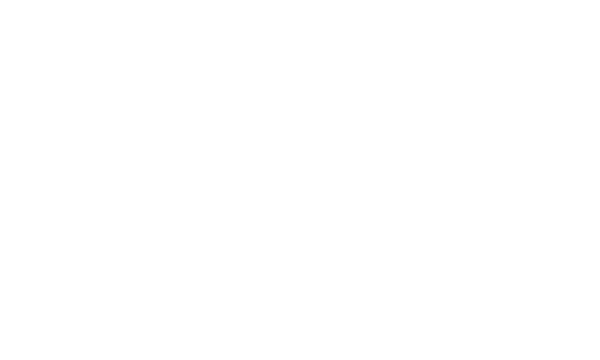

In [18]:
##############       #############################
#############   NEW! ##################
#############################################################

# reference phase -20.45 degree from peak in previous measurement
# changed to only 60Hz line filter (not "both" for 60 and 120Hz), re-ran auto phase, got -28.79 degrees
# changed back to both filters, got -20.217

lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
lia.set_low_pass_slope(sr850.LowPassSlope.twentyfour_dB_per_octave)
lia.set_sensitivity(sr850.Sensitivity.x5uV_pA)
lia.set_time_constant(sr850.TimeConstant.x100ms)
# lia.auto_phase()
# sleep(1)
# lia.get_reference_phase() 
#: 1.344 degree


### Note: this data is from the chip on the chip carrier marked "IMEC V2 WB1 CH4"
# for reference when comparing with linear transmission data

%matplotlib notebook
V = np.array([9])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2350*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 6000

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_w800_g300_wb4_ch4_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

In [21]:
lm_start = 2340*u.nm
n_V_pzt = 30
name = 'ds3_V2_WB1_CH2_w800_g300_wb4_ch4_T20'
stepper_incr = 60
n_stepper_pts = 200

# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_V2_WB1_CH2_w800_g400_T20 = collect_linear_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)


In [25]:
lm_start = 2340*u.nm
n_V_pzt = 30
name = 'ds3_V2_WB4_CH2_w800_g400_T20_hires'
stepper_incr = 60
n_stepper_pts = 200

# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_V2_WB1_CH2_w800_g400_T20 = collect_linear_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)


In [31]:
lm_start = 2340*u.nm
n_V_pzt = 30
name = 'ds3_V2_WB4_unmarked_flattened_pins_w800_g200_T20_hires'
stepper_incr = 60
n_stepper_pts = 200

# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_V2_WB1_CH2_w800_g400_T20 = collect_linear_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)

In [33]:
lm_start = 2340*u.nm
n_V_pzt = 45
name = 'ds3_V2_WB4_unmarked_flattened_pins_w800_g200_T20_new_bg'
stepper_incr = 60
n_stepper_pts = 200
# ch1 (trans) offset looks like 290.4mV
# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_V2_WB1_CH2_w800_g400_T20 = collect_linear_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)

In [3]:
lm_start = 2370*u.nm
n_V_pzt = 45
name = 'ds4_V2_WB4_unmarked_flattened_pins_w800_g200_T20'
stepper_incr = 60
n_stepper_pts = 120
# ch1 (trans) offset looks like 290.4mV
# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_V2_WB1_CH2_w800_g400_T20 = collect_linear_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=0.5*u.second)

tuning SHG:24_trans trace from channel 1 on TDS 3034B...0nm, lm_err: -0.020nm, n_iter: 4
	poling region: 1, LM=34.8000um
	set temperature: 57.1C
current_temp: 103.619 degC
set_temp: 57.08777920045511 degC


In [35]:
lm_start = 2340*u.nm
n_V_pzt = 20
name = 'ds3_bg_only'
stepper_incr = 60
n_stepper_pts = 200
# ch1 (trans) offset looks like 290.4mV
# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_V2_WB1_CH2_w800_g400_T20 = collect_linear_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=5*u.Hz,name=name,settle_time=1*u.second)

In [4]:
lm_start = 2360*u.nm
n_V_pzt = 45
name = 'ds4_V2_WB4_unmarked_flattened_pins_w800_g200_T20_2'
stepper_incr = 60
n_stepper_pts = 60
# ch1 (trans) offset looks like 290.4mV
# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_V2_WB1_CH2_w800_g400_T20 = collect_linear_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=0.5*u.second)

tuning SHG:24_trans trace from channel 1 on TDS 3034B...000nm reached (or gave up) in 10 steps
	poling region: 1, LM=34.8000um
	set temperature: 39.1C
current_temp: 57.085 degC
set_temp: 39.06956892872378 degC


# Repeating SHG measurements

Here we (David H and Mircea) will attempt to repeat Dodd's SHG measurements to get a feel for the setup.

<IPython.core.display.Javascript object>


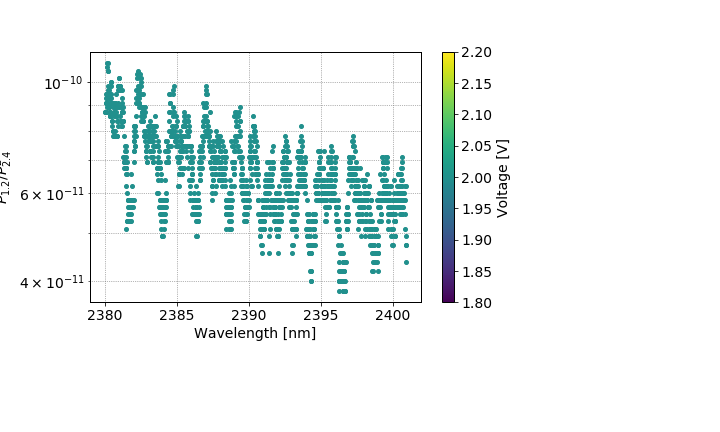

<IPython.core.display.Javascript object>


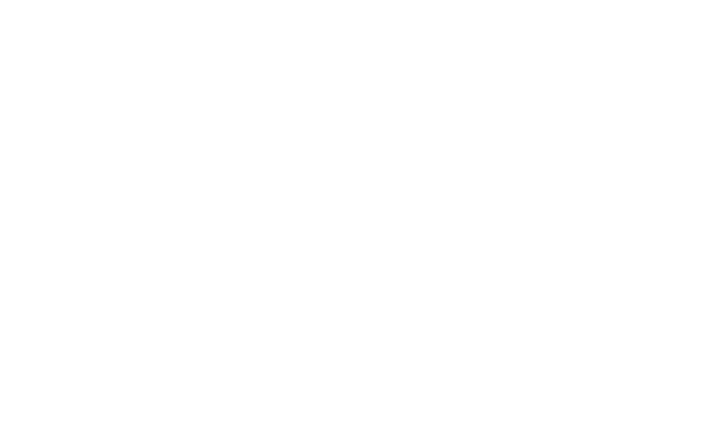

In [25]:
%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2380*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 1700

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

In [74]:
## configure LIA
lia.clear_registers()
# configure reference frequency
lia.set_reference_source(sr850.ReferenceSource.external) # use chopper reference out as lock-in reference signal
lia.set_reference_slope(sr850.ReferenceSlope.ttl_rising)
#lia.set_reference_phase(10.7*u.degree) # checked for current alignment by maximizing signal and running auto_phase, then checking reference phase
# configure inputs
lia.set_input_coupling(sr850.InputCoupling.AC)
#lia.set_input_ground(sr850.InputGround.floating)
lia.set_input_ground(sr850.InputGround.ground)
lia.set_input_configuration(sr850.InputConfiguration.I)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
lia.set_line_filter_status(sr850.LineFilter.both_filters)

In [75]:
# # configure gain, time constant, sensitivity
# lia.set_sensitivity(sr850.Sensitivity.x100nV_fA)
# lia.set_time_constant(sr850.TimeConstant.x1s)
#lia.set_low_pass_slope(sr850.LowPassSlope.twentyfour_dB_per_octave)

# # configure scans and traces
# t_scan = 30*u.second
# lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
# lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
# lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
# lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
# lia.set_scan_mode(sr850.ScanMode.single_shot)
# lia.set_scan_sample_rate(sr850.ScanSampleRate.x500mHz)
# lia.set_scan_length(t_scan)
# lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.no)
# lia.reset_scan()


# configure gain, time constant, sensitivity
lia.set_sensitivity(sr850.Sensitivity.x10uV_pA)
lia.set_time_constant(sr850.TimeConstant.x30ms)
lia.set_low_pass_slope(sr850.LowPassSlope.twelve_dB_per_octave)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
# configure scans and traces
t_scan = 10*u.second
lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
lia.set_scan_mode(sr850.ScanMode.single_shot)
lia.set_scan_sample_rate(sr850.ScanSampleRate.x1Hz)
lia.set_scan_length(t_scan)
lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.no)
lia.reset_scan()

In [76]:
lia.auto_phase()

In [77]:
lia.get_reference_frequency()

<Quantity(73, 'hertz')>

In [78]:
# read scans in
t_scan = 10*u.second
lia.reset_scan()
sleep(0.2)
lia.start_scan()
sleep(0.2)
sleep(t_scan.to(u.second).m)
while lia.scan_in_progress():
    sleep(0.2)
    
tr1 = lia.get_trace(sr850.TraceNumber.one)

ValueError: invalid literal for int() with base 10: '73.04'

In [220]:
tr2 = lia.get_trace(sr850.TraceNumber.two)

In [222]:
tr3 = lia.get_trace(sr850.TraceNumber.three)

In [224]:
tr4 = lia.get_trace(sr850.TraceNumber.four)

In [225]:
tr4

(<Quantity([ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.], 'second')>,
 <Quantity([0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], 'dimensionless')>)

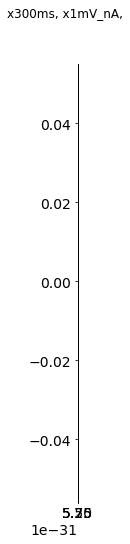

In [214]:
# plot scan data
%matplotlib inline
fig,ax = plt.subplots(1,1,figsize=(14,8))

r_max = 2.5e-10

ax.errorbar(tr1[1],tr2[1],fmt='bo', ecolor='b',)
fig.suptitle('x300ms, x1mV_nA,')
# ax.set_xlim([-r_max,r_max])
# ax.set_ylim([-r_max,r_max])
ax.set_aspect('equal',adjustable='box')

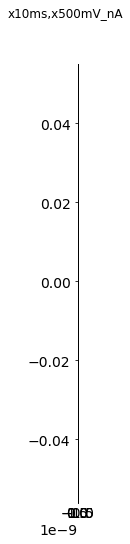

In [226]:
# plot scan data
%matplotlib inline
fig,ax = plt.subplots(1,1,figsize=(14,8))

r_max = 2.5e-10

ax.errorbar(tr1[1],tr2[1],yerr=tr4[1],xerr=tr3[1],fmt='ko', ecolor='b',)

fig.suptitle('x10ms,x500mV_nA')
# ax.set_xlim([-r_max,r_max])
# ax.set_ylim([-r_max,r_max])
ax.set_aspect('equal',adjustable='box')

<IPython.core.display.Javascript object>


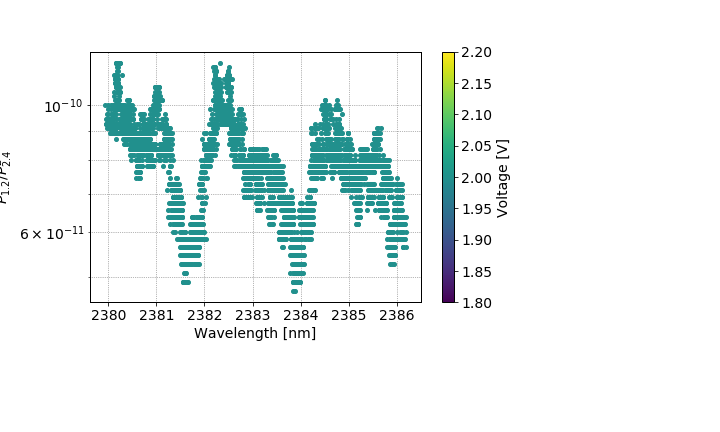

<IPython.core.display.Javascript object>


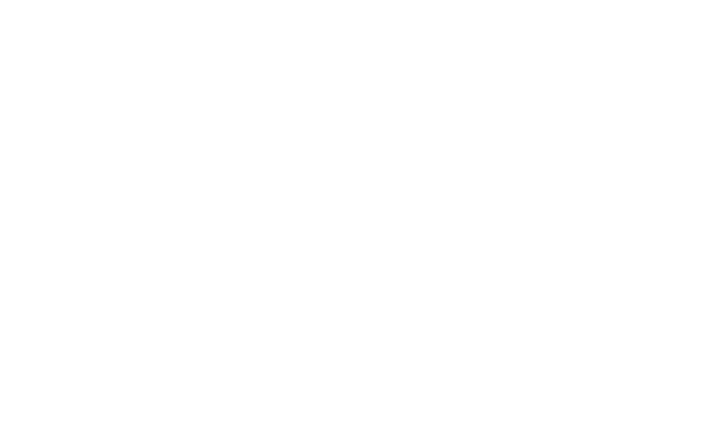

In [26]:
%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2380*u.nm
steps_per_point = 1
n_pts_per_setpoint = 5
settle_time = 0.5*u.second
n_pts = 1000

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


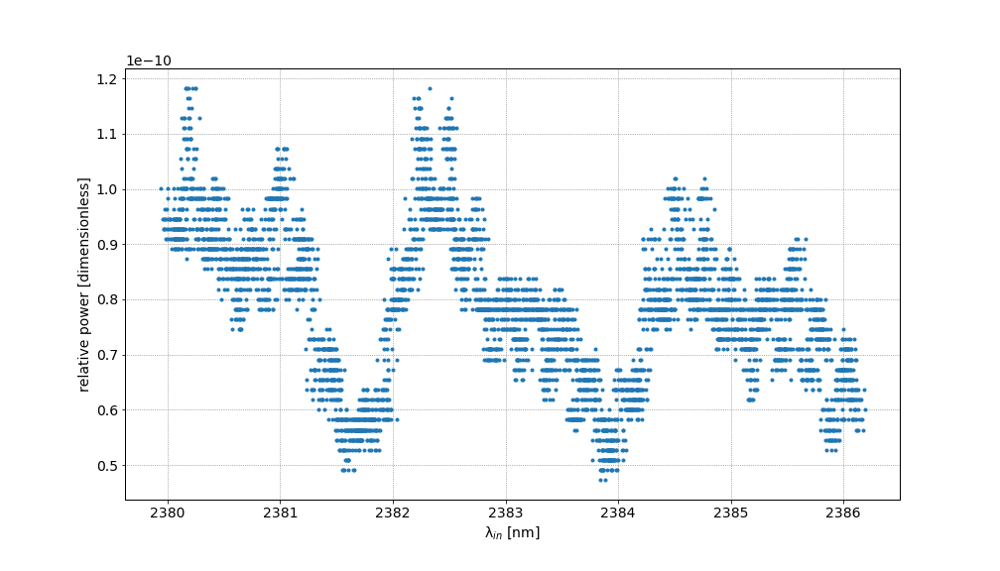

Text(0,0.5,'relative power [dimensionless]')

In [60]:
%matplotlib notebook

# default_data_dir
# ds_test1_path = path.normpath(path.join(default_data_dir,r'"C:\Users\Lab\Google Drive\data\SHG_V_wavelength_sweep_V_rb_sweep1_20C_dh_iv2Od1_2019_08_05_12_39_30\2.00V\2.00V.npz"'))
ds_test1 = load_shg_wavelength_sweep(fpath=r"C:\Users\Lab\Google Drive\data\SHG_V_wavelength_sweep_V_rb_sweep1_20C_dh_iv2Od1_2019_08_05_12_39_30\2.00V\2.00V.npz")
fig, ax = plt.subplots(1,1,figsize=(14,8))
ds = ds_test1

V_P_24_trans_rel = ds['V_P_24_trans'] / ds['V_P_24_trans'].max()

x = ds['lm_meas'][np.nonzero(ds['V_R'])]
y = ds['V_R'][np.nonzero(ds['V_R'])]/V_P_24_trans_rel[np.nonzero(ds['V_R'])]**2
ax.plot(x,y,'o',ms=3) 

ax.set_xlabel('λ$_{in}$ [nm]')
ax.set_ylabel('relative power [dimensionless]')

<IPython.core.display.Javascript object>


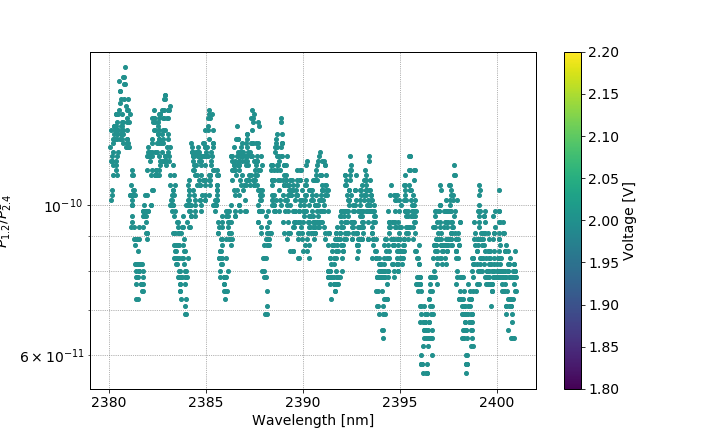

In [62]:
"""
After discussion with Mircea, we realized that the NIT camera is inverse of the actual chip layout as seen by eye.
We also discussed the asymmetry in the coupling diretionality of the ring resonator relative to the input light, meaning
that light input from what we usually call the "output" grating will see greater output at the middle grating outcoupler...
This is clear when you look at the GDS file, and consider only propagating waves in the waveguide AND resonator.  The
middle ring that Meysam put in has a little question-mark curve, and if you couple light at usual input ("top"), you 
will see light come out THIS grating, but the reflection off the end of the question mark, outwards...versus if you
come in at the bottom, you get light in the direction out towards the middle grating output.  Of course one would 
want to see light come from the third grating (NOT the middle), but if you look at Chris's simulations of the resonance
profiles for these devices, you'll find that it is not linear, and we could be operating in one of those "dark" regions...
in other words, the resonances of the larger snowman ring are harder to get to (since the length is longer), esp. if you
aren't scanning a broad enough range.  Moreover, these finesse of these resonances depends on other parameters (T, V_heaters)
again due to the non-linear resonance profile of the full bipartite resonator structure.
"""


%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2380*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 1700

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


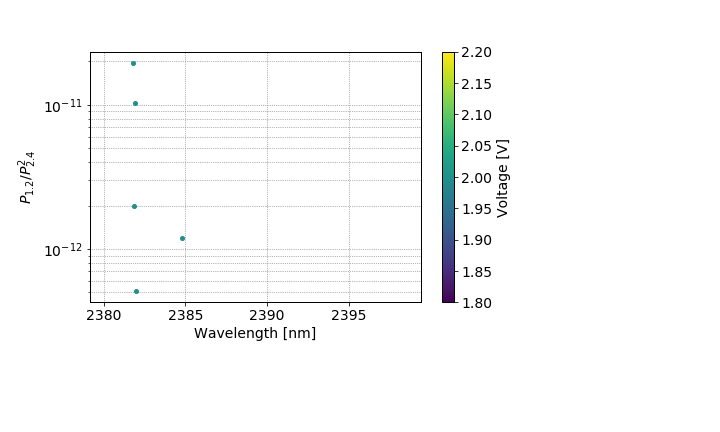

<IPython.core.display.Javascript object>


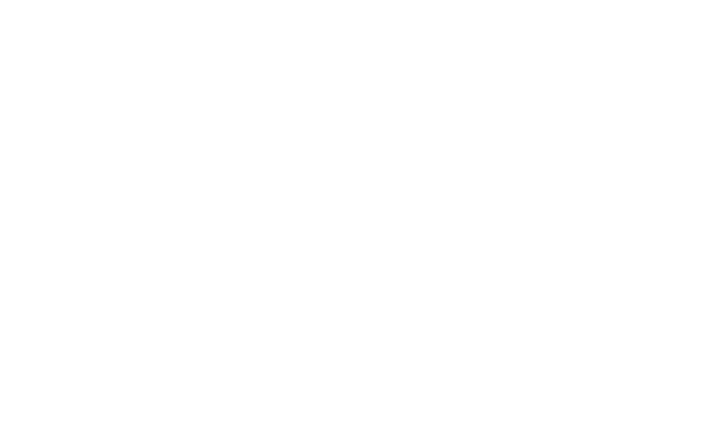

In [95]:
"""
1.2 in, measure 1.2 out; same procedure as above, except here we are measuring the output of the 1.2 out couplers; 
input wavelength is from IPG, and is upconverted with the SHG crystal.  Currently, the SHG covesion
oven is set to T=88 deg C...this is optimum for one wavelength (~2386 nm), but certainly may not
be for other wavelengths in this sweep.  We only want to see the structural feautures
of any resonances; we can make the plot look "nicer" by simply normalizing to the power generated
by SHG Covesion at this fixed temperature/xtal phase matching condition.  
"""


%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2380*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 1*u.second
n_pts = 1500

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1_1.2GrOut'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


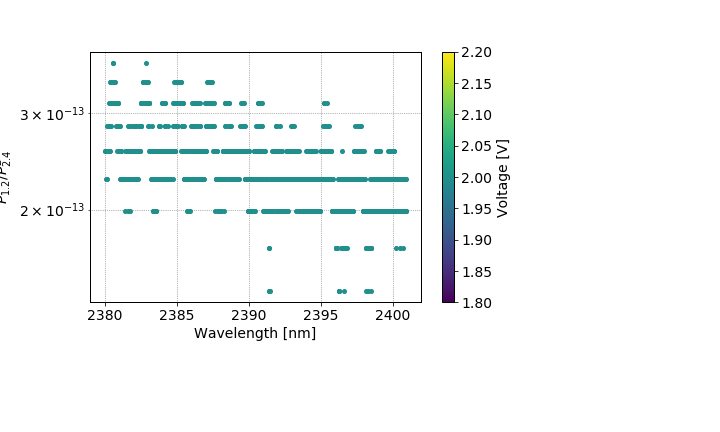

<IPython.core.display.Javascript object>


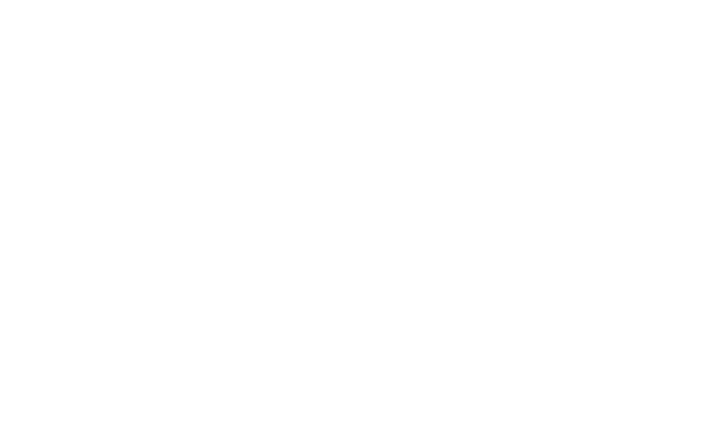

In [136]:
"""
The above sweep really just confirmed what we thought; since 1.2 is single pass, it should have
constant power output as a function of wavelength.  After discussion with Mircea and Edwin, we blocked
the middle grating, so really now we should be ONLY looking at the last output grating.  We also
improved the coupling in.  The idea is that changing the heater voltage, you are shifting power
from the ring to the single pass, bypassing the ring; so you should see power shift on/off from 
between these two lower gratings, depending on resonance condition...
Again: we use the (1) IPG TPZ001 sweep AND (2) heater voltage sweep to identify output traces
that are indicative of resonances which indicated light go through the grating...
"""

%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2380*u.nm
steps_per_point = 2
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 1700

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


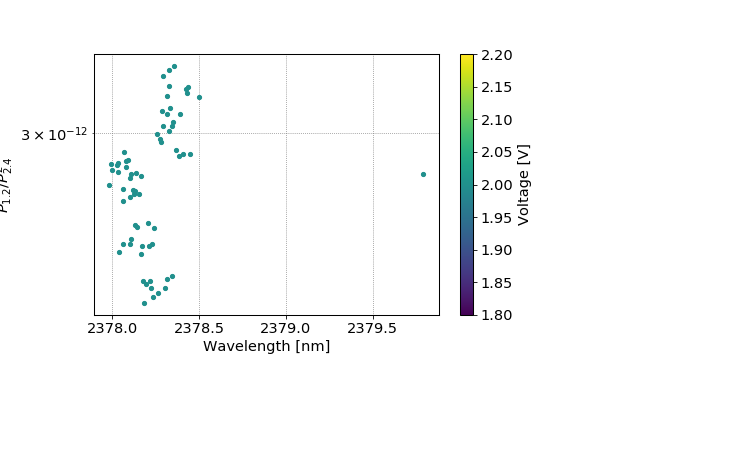

ValueError: shape mismatch: objects cannot be broadcast to a single shape

In [53]:
"""
Needed to correct the settings of the LIA.  We ensured good coupling from the output
grating, and used isolated this output on all four sides with the four independent slits.
"""

%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2378*u.nm
steps_per_point = 10
n_pts_per_setpoint = 10
settle_time = 1*u.second
n_pts = 100

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


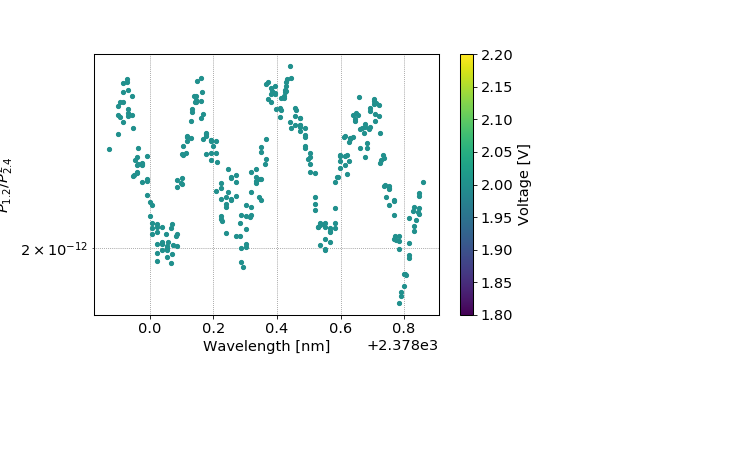

KeyboardInterrupt: 

In [55]:
"""
Needed to correct the settings of the LIA.  We ensured good coupling from the output
grating, and used isolated this output on all four sides with the four independent slits.
"""

%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2378*u.nm
steps_per_point = 1
n_pts_per_setpoint = 2
settle_time = 1*u.second
n_pts = 200

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


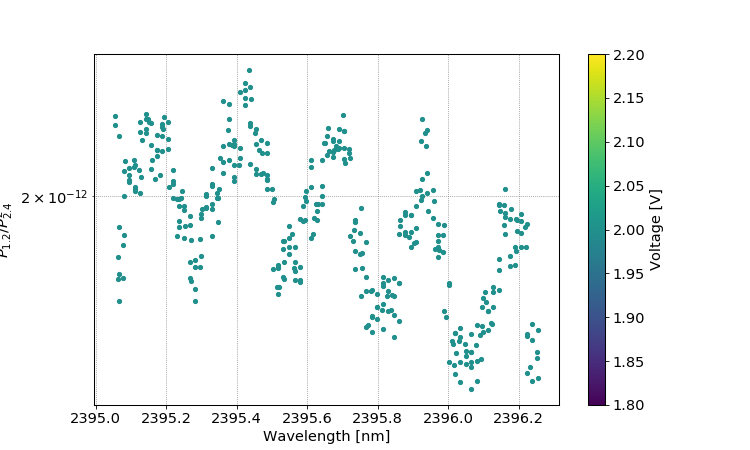

In [56]:
"""
Needed to correct the settings of the LIA.  We ensured good coupling from the output
grating, and used isolated this output on all four sides with the four independent slits.
"""

%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2395*u.nm
steps_per_point = 1
n_pts_per_setpoint = 2
settle_time = 1.5*u.second
n_pts = 200

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

<IPython.core.display.Javascript object>


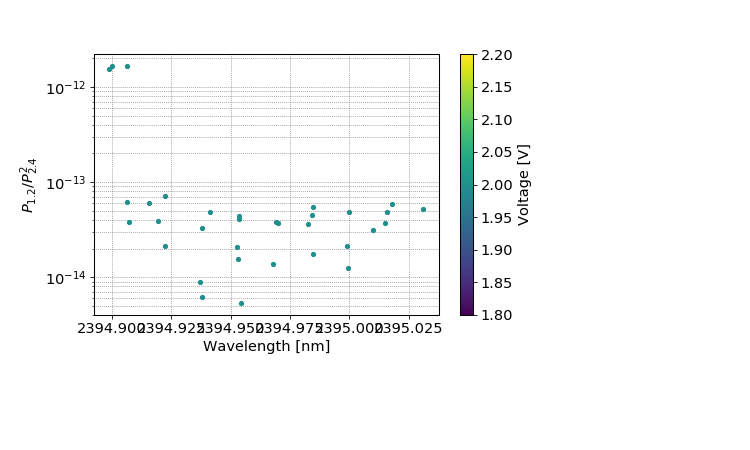

KeyboardInterrupt: 

In [57]:
"""
Block input to the uscope; background measurement.
"""

%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2395*u.nm
steps_per_point = 1
n_pts_per_setpoint = 2
settle_time = 1.5*u.second
n_pts = 200

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

In [91]:
lia.set_sensitivity(sr850.Sensitivity.x100mV_nA)
lia.set_time_constant(sr850.TimeConstant.x30ms)
lia.set_low_pass_slope(sr850.LowPassSlope.twelve_dB_per_octave)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
# configure scans and traces
t_scan = 10*u.second
lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
lia.set_scan_mode(sr850.ScanMode.single_shot)
lia.set_scan_sample_rate(sr850.ScanSampleRate.x1Hz)
lia.set_scan_length(t_scan)
lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.no)
lia.reset_scan()

In [92]:
lia.auto_phase()

<IPython.core.display.Javascript object>


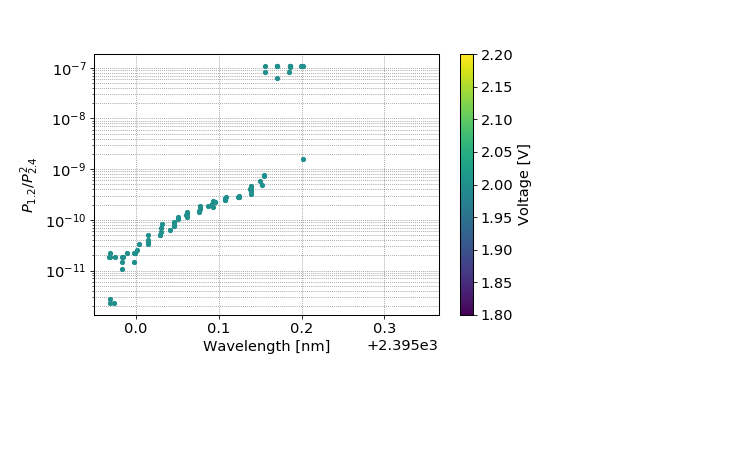

KeyboardInterrupt: 

In [93]:
"""
Input to Lock-in is the detector BEFORE the uscope, measuring input IPG light.
Obtaining the background.
"""

%matplotlib notebook
V = np.array([2.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2395*u.nm
steps_per_point = 1
n_pts_per_setpoint = 2
settle_time = 1.5*u.second
n_pts = 200

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

In [102]:
"""
Output 2.4 coupler measurement again.
Heater fixed to peak V that gives highest response.
"""

lia.set_sensitivity(sr850.Sensitivity.x10uV_pA)
lia.set_sensitivity(sr850.Sensitivity.x10uV_pA)
lia.set_time_constant(sr850.TimeConstant.x300ms)
lia.set_low_pass_slope(sr850.LowPassSlope.twelve_dB_per_octave)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
# configure scans and traces
t_scan = 10*u.second
lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
lia.set_scan_mode(sr850.ScanMode.single_shot)
lia.set_scan_sample_rate(sr850.ScanSampleRate.x1Hz)
lia.set_scan_length(t_scan)
lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.no)
lia.reset_scan()
lia.auto_phase()

In [103]:
lia.auto_phase()

In [104]:
lia.get_reference_frequency()

<Quantity(73.0419, 'hertz')>

<IPython.core.display.Javascript object>


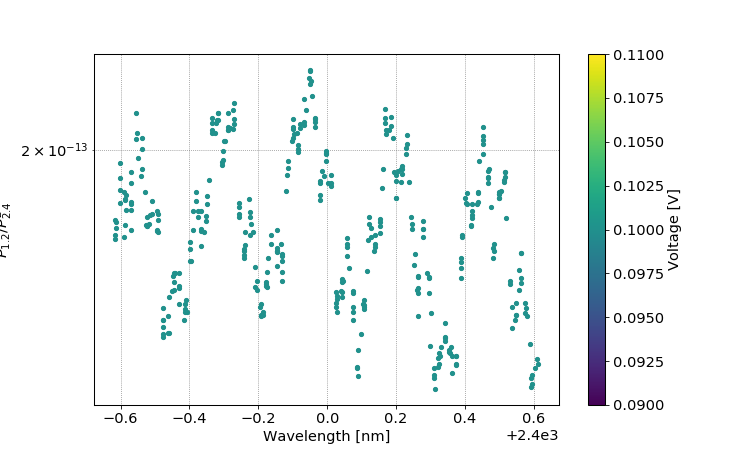

In [105]:
%matplotlib notebook
V = np.array([0.1])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2399.400*u.nm
steps_per_point = 1
n_pts_per_setpoint = 2
settle_time = 1.5*u.second
n_pts = 200

# T = np.array([20])
# for TT in T:
#     print_statusline(f'TT={TT}')
name = f'V_rb_sweep1_20C_dh_iv2Od1'
#     set_temp_and_wait(1.0*TT)
collect_SHG_V_wavelength_sweep(V,
                               set_V_fn,
                               lm_start,
                               steps_per_point,
                               n_pts,
                               name=name,
                               norm_with_P_trans=True,
                               n_pts_per_setpoint=n_pts_per_setpoint,
                               settle_time=settle_time,)

# Passive device measurements for loss characterization

In [67]:
lia.auto_phase()
# lia.auto_gain()

## configure LIA
lia.clear_registers()
# configure reference frequency
lia.set_reference_source(sr850.ReferenceSource.external) # use chopper reference out as lock-in reference signal
lia.set_reference_slope(sr850.ReferenceSlope.ttl_rising)
#lia.set_reference_phase(10.7*u.degree) # checked for current alignment by maximizing signal and running auto_phase, then checking reference phase
# configure inputs
lia.set_input_coupling(sr850.InputCoupling.AC)
#lia.set_input_ground(sr850.InputGround.floating)
lia.set_input_ground(sr850.InputGround.ground)
lia.set_input_configuration(sr850.InputConfiguration.I)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
lia.set_line_filter_status(sr850.LineFilter.both_filters)

In [66]:
# configure gain, time constant, sensitivity
lia.set_sensitivity(sr850.Sensitivity.x20uV_pA)
lia.set_time_constant(sr850.TimeConstant.x300ms)
lia.set_low_pass_slope(sr850.LowPassSlope.twelve_dB_per_octave)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
# configure scans and traces
t_scan = 10*u.second
lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
lia.set_scan_mode(sr850.ScanMode.single_shot)
lia.set_scan_sample_rate(sr850.ScanSampleRate.x1Hz)
lia.set_scan_length(t_scan)
lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.no)
lia.reset_scan()


In [69]:
# lia.get_reference_frequency()
lia.get_reference_phase()

<Quantity(16.775, 'degree')>

In [73]:
# Copy from argos test code of LIA to make sure if LIA is taking and recording measuremen

# read scans in
t_scan = 10*u.second
lia.reset_scan()
sleep(0.2)
lia.start_scan()
sleep(0.2)
sleep(t_scan.to(u.second).m)
while lia.scan_in_progress():
    sleep(0.2)
    
# LIA X+Y recording 
# tr1_both = lia.get_trace(sr850.TraceNumber.one)    # X
# sleep(1.0)
# tr2_both = lia.get_trace(sr850.TraceNumber.two)    # Y
# sleep(1.0)
# tr3_both = lia.get_trace(sr850.TraceNumber.three)  # R
# sleep(1.0)
tr4_both = lia.get_trace(sr850.TraceNumber.four)   # theta
# sleep(1.0)

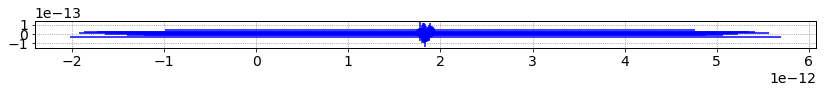

In [74]:
# plot scan data
%matplotlib inline
fig,ax = plt.subplots(1,1,figsize=(14,8))

r_max = 2.5e-10

ax.errorbar(tr1_both[1],tr2_both[1],yerr=tr4_both[1],xerr=tr3_both[1],fmt='bo', ecolor='b',)
# ax.set_xlim([-r_max,r_max])
# ax.set_ylim([-r_max,r_max])
ax.set_aspect('equal',adjustable='box')

In [31]:
lia.read_output(sr850.OutputType.Y)

<Quantity(-8.88184e-015, 'volt')>

<IPython.core.display.Javascript object>


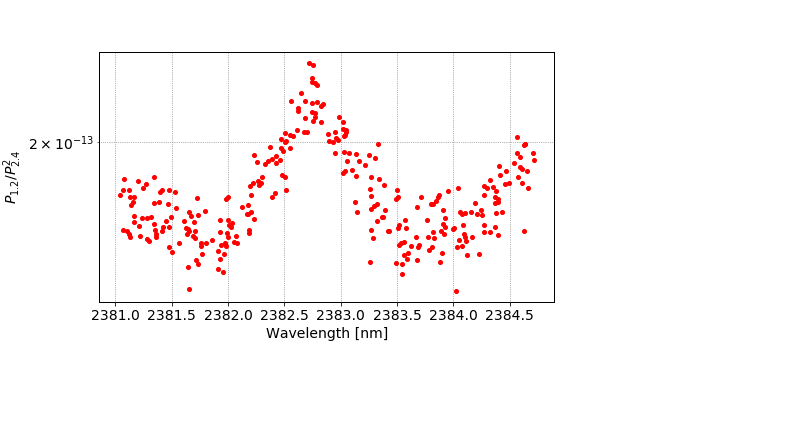

<IPython.core.display.Javascript object>


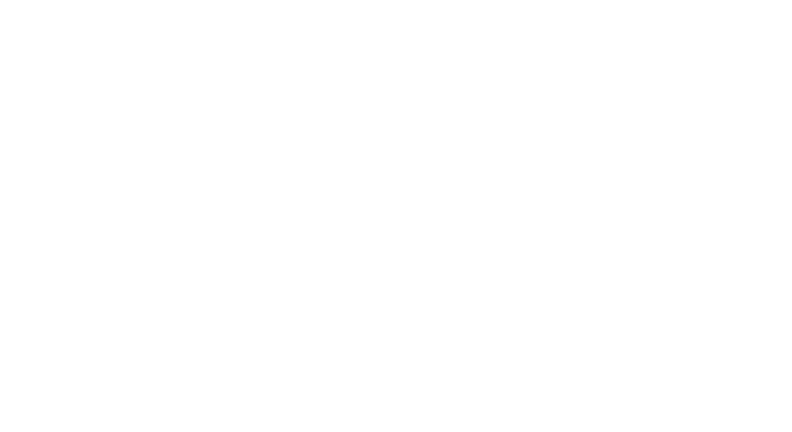

In [32]:
# Measured v1 "OPO-style" device, free standing for loss charactertization
# Checking for any output signals characteristic of light making it THROUGH the chip and out the output grating


fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 300

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])

<IPython.core.display.Javascript object>


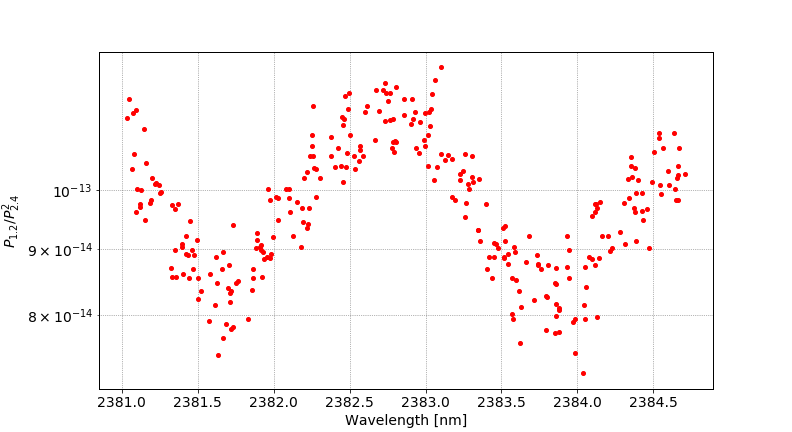

In [34]:
# Resonance is seen above, but what is this..?
# Moved to another point on the chip, off of the output grating, to see if the above is really true??  
# Light is coupling in, but 
# THIS light I am sending into the detector should not be from the output grating, which I verify using the camera 
# e.g. light after the slit, within the FOV of the NIT camera, does not appear to "look" like it is coming from the output
# grating.  However, there is still a signal from the detector, so SOMETHING is reflecting off, and I need to make sure it 
# is DIFFERENT from the data above (which presumes light had gone thru the chip and out of the output grating to the det.) 


fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 300

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])

<IPython.core.display.Javascript object>


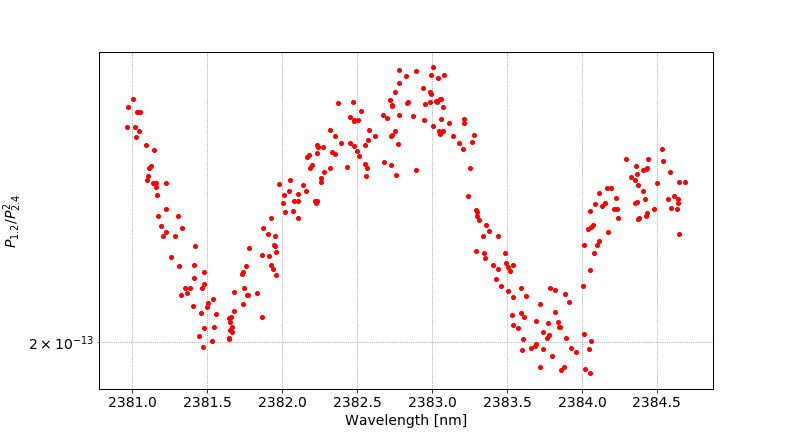

In [36]:
# Repeat, again back to the position where on the camera, it looked like to me I was seeing output light (after slit)
# Maximized signal by playing with knobs to improve coupling efficiency

fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 300

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])

<IPython.core.display.Javascript object>


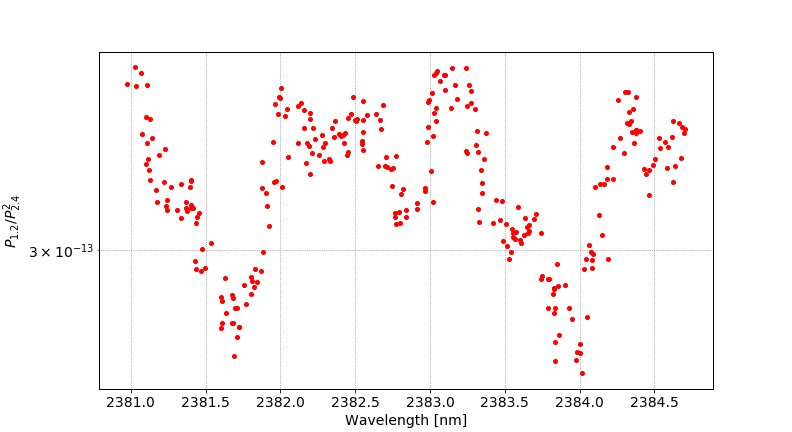

In [37]:
# Same meas as the previous ones, but a different "OPO" style device (third down)...
# Tried again to maximize DET signal by playing with input mirror to coupler knobs...

fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 300

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])

<IPython.core.display.Javascript object>


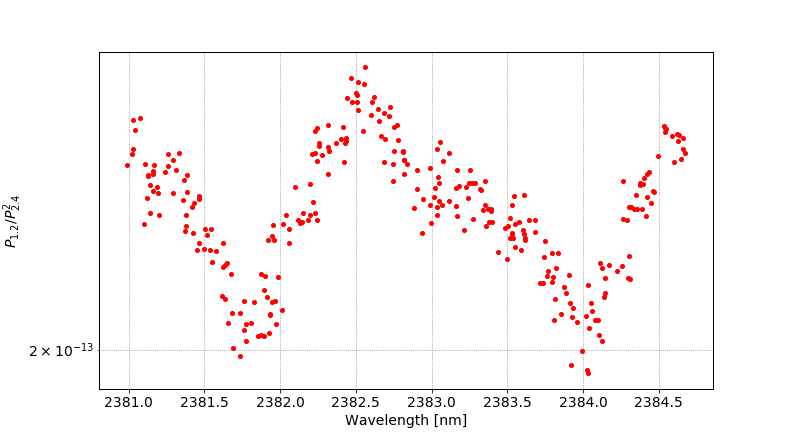

In [38]:
# Now that looks more promising.  Again, go to another place on device where the signal should really just be
# reflected light, and not light that had gone THROUGH the chip...

fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 300

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])

<IPython.core.display.Javascript object>


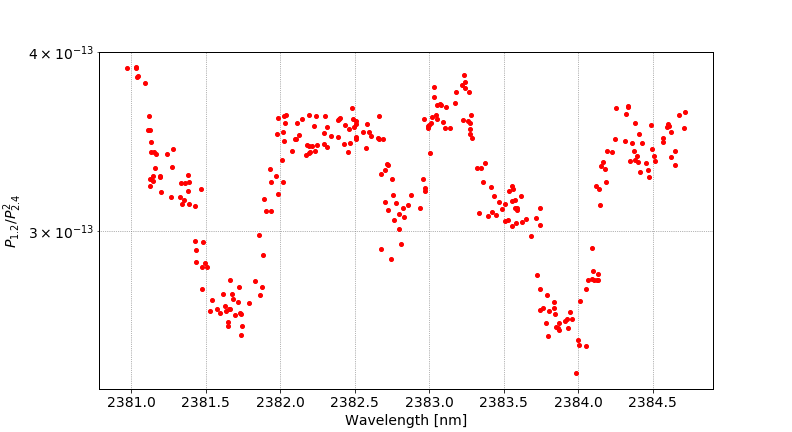

In [39]:
# Repeat the second to last again, same grating position, to see if we get same plot.

fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 300

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])

The above plot, complete with its doublets and signature peaks, suggests to me we have successfully coupled through the input to the output, esp. when you compare to other plots where I just measured light hitting the detector that did not appear (via NIT camera) to be coming from the output.

<IPython.core.display.Javascript object>


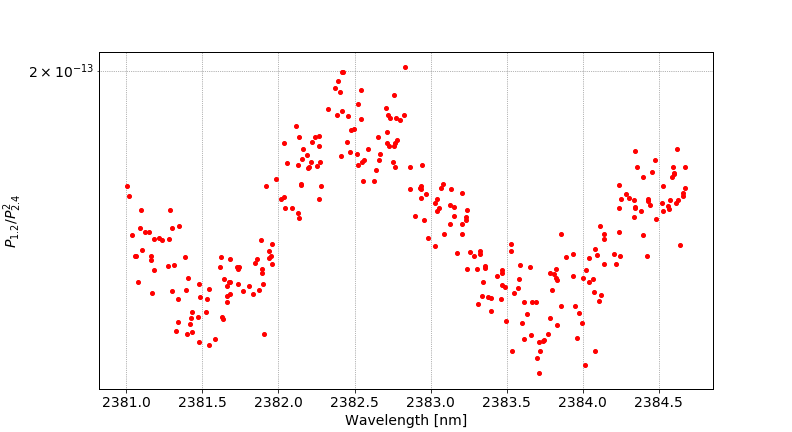

In [42]:
# Dodd wanted me to measure the "simpler" linear ring resonators (not the bipartite Hamerly resonator)
# I will "copy" over the current grating input settings onto those devices, since I do not believe the coupling condition
# for any given config of grating should be different WITHIN the same chip.
# This is (supposed) output light from the linear res devices, 10X objective

fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 300

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])

<IPython.core.display.Javascript object>


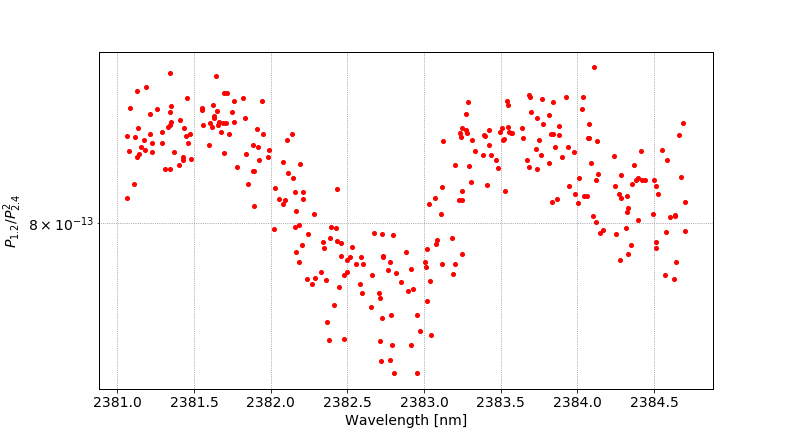

In [51]:
# 05/31/2019: where I believe to be collecting the output of a linear res 2.4 device


fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 300

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol_lr_out',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])

<IPython.core.display.Javascript object>


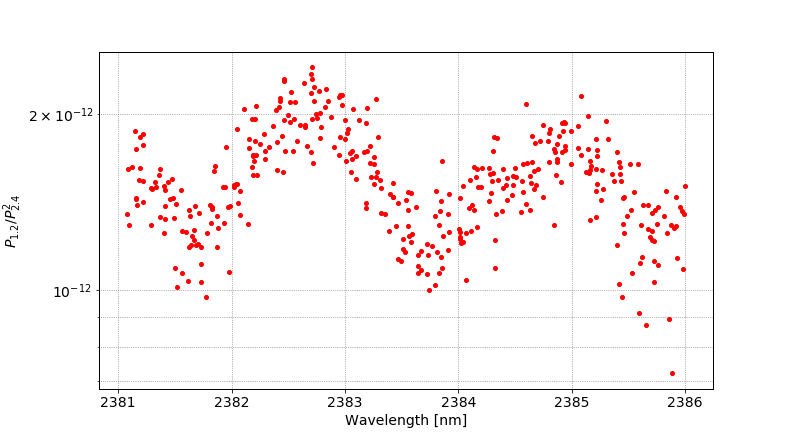

In [75]:
# 05/31/2019: where I believe to be collecting the output of a linear res 2.4 device
# second try

fig=None
ax=None

%matplotlib notebook
lm_start = 2381.0*u.nm
steps_per_point = 2
n_pts = 400

fpath_test0_ol,fig,ax = collect_shg_open_loop_wavelength_sweep(lm_start,
                                      steps_per_point,
                                      n_pts,
                                     name='test0_ol_lr_out',
                                     autogain=False,
                                     n_pts_per_setpoint=1,
                                     settle_time=1.5*u.second,
                                                   color=colors[0])

# SFG detector photocurrent lock-in measurements

In [85]:
## configure LIA
lia.clear_registers()
# configure reference frequency
lia.set_reference_source(sr850.ReferenceSource.external) # use chopper reference out as lock-in reference signal
lia.set_reference_slope(sr850.ReferenceSlope.ttl_rising)
lia.set_reference_phase(10.6*u.degree) # checked for current alignment by maximizing signal and running auto_phase, then checking reference phase
# configure inputs
lia.set_input_coupling(sr850.InputCoupling.AC)
#lia.set_input_ground(sr850.InputGround.floating)
lia.set_input_ground(sr850.InputGround.ground)
lia.set_input_configuration(sr850.InputConfiguration.I)
lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
lia.set_line_filter_status(sr850.LineFilter.both_filters)

# configure gain, time constant, sensitivity
lia.set_sensitivity(sr850.Sensitivity.x100nV_fA)
#lia.set_sensitivity(sr850.Sensitivity.x500mV_nA)
lia.set_time_constant(sr850.TimeConstant.x10s)
lia.set_low_pass_slope(sr850.LowPassSlope.twentyfour_dB_per_octave)

<IPython.core.display.Javascript object>


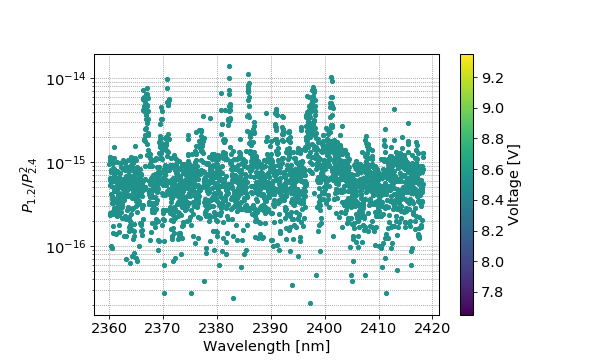

KeyboardInterrupt: 

In [8]:
# IMEC V2 WB2 CH3 top right SFG detector. λ = 3.35μm (DFB from Mikey) chopped and coupled through home-cleaved ZBLAN fiber


%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2360*u.nm
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 15*u.second
n_pts = 6000

T = np.array([35,45,55])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


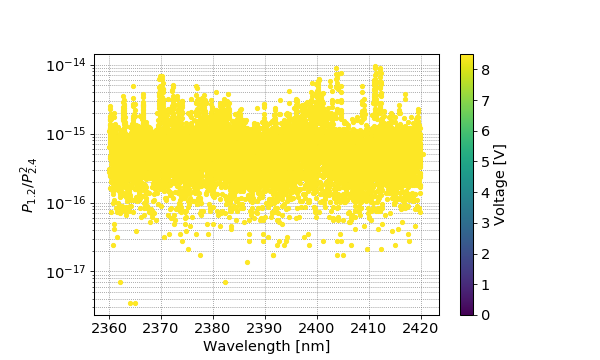

In [ ]:
# IMEC V2 WB2 CH3 top right SFG detector. λ = 3.35μm (DFB from Mikey) chopped and coupled through home-cleaved ZBLAN fiber


%matplotlib notebook
V = np.array([8.5,0.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2360*u.nm
steps_per_point = 4
n_pts_per_setpoint = 4
settle_time = 15*u.second
n_pts = 6000

T = np.array([35,45,55])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_take2'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

<IPython.core.display.Javascript object>


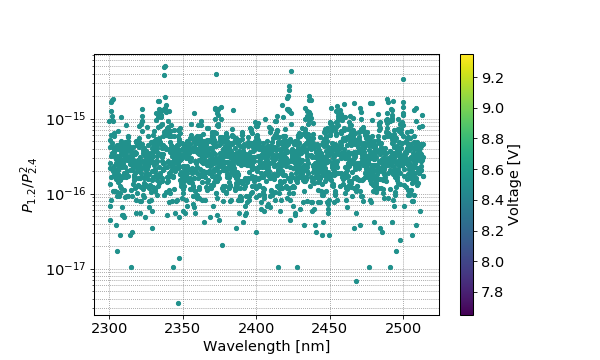

KeyboardInterrupt: 

In [86]:
# IMEC V2 WB2 CH3 top right SFG detector. λ = 3.35μm (DFB from Mikey) chopped and coupled through home-cleaved ZBLAN fiber
# 1/11/19 Dodd & David remote Dodd

%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2300*u.nm
steps_per_point = 16
n_pts_per_setpoint = 1
settle_time = 60*u.second
n_pts = 4000

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
ipg.power_down()

<IPython.core.display.Javascript object>


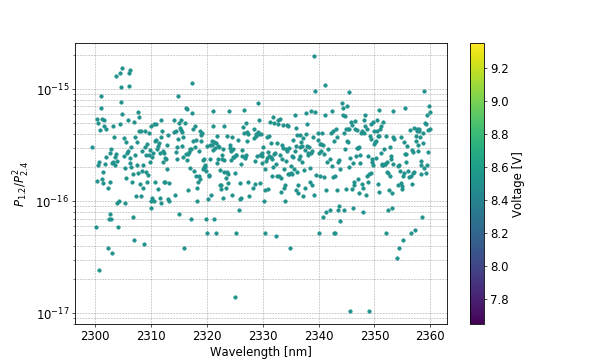

In [87]:
# IMEC V2 WB2 CH3 top right SFG detector. λ = 3.35μm (DFB from Mikey) chopped and coupled through home-cleaved ZBLAN fiber
# 1/13/19 Dodd & David remote Dodd

%matplotlib notebook
V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2300*u.nm
steps_per_point = 16
n_pts_per_setpoint = 1
settle_time = 60*u.second
n_pts = 600

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
ipg.power_down()

<IPython.core.display.Javascript object>


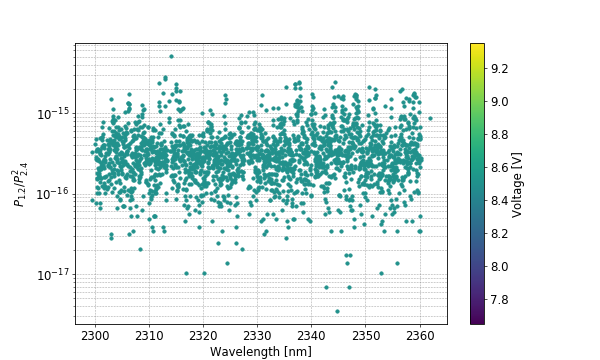

In [88]:
# IMEC V2 WB2 CH3 top right SFG detector. λ = 3.35μm (DFB from Mikey) chopped and coupled through home-cleaved ZBLAN fiber
# 1/15/19 Dodd & David remote Dodd

%matplotlib notebook
ipg.power_up()

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2300*u.nm
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 60*u.second
n_pts = 2400

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry2'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
ipg.power_down()

<IPython.core.display.Javascript object>


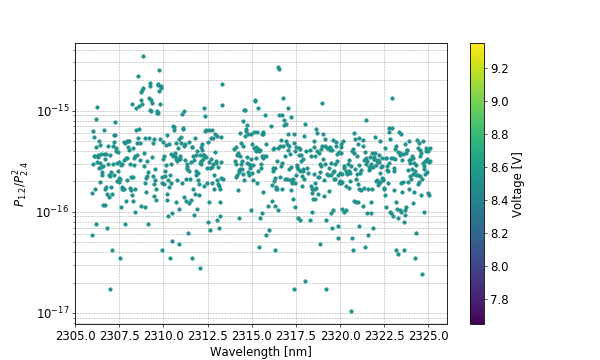

In [89]:
# IMEC V2 WB2 CH3 top right SFG detector. λ = 3.35μm (DFB from Mikey) chopped and coupled through home-cleaved ZBLAN fiber
# 1/17/19 Dodd & David remote Dodd
## Here we turn OFF the 3um source and see whether or not the peaks we see in the above traces are coming from interaction of both sources or just the 2um source

%matplotlib notebook
ipg.power_up()

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2306*u.nm
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 60*u.second
n_pts = 760  #point to point goes through 0.025nm; 1000 points from 2300 will end up at 2325nm.

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry2'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
ipg.power_down()

<IPython.core.display.Javascript object>


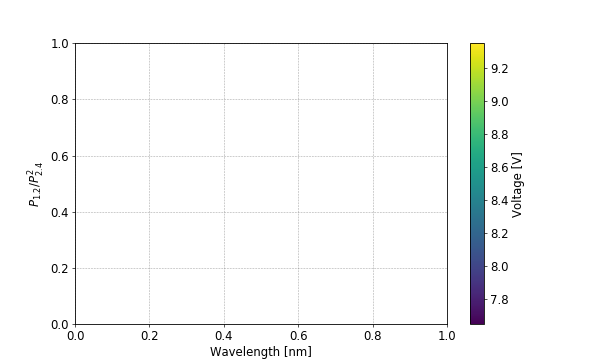

IPG is off.


In [4]:
# IMEC V2 WB2 CH3 top right SFG detector. λ = 3.35μm (DFB from Mikey) chopped and coupled through home-cleaved ZBLAN fiber
# 1/18/19
## Here we turn OFF BOTH the 2um ipg source and the 3um source to again better understand these peaks showing up in above plots.

%matplotlib notebook

ipg.power_up()

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2306*u.nm  #still plot but with 2um source not on and not cause issues with other defined functions
steps_per_point = 4
n_pts_per_setpoint = 1
settle_time = 60*u.second
n_pts = 760  #point to point goes through 0.025nm; 1000 points from 2300 will end up at 2325nm.

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry3'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time)
    
ipg.power_down()

<IPython.core.display.Javascript object>


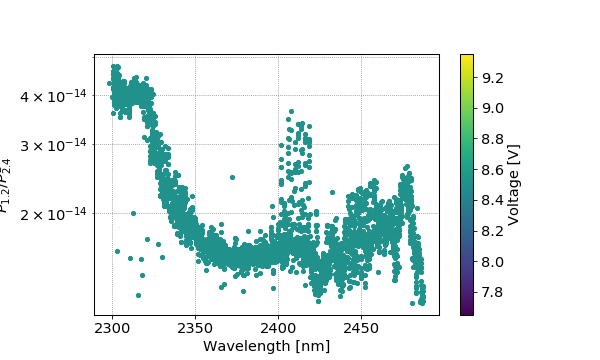

KeyboardInterrupt: 

In [3]:
# IMEC V2 WB2 CH3 top right SFG detector. λ =~ 3.4μm (Argos OPO source, FIXED, P_amp = 12W) chopped and coupled through home-cleaved ZBLAN fiber
# 1/27/19 Dodd & David remote Dodd; with the right connection from the on-chip detectors to the LIA this time!
# T_stage = 20 degC

%matplotlib notebook
#ipg.power_up()

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2300*u.nm
steps_per_point = 10
n_pts_per_setpoint = 1
settle_time = 60*u.second
n_pts = 4000

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry5'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
ipg.power_down()

<IPython.core.display.Javascript object>


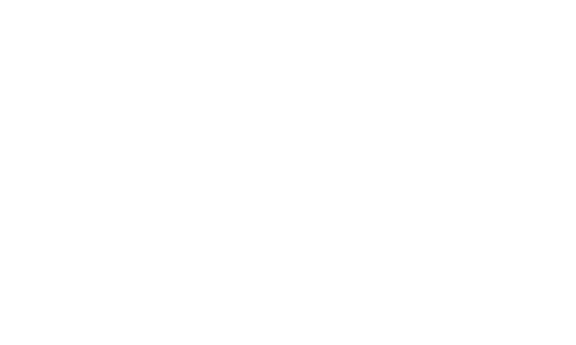

<IPython.core.display.Javascript object>


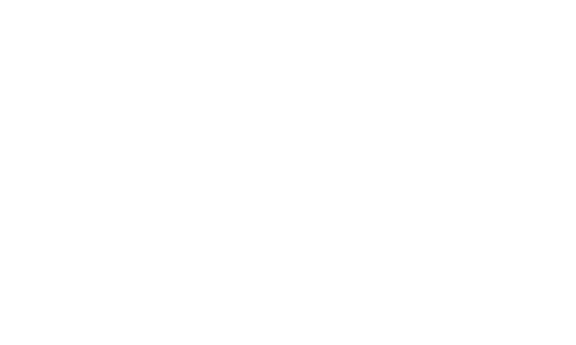

In [119]:
# IMEC V2 WB2 CH3 top right SFG detector. λ =~3.315μm (Argos OPO source, FIXED, P_amp = 13W) chopped and coupled through home-cleaved ZBLAN fiber
# 1/29/19
# Repeat last meas from 2390nm to 2450nm; find the phase matching condition for SFG!!!
# T_stage = 20 degC

%matplotlib notebook
#ipg.power_up()

lia.set_time_constant(sr850.TimeConstant.x300ms)
lia.set_sensitivity(sr850.Sensitivity.x1V_uA)

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2390*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 2*u.second  # >5x time constants
n_pts = 2600

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry6'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
ipg.power_down()

<IPython.core.display.Javascript object>


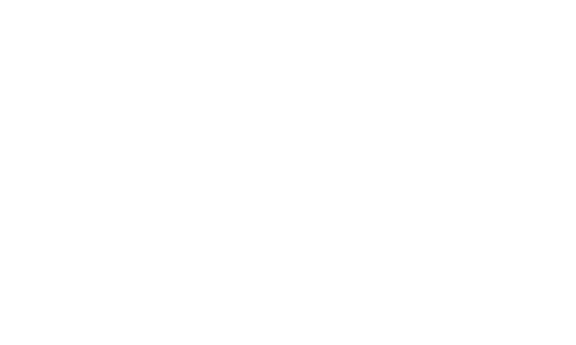

<IPython.core.display.Javascript object>


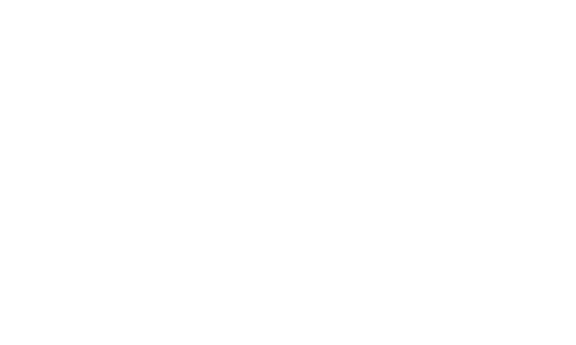

<IPython.core.display.Javascript object>


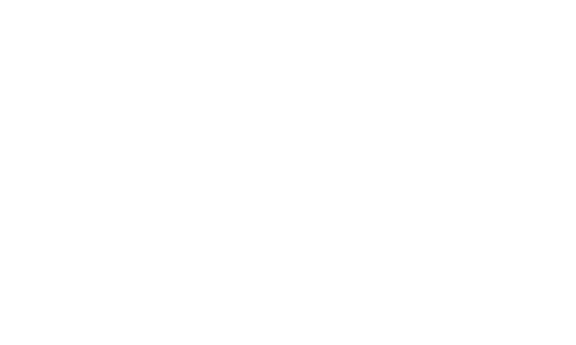

KeyboardInterrupt: 

<IPython.core.display.Javascript object>


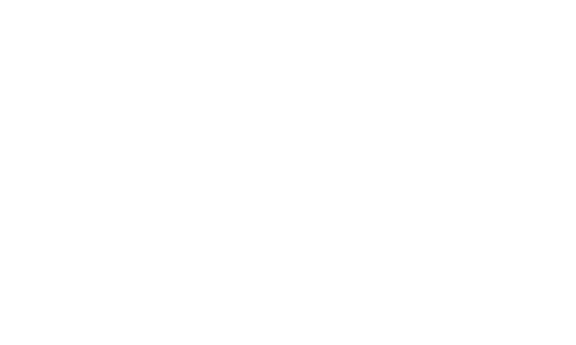

<IPython.core.display.Javascript object>


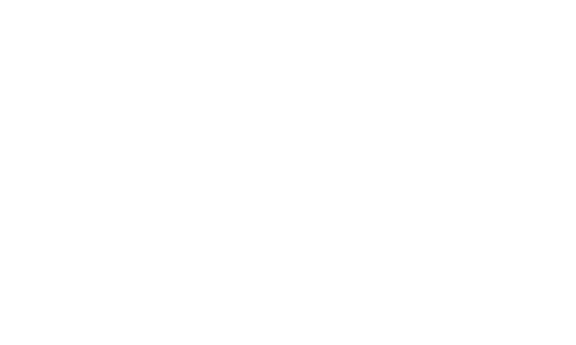

<IPython.core.display.Javascript object>


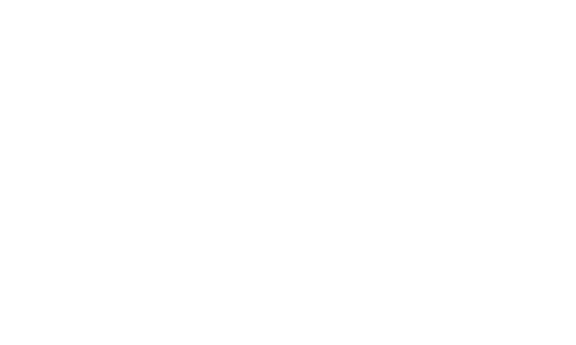

In [121]:
# IMEC V2 WB2 CH3 top right SFG detector. λ =~3.317μm (Argos OPO source, FIXED, P_amp = 13W) chopped and coupled through home-cleaved ZBLAN fiber
# 1/30/19
# Repeat last meas from 2390nm to 2450nm; find the phase matching condition for SFG!!!
# Changing the temperature of the stage.

%matplotlib notebook
ipg.power_up()

lia.set_time_constant(sr850.TimeConstant.x300ms)
lia.set_sensitivity(sr850.Sensitivity.x1V_uA)

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2390*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 2*u.second  # >5x time constants
n_pts = 2600

T = np.array([35,45,55])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry7'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
ipg.power_down()

<IPython.core.display.Javascript object>


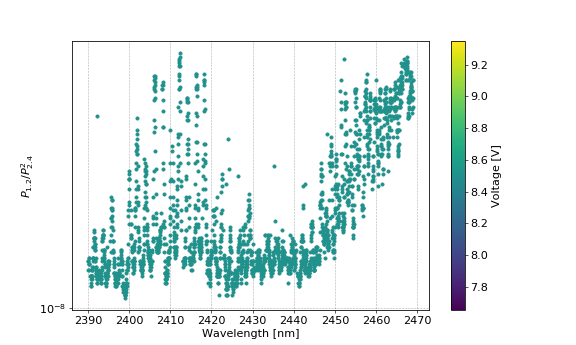

In [127]:
# IMEC V2 WB2 CH3 top right SFG detector. λ =~3.289μm (Argos OPO source, FIXED, P_amp = 13W) chopped and coupled through home-cleaved ZBLAN fiber
# 1/30/19
# Repeat last meas from 2390nm to 2450nm; find the phase matching condition for SFG!!!
# Keep temp at 20C; this has the sharpest resonances; notice the Argos is blueshifted from the last measurement.

%matplotlib notebook
#ipg.power_up()

# lia.set_time_constant(sr850.TimeConstant.x300ms)
# lia.set_sensitivity(sr850.Sensitivity.x1V_uA)

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2390*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 2*u.second  # >5x time constants
n_pts = 2600

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry8'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
#ipg.power_down()

<IPython.core.display.Javascript object>


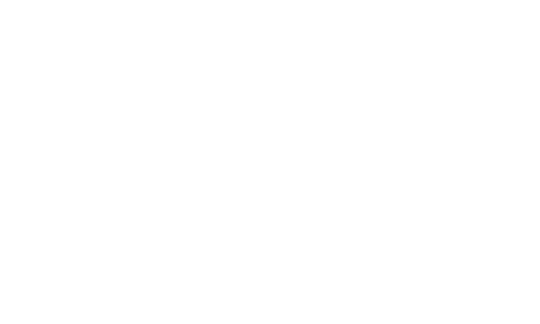

<IPython.core.display.Javascript object>


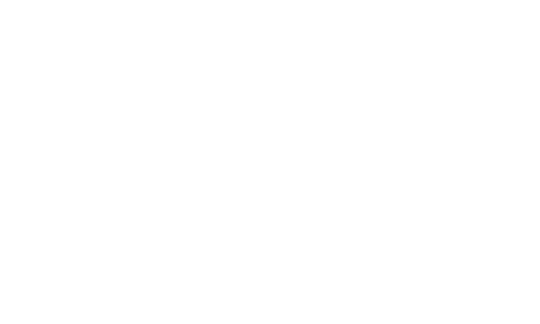

In [294]:
# IMEC V2 WB2 CH3 top right SFG detector. λ =~3.32um (Argos OPO source, FIXED, P_amp = 13W) chopped and coupled through home-cleaved ZBLAN fiber
# 1/31/19  12:50am
# Repeat last meas from 2390nm to 2450nm; find the phase matching condition for SFG!!!
# Keep temp at 20C; this has the sharpest resonances; notice the Argos is blueshifted from the last measurement.
# Double chop: chop BOTH Argos AND IPG.  Argos chopper is second harmonic (280Hz); IPG chopper is the reference to the Argos Chopper (140Hz)

%matplotlib notebook
#ipg.power_up()

# Good lIA settings (as evidenced by stable X and Y phase traces)
# LIA time constant = x3ms
# LIA sensitivity = x100mV_nA

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2390*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 2*u.second  # >5x time constants
n_pts = 2600

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry9'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
ipg.power_down()

<IPython.core.display.Javascript object>


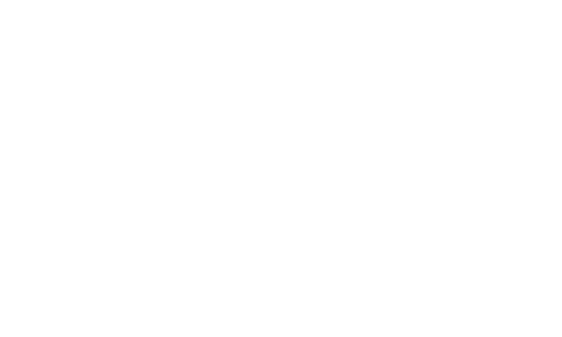

KeyboardInterrupt: 

In [8]:
# IMEC V2 WB2 CH3 top right SFG detector. λ =~3.441um (Argos OPO source, FIXED, P_amp = 12W) chopped and coupled through home-cleaved ZBLAN fiber
# 02/01/19
# Double chop: chop BOTH Argos AND IPG.  Argos chopper is second harmonic (280Hz); IPG chopper is the reference to the Argos Chopper (140Hz)

%matplotlib notebook
#ipg.power_up()

# Good lIA settings (as evidenced by stable X and Y phase traces)
# LIA time constant = x3ms
# LIA sensitivity = x100mV_nA

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2390*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 2*u.second  # >5x time constants
n_pts = 2600

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry10'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
#ipg.power_down()

<IPython.core.display.Javascript object>


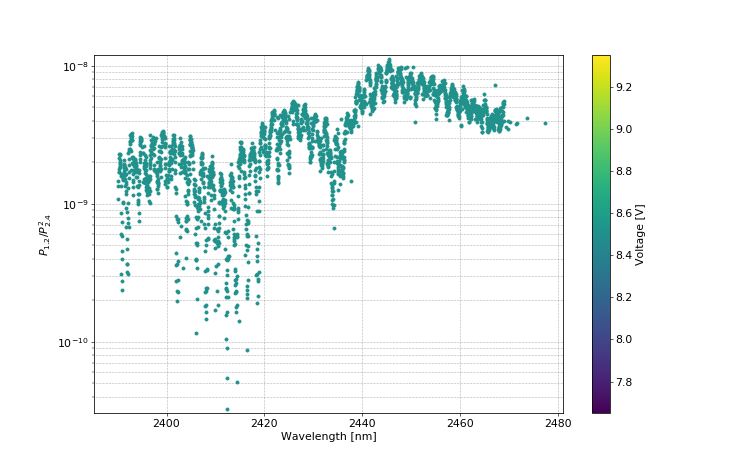

In [4]:
# IMEC V2 WB2 CH3 top right SFG detector. λ = N/A (Argos OPO source, FIXED, P_amp = N/A) chopped and coupled through home-cleaved ZBLAN fiber
# 02/01/19
# Just a repeat of the above measurement with the Argos off, only IPG on.

%matplotlib notebook
#ipg.power_up()

# Good lIA settings (as evidenced by stable X and Y phase traces)
# LIA time constant = x3ms
# LIA sensitivity = x100mV_nA

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2390*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 2*u.second  # >5x time constants
n_pts = 2600

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry11'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
#ipg.power_down()

<IPython.core.display.Javascript object>


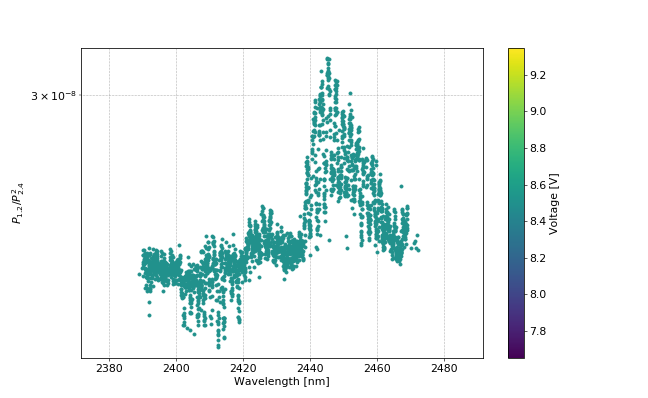

In [7]:
# IMEC V2 WB2 CH3 top right SFG detector. λ =~3.247um (Argos OPO source, FIXED, P_amp = 12W) chopped and coupled through home-cleaved ZBLAN fiber
# 02/02/19
# Double chop: chop BOTH Argos AND IPG.  Argos chopper is second harmonic (280Hz); IPG chopper is the reference to the Argos Chopper (140Hz)

%matplotlib notebook
#ipg.power_up()

# Good lIA settings (as evidenced by stable X and Y phase traces)
# LIA time constant = x3ms
# LIA sensitivity = x100mV_nA

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2390*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 2*u.second  # >5x time constants
n_pts = 2600

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry12'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    
ipg.power_down()

<IPython.core.display.Javascript object>


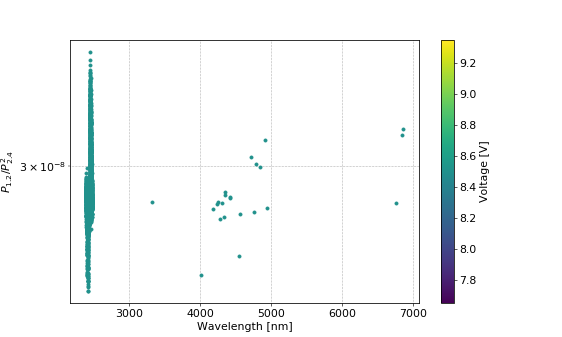

In [14]:
# IMEC V2 WB2 CH3 top right SFG detector. λ =~3.301um (Argos OPO source, FIXED, P_amp = 12W) chopped and coupled through home-cleaved ZBLAN fiber
# 02/04/19
# Double chop: chop BOTH Argos AND IPG.  Argos chopper is second harmonic (280Hz); IPG chopper is the reference to the Argos Chopper (140Hz)

%matplotlib notebook
#ipg.power_up()

# Good lIA settings (as evidenced by stable X and Y phase traces)
# LIA time constant = x3ms
# LIA sensitivity = x100mV_nA

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2390*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 2*u.second  # >5x time constants
n_pts = 2600

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry12'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    

<IPython.core.display.Javascript object>


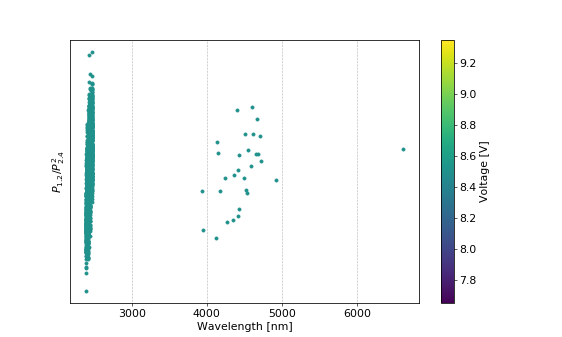

In [104]:
# IMEC V2 WB2 CH3 top right SFG detector. λ =~3.288um (Argos OPO source, FIXED, P_amp = 12W) chopped and coupled through home-cleaved ZBLAN fiber
# 02/04/19
# Double chop: chop BOTH Argos AND IPG.  Argos chopper is second harmonic (280Hz); IPG chopper is the reference to the Argos Chopper (140Hz)
# IPG is blocked (shuttered); ARGOS is on.

%matplotlib notebook
#ipg.power_up()

# Good lIA settings (as evidenced by stable X and Y phase traces)
# LIA time constant = x3ms
# LIA sensitivity = x100mV_nA

V = np.array([8.5])*u.volt #np.linspace(8.75,9.25,3) * u.volts
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2390*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 2*u.second  # >5x time constants
n_pts = 2600

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'V2_WB2_CH3_top_right_SFG_{TT}C_retry13'
    if not (TT==T[0]):
        set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=False,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)
    

# 1.2$\mu$m phase modulation

In [6]:
# First using New Focus 4004 Broadband IR phase modulator
# oddly it is labeled as 4003 (resonant phase modulator of same type)
# but says "broadband" where it should list the resonant RF frequency.
# subsequent measurement of the RF return loss spectrum supports that it is broadband, thus 4003

# I'll use a New Focus 4311 High Voltage amp (with sufficient current capacity for Vpp=Vπ@500kHz for broadband EOMs)
λ = 1.19 * u.um

Vπ_4003_1064 = 212 * u.volt
Vπ_4003 = Vπ_4003_1064 * λ.to(u.um).m / 1.064
Vπ_4311_in = Vπ_4003 * 5.0 / 200 # Vpp needed at input for π-phase modulation
Vπ_4311_mon = Vπ_4003 / 30.0 # Vpp seen on monitor output for π-phase modulation

printval(Vπ_4003)
printval(Vπ_4311_in)
printval(Vπ_4311_mon)

# note, I checked my mixing circuit with a mock signal from the AFG also generating the EOM signal
# and it appears to work. A 300mVpp (50Ω load setting on AFG) signal at the EOM frequency with 
# arbitrary DC offset into the bias-T generates a -141mV DC signal viewed with a 50Ω input impedence
# on a scope (0V with a high-Z input impedance on the scope) when the relative phase is set to 0deg
# on the AFG, and 139 when the phase is set to 180deg. The output magnitude is minimized for a relative phase of
# 87.5deg and maximized for a relative phase of ~-5deg at -142mV, indicating a very small phase lag that
# might change in the end. This gives me a conversion of the mixed-down signal to the true peak-to-peak variation
# coming from the detector. Note, this was for 9dBm LO power going into mixer at 500kHz.

g_mix = 142.0 / 300.0 # Vpp-to-DC conversion to get mixed down signal from Vpp on detector

Vπ_4003: 237.1 volt
Vπ_4311_in: 5.9 volt
Vπ_4311_mon: 7.9 volt


# Power measurements

In [30]:
### 2.4um detector properties 

## Thorlabs DET10D, Extended InGaAs biased photodiode, 900-2600nm

# from datasheet
# Peak Response (λ p) 1.3 A/W
# Shunt Resistance Rsh 14 kΩ (Typ.)
# Diode Capacitance CJ 500 pF (Typ.)
# Rise Timea,b,c tr 25 ns (Typ.)
# NEP (λ p) - 1.5 x 10-12 W/√Hz (Typ.)
# Bias Voltage VR 1.8 V
# Dark Currentd ID 5 µA (Typ.)
# 40 µA (Max)
# Output Voltage VOUT 0 to 2 V 

responsivity_DET10D = 1.3 * u.ampere / u.watt
R_load_DET10D = 50 * u.ohm
V_responsivity_DET10D = (responsivity_DET10D * R_load_DET10D).to(u.volt/u.watt)
NEP_DET10D = 1.5e-12*u.watt/(u.Hz**(0.5))
#det_bw_24 = 10 * u.kHz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)

## Thorlabs PDA20H, Amplified PbSe photoconductor, 1.5-4.8μm, AC couple
# Detector PbSe
# Active Area 2 x 2 mm
# Wavelength Range 1.5 μm to 4.8 μm
# Peak Wavelength (λp) 4.0 μm
# Bandwidth (-3 dB) 0.2 Hz to 10 kHz
# Rise Time (0 - 63%) 35 μs
# Voltage Gaina 50x / 100x
# Output Voltagea ±5 V / ±10 V
# NEPb 1.5 x 10-10 W/√Hz
# Detectivity, D* (at λp) 1.3 x 109
#  cm × √Hz/W
# Peak Sensitivity 3.0 x 103 V/W (Typ.)
# 1.5 x 103 V/W (Min.) 


V_responsivity_PDA20H = 0.6 * 3e3 * u.volt/u.watt # at 2.4um, ~70% of peak
NEP_PDA20H = 1.5e-10*u.watt/(u.Hz**(0.5))


# Thorlabs PDA10D2, Extended InGaAs amplified photodiode, 900-2600nm

# Detector - InGaAs
# Active Area - Ø1.0 mm (0.8 mm2)
# Wavelength Range λ 900 to 2600 nm
# Peak Wavelength λ p 2300 nm (Typ.)
# Peak Response ( λ p) 1.35 A/W (Typ.)
# Small Signal Bandwidth - 25 MHz
# NEP (λ p) W/√Hz 1.01 x 10-11
# Noise (RMS) - 2.5 mVrms
# Max Ouput Current IOUT 100 mA
# Dark Offset - ±75 mV (Typ.), ±375 mV (Max)
# Load Impedance - 50 Ω to Hi-Z
# Transimpedance Gain 
#  V/A (50 Ω) 5 x 10^3
#  V/A (Hi-Z) 1 x 10^4
# Output Voltage VOUT
# 0 to 5 V (50 Ω)
# 0 to 10 V (Hi-Z)

responsivity_PDA10D2 = 1.3 * u.ampere / u.watt # near 2.4μm
tia_gain_PDA10D2 = 1e4 * u.volt / u.ampere
V_responsivity_PDA10D2 = (responsivity_PDA10D2 * tia_gain_PDA10D2).to(u.volt/u.watt)
NEP_PDA10D2 = 1e-11*u.watt/(u.Hz**(0.5))
bandwidth_PDA10D2 = 25 * u.MHz # 


# 1.2 μm detector properties

# # 1.2um detector properties (Thorlabs PDA10CF)
# responsivity_12 = 0.76 * u.ampere / u.watt
# tia_gain_12 = 1e4 * u.volt / u.ampere
# NEP_12 = 1.2e-11*u.watt/(u.Hz**(0.5)) # this is the NEP at peak responsivity = 1.04A/W @ 1.5um, should adjust
# det_bw_12 = 1 * u.Hz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)

# # 1.2um detector properties (Thorlabs PDA10CS at 60dB gain setting)
# responsivity_12 = 0.83 * u.ampere / u.watt
# tia_gain_12 = 1.5e6 * u.volt / u.ampere
# NEP_12 = 1.5e-12*u.watt/(u.Hz**(0.5)) # this is the NEP at peak responsivity = 1.04A/W @ 1.5um, should adjust
# det_bw_12 = 3e3 * u.Hz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)


#### 1.2um detector properties

## New Focus 2011 "candybar" at G=1e4 gain setting
responsivity_NF2011_12 = 0.8 * u.ampere / u.watt
tia_gain_NF2011_12 = 1.5e7 * u.volt / u.ampere
NEP_NF2011_12 = 2e-13*u.watt/(u.Hz**(0.5)) # this is the NEP at peak responsivity = 1.04A/W @ 1.5um, should adjust
det_bw_NF2011_12 = 3e3 * u.Hz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)

printval(V_responsivity_DET10D)

## Thorlabs DET08C 80μm InGaAs detector

# wavelength range: 800 - 1700 nm
# Material: InGaAs
# Active Area: Ø80 µm
# Bandwidth (-3 dB): 5 GHz
# Input: Flat, AR-Coated Window
# Minimum Resistor Load: 50 Ω
# Maximum Peak Power	18 mW	100 mW
# Output Voltage: 2 V (Max)
# Rise Time (tr):70 ps @ 1538 nm, 20%/80% (Typ.)
# Fall Time (tf): 250 ps @ 1538 nm, 80%/20% (Typ.)
# Bias Voltage: 12 V
# Dark Current: 1.5 nA
# NEP (Maximum): 2e-15 W/√Hz (@ 1550 nm)
# Junction Capacitance: 0.3 pF

responsivity_DET08C_12 = 0.8 * u.ampere / u.watt
NEP_DET08C_12 = 2e-15 * u.watt / np.sqrt(1*u.Hz)


V_responsivity_DET10D: 65.0 volt / watt


η_iso: 0.813
η_fiber: 0.157
T_DM_24: 1.000
P_beam_sample_24: 476.923 microwatt
power_ratio_beam_sample_24: 0.0177
P_T_bs_trans_24: 1.222 milliwatt
power_ratio_bs_trans_24: 0.123
P_T_chip_24: 0.954 microwatt
P_input_chip_24: 5.3 milliwatt
P_output_chip_24: 13.8 microwatt
η_chip_24: 0.0026
η_gc_24_floor: 0.051
η_gc_24_input_estimate: 0.093
η_pm2000_mean: 0.372
max η_pm2000: 0.389
min η_pm2000: 0.338
P_trans_12: 56.2 microwatt


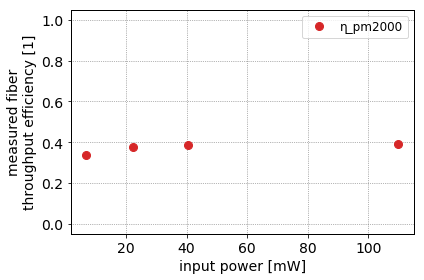

In [31]:
##### Measurements to document coupling efficiencies
%matplotlib inline
#### Oct 28 2018

### Thermal power meter measurements at several points along the optical path

## Uncoated CaF2 optic transmission@2.4μm ~ 89% (from Thorlabs UC CaF2 lens page)
T_CaF2_24 = 0.89

# 45 degree reflectance of gold and silver mirrors at 1.2 and 2.4μm
R_gold_45deg_24 = 0.98
R_gold_45deg_12 = 0.97
R_silver_45deg_24 = 0.98
R_silver_45deg_12 = 0.97

# D-coated CaF2 transmission
T_D_CaF2_24 = 0.988

# D-coated BD2 transmission
T_D_BD2_24 = 0.988

# Mitutoyo 20x NIR objective transmission near 2.4μm
T_Mitutoyo_20x_24 = 0.3

# Mitutoyo 20x NIR objective transmission near 1.2μm
T_Mitutoyo_20x_12 = 0.5


## Thorlabs BSW23 microscope "50/50" IR fused silica beamsplitter 
T_BSW23_24_S = 0.32
T_BSW23_24_P = 0.65
R_BSW23_24_S = 0.67
R_BSW23_24_P = 0.35
T_BSW23_12_S = 0.28
T_BSW23_12_P = 0.65
R_BSW23_12_S = 0.70
R_BSW23_12_P = 0.35

# simulated 2.4μm grating coupler efficiency (from Shahryar)
η_gc_24_sim = 0.3

## Thorlabs I2300C4, MIR 2.3μm isolator
# Type: Adjustable Narrowband
# Center Wavelength: 2.3 µm
# Tuning Range	2.25 - 2.35 µm
# Operating Range	2.20 - 2.40 µm
# Transmissiona	85%
# Isolationa	35 dB (Min)
# Performance Graph
# (Click for Details)	Click for Details
# Max Beam Diameterb	3.6 mm
# Max Powerc	1.2 W
# Max Power Densityd	10 W/cm2 (CW, Blocking)
# 25 W/cm2 (CW, Transmission)

P_pre_iso_pre_tele = 428*u.mW # power before telescope with 2 UC CaF2 lenses and MIR isolator
P_pre_iso_post_tele = 373*u.mW # power after telescope with 2 UC CaF2 lenses andb before MIR isolator
P_post_iso = 256*u.mW # power after MIR isolator and 1x D-coated CaF2 lens <==not sure about this one since it seems sensitive to focusing 
P_post_iso_post_tele = 228*u.mW # power after MIR isolator and telescope with 1x D-coated CaF2 lens and 1x uncoated CaF2 lens
P_post_fiber = 27 * u.mW # power after 2m PM2000 fiber, 2x D-coated BD2 aspheres, 5x D-coated CaF2 lenses, 1x 2μm HWP, 1x UC CaF2 wedge beam sampler
P_post_bs = 9.9 * u.mW # power after dichroic mirror (LayerTec 103080, high transmission near 2.4μm) and BS023

η_iso = (P_post_iso/P_pre_iso_post_tele / T_CaF2_24 / T_D_CaF2_24 / R_gold_45deg_24 / R_gold_45deg_24 ).to(u.dimensionless).m
η_fiber =( P_post_fiber / P_post_iso_post_tele / T_CaF2_24 / T_D_CaF2_24**5 / T_D_BD2_24**2 / R_gold_45deg_24**4).to(u.dimensionless).m
T_DM_24 = 1.0 # this came out >1... ( P_post_bs / P_post_fiber / R_gold_45deg_24 / T_BSW23_24_S).to(u.dimensionless).m # measured Layertec 103080 transmission near 2.4μm

printval(η_iso,p=3)
printval(η_fiber,p=3)
printval(T_DM_24,p=3)

# InGaAs DET10D + 50Ω load monitoring 2.4μm transmission via CaF2 wedge beam sampler on microscope after fiber coupler, strong attenuation
V_beam_sample_24 = 31*u.mV # measured 2.4um transmitted power through microscope beamsplitter, strong attenuation 
P_beam_sample_24 = (V_beam_sample_24 / (responsivity_DET10D * 50. * u.ohm)).to(u.uW)
power_ratio_beam_sample_24 = (P_beam_sample_24 / P_post_fiber).to(u.dimensionless).m

# PbSe detector monitoring 2.4μm transmission through microscope beamsplitter
V_T_bs_trans_24 = 2.2*u.V # measured 2.4um transmitted power through microscope beamsplitter, strong attenuation
P_T_bs_trans_24 = (V_T_bs_trans_24 / V_responsivity_PDA20H).to(u.mW)
power_ratio_bs_trans_24 = (P_T_bs_trans_24 / P_post_bs).to(u.dimensionless).m

# measured 2.4μm power transmitted through chip
# measured with PDA10D2 after BSW23 transmission, 2x UC CaF2 lens, 3x D-CaF2 lens, Layertec 103080 Dichro, spatial filter, measured near (2382nm)
V_T_chip_24 = 21*u.mV - 8.6*u.mV # remove background that is present when I move the chip to misalign from grating
P_T_chip_24 = (V_T_chip_24 / V_responsivity_PDA10D2).to(u.uW)

# estimates of power delivered to and through chip
P_input_chip_24 = P_post_fiber * R_BSW23_24_S * R_gold_45deg_24 * T_Mitutoyo_20x_24
P_output_chip_24 = ( P_T_chip_24 / T_Mitutoyo_20x_24 / T_BSW23_24_S / R_gold_45deg_24**3 / T_CaF2_24**2 / T_D_CaF2_24**3 / T_DM_24 )
η_chip_24 = (P_output_chip_24 / P_input_chip_24).to(u.dimensionless).m
η_gc_24_floor = np.sqrt(η_chip_24)
η_gc_24_input_estimate = np.sqrt(η_chip_24/η_gc_24_sim) 

printval(P_beam_sample_24,p=3)
printval(power_ratio_beam_sample_24,form='g',p=3)
printval(P_T_bs_trans_24,p=3)
printval(power_ratio_bs_trans_24,form='g',p=3)
printval(P_T_chip_24,p=3)
printval(P_input_chip_24)
printval(P_output_chip_24)
printval(η_chip_24,form='g',p=2)
printval(η_gc_24_floor,form='g',p=2)
printval(η_gc_24_input_estimate,form='g',p=2)


######### Post fiber-realignment #########

##### Note: HWP after isolator, before fiber couple:
### 225 deg <====> Horizontal/'P' polarization
### 270/71 deg <====> Vertical/'S' polarization

## optimized efficiency with PM2000 FC/APC with adjustable AR-asphere fiber couple (beam looks nice on PyroCam)
η_pm2000_max = 2.5/6.5
η_pm2000_min = 2.1/6.5

# printval(η_pm2000_min,p=3)
# printval(η_pm2000_max,p=3)


#### Oct 28 2018

## optimized efficiency with PM2000 FC/APC with adjustable AR-asphere fiber couple (beam looks nice on PyroCam)
P_fiber_in = np.array([6.8,22.4,40.5,110.0])*u.mW
P_fiber_out = np.array([2.3,8.4,15.65,42.8])*u.mW
η_pm2000 = (P_fiber_out/P_fiber_in).to(u.dimensionless).m
η_pm2000_mean = η_pm2000.mean()
fig,ax = plt.subplots(1,1)
ax.plot(P_fiber_in,η_pm2000,'C3o',label='η_pm2000')
ax.set_xlabel('input power [mW]')
ax.set_ylabel('measured fiber\nthroughput efficiency [1]')
ax.set_ylim([-0.05,1.05])
ax.legend()
fig.tight_layout()

printval(η_pm2000_mean,p=3)
printspan(η_pm2000,p=3)

# air transmission
lm_air = np.array([2382.33])*u.nm
P_air_0m = np.array([43]) * u.mW
P_air_1m = np.array([43]) * u.mW


#### Nov 2, 2018 

# measured 1.2μm power transmitted through device with DET08C
TIA_gain = 1*u.volt/(100*u.microampere) # SR570
V_P_trans_12 = 450 *u.mV
P_trans_12 = (V_P_trans_12 / TIA_gain / responsivity_DET08C_12).to(u.uW)
printval(P_trans_12)

In [12]:
#### Dec 13 2018 Notes ####
### Adding "SHG chop" AOM (Isomet AOM-40-R, coated for 1064nm, spec'd for 80% diffraction efficiency at 5W RF)
# transmission power and AOM efficiency measurements (not super optimized alignment, but roughly optimized around current conditions)

V_12_ref_laser_side = 3*u.mV # ? is this normal?
P_12_trans_AOM_0_order_max = 28*u.uW
η_AOM = 1 -  0.144 / 0.530 # just min/max ratio using TTL square wave to chop transmitted 1.2μm light, measured with thorlabs power meter
P_12_trans_AOM_0_order_min = η_AOM * P_12_trans_AOM_0_order_max
#P_12_pre_fiber_laser_side = 
printval(P_12_trans_AOM_0_order_max)
printval(P_12_trans_AOM_0_order_min)
printval(η_AOM,p=3)

P_12_trans_AOM_0_order_max: 28.0 microwatt
P_12_trans_AOM_0_order_min: 20.4 microwatt
η_AOM: 0.728


#### IR transmission losses through fibers and air 
** Fiber losses **
This plot shows the material-limited loss spectra of low-OH silica and other IR glass fibers. It seems like in the 2.3-2.4μm range any silica based fiber will have a minimum loss of 1.5-2 dB/m. Thus the 2m PM2000 fibers patch cables we have should have an optimal transmission of 35-45% (3-4dB loss from propagation, plus another 0.5 dB from insertion loss.

![](InF3_ZrF4_Silica_Comparison_780.gif)

** Air losses **
This plot, from [<cite data-cite="506115/MBW66AJM"></cite>](https://doi.org/10.1364/OE.23.013776) shows transmission through 10cm of air near sea level. I'm not sure what the humidity is, but likely near 50% since it just says "typical" transmission in the caption.

![](10cm_atmospheric_transmission_tunnerman_opt_exp_2015.PNG)

<IPython.core.display.Javascript object>


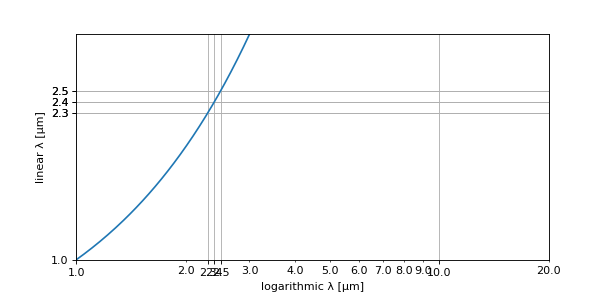

Text(0,0.5,'linear λ [μm]')

In [23]:
# for comparison with plot above to find 2.3-2.5μm range
# %matplotlib notebook
fig,ax = plt.subplots(1,1,figsize=(8,5))
lm = 10**np.linspace(0,1.3,300)
extraticks= [2.3,2.4,2.5]
ax.semilogx(lm,lm)

plt.xticks(list(plt.xticks()[0]) + extraticks)
plt.yticks(list(plt.xticks()[0]) + extraticks)

ax.set_xlim([1,20])
ax.set_ylim([1,3])
#ax.ticklabel_format(*, axis='both', style='', scilimits=None, useOffset=None, useLocale=None, useMathText=None)
from matplotlib.ticker import FormatStrFormatter

ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax.xaxis.set_minor_formatter(FormatStrFormatter('%.1f'))
ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
ax.yaxis.set_minor_formatter(FormatStrFormatter('%.1f'))

#ax.ticklabel_format(axis='x', style='plain')
plt.grid()

ax.set_xlabel('logarithmic λ [μm]')
ax.set_ylabel('linear λ [μm]')

In [46]:
# estimate 2.4um power in the device based on detected transmitted signal amplitude
# also conservatively estimate peak SHG power expected

# 2.4um detector properties (Thorlabs PDA10D2)
responsivity_24 = 1.3 * u.ampere / u.watt
tia_gain_24 = 1e4 * u.volt / u.ampere
NEP_24 = 1e-11*u.watt/(u.Hz**(0.5))
det_bw_24 = 10 * u.kHz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)

# # 1.2um detector properties (Thorlabs PDA10CF)
# responsivity_12 = 0.76 * u.ampere / u.watt
# tia_gain_12 = 1e4 * u.volt / u.ampere
# NEP_12 = 1.2e-11*u.watt/(u.Hz**(0.5)) # this is the NEP at peak responsivity = 1.04A/W @ 1.5um, should adjust
# det_bw_12 = 1 * u.Hz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)

# # 1.2um detector properties (Thorlabs PDA10CS at 60dB gain setting)
# responsivity_12 = 0.83 * u.ampere / u.watt
# tia_gain_12 = 1.5e6 * u.volt / u.ampere
# NEP_12 = 1.5e-12*u.watt/(u.Hz**(0.5)) # this is the NEP at peak responsivity = 1.04A/W @ 1.5um, should adjust
# det_bw_12 = 3e3 * u.Hz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)


# 1.2um detector properties (New Focus 2011 "candybar" at G=1e4 gain setting)
responsivity_12 = 0.8 * u.ampere / u.watt
tia_gain_12 = 1.5e7 * u.volt / u.ampere
NEP_12 = 2e-13*u.watt/(u.Hz**(0.5)) # this is the NEP at peak responsivity = 1.04A/W @ 1.5um, should adjust
det_bw_12 = 3e3 * u.Hz # just used to calculate SNR given detector's NEP in W/Hz^(1/2)


# signal properties
V_det_24 = 60*u.mV #30*u.mV

# peak SHG efficiency eta_SHG=P_SHG/P_wg**2, (for now taken from Timurdogan Watts paper, also using ~1mm device) 
eta_SHG = 0.12/u.watt

# 2.4um path losses
T_bs_24 = 0.5 # beamsplitter transmission
T_obj_24 = 0.3 # objective transmission
T_gc_24 = 0.3 # 2.4um grating coupler efficiency

# 1.2um path losses
T_bs_12 = 0.5 # beamsplitter transmission
T_obj_12 = 0.5 # objective transmission
T_gc_12 = 0.5 # 1.2um grating coupler efficiency

#  power calculations
P_det_24 = (V_det_24 / tia_gain_24 / responsivity_24).to(u.uW)
SNR_24 = (P_det_24 / (NEP_24 * det_bw_24**(0.5))).to(u.dimensionless).m
P_gc_24 = P_det_24 / T_bs_24 / T_obj_24
P_wg_24 = P_gc_24 / T_gc_24
P_wg_12 = (P_wg_24**2 * eta_SHG).to(u.W)
P_gc_12 = P_wg_12 * T_gc_12
P_det_12 = P_gc_12 * T_bs_12 * T_obj_12
V_det_12 = (P_det_12 * responsivity_12 * tia_gain_12).to(u.V)
SNR_12 = (P_det_12 / (NEP_12 * det_bw_12**(0.5))).to(u.dimensionless).m

# syntax: printval(x,w=4,p=1,form='f')

printval(V_det_24)
printval(SNR_24)
printval(P_det_24)
printval(P_gc_24)
printval(P_wg_24)
printval(P_det_12,form='g')
printval(P_gc_12,form='g')
printval(P_wg_12,form='g')
printval(V_det_12,form='g')
printval(SNR_12)

V_det_24: 60.0 millivolt
SNR_24: 4615.4
P_det_24: 4.6 microwatt
P_gc_24: 30.8 microwatt
P_wg_24: 102.6 microwatt
P_det_12: 2e-10 watt
P_gc_12: 6e-10 watt
P_wg_12: 1e-09 watt
V_det_12: 0.002 volt
SNR_12: 14.4


![eta_SHG.png](eta_SHG.png)

![miller_delta.png](miller_delta.png)


In [11]:
# Expected 2.4->1.2μm SHG efficiency
L = 40 * u.mm
P = 4 * u.watt
λ = 2.4 * u.um
n_24 = 2.1143 # n_e @ 2.4μm from RefractiveIndex.Info
n_12 = 2.1493 # n_e @ 1.2μm from RefractiveIndex.Info
n_1064 = 2.1555 # n_e @ 1.064μm from RefractiveIndex.Info
n_532 = 2.2336 # n_e @ 0.532μm from RefractiveIndex.Info
Δm = (n_12**2 - 1) * (n_24**2 - 1)**2 / ( (n_532**2 - 1) * (n_1064**2-1)**2 ) # Miller's Delta scaling from d_eff value for 1064->532nm SHG in literature
d_eff = 25 * u.pm/u.volt * 2 / np.pi * Δm
Z0 = u.impedance_of_free_space

γ_conf = (16 * np.pi**2 * Z0 * d_eff**2 / ( n_12 * n_24 * λ**3 )).to(1/u.cm/u.watt)
η_conf = ( γ_conf * L * P ).to(u.dimensionless).m
η_conf_dep = np.tanh(np.sqrt(η_conf))**2
P_SHG = P * η_conf_dep

P_24_meas = 2.75*u.watt
P_μs_max = 41 * u.mW
η_fc_12 = 0.55 # 1.2μm fiber couple efficiency
P_12_max = P_μs_max / η_fc_12
η_SHG_meas = (P_12_max / ( P_12_max + P_24_meas )).to(u.dimensionless).m

improvement = ( η_conf_dep / η_SHG_meas )

printval(Δm,p=3)
printval(d_eff)
printval(η_conf,p=3)
printval(η_conf_dep,p=3)
printval(P_SHG,p=3)
printval(P_12_max,p=3)
printval(η_SHG_meas,p=3)
printval(improvement,p=2)

Δm: 0.822
d_eff: 13.1 picometer / volt
η_conf: 0.026
η_conf_dep: 0.025
P_SHG: 0.102 watt
P_12_max: 74.545 milliwatt
η_SHG_meas: 0.026
improvement: 0.97


In [3]:
# resonant SHG efficiency

# expected resonant SHG efficiency based on: 
# Efficient Second Harmonic Generation of a DiodeLaser-Pumped CW Nd:YAG Laser
# Using Monolithic MgO:LiNbo3 External Resonant Cavities 
# KOZLOVSKY, NABORS, AND BYER, IEEE JOURNAL OF QUANTUM ELECTRONICS. VOL. 24. NO. 6, JUNE 1988

# get SHG coupling term γ
L = 40 * u.mm
P = 4 * u.watt
λ = 2.4 * u.um
n_24 = 2.1143 # n_e @ 2.4μm from RefractiveIndex.Info
n_12 = 2.1493 # n_e @ 1.2μm from RefractiveIndex.Info
n_1064 = 2.1555 # n_e @ 1.064μm from RefractiveIndex.Info
n_532 = 2.2336 # n_e @ 0.532μm from RefractiveIndex.Info
Δm = (n_12**2 - 1) * (n_24**2 - 1)**2 / ( (n_532**2 - 1) * (n_1064**2-1)**2 ) # Miller's Delta scaling from d_eff value for 1064->532nm SHG in literature
d_eff = 25 * u.pm/u.volt * 2 / np.pi * Δm
Z0 = u.impedance_of_free_space

γ = (L * 16 * np.pi**2 * Z0 * d_eff**2 / ( n_12 * n_24 * λ**3 )).to(1/u.watt)

printval(γ,p=3)


# define fn to solve for intracavity power for a given cavity, SHG coupling and input power

from scipy.optimize import minimize_scalar

def f_SHG_ring(Pc,Pin,t1,t,γ):
    r1 = 1-t1
    rm = t * ( 1 - γ * Pc ).to(u.dimensionless).m
    RHS = abs(Pin * t1 / ( 1 - np.sqrt( r1 * rm ) )**2 - Pc)
    return RHS

def SHG_ring(Pin,t1,t,γ):
    Pc = np.zeros(len(Pin)) * u.watt
    for Pind,PP in enumerate(Pin):
        f = lambda x: f_SHG_ring(x*u.watt,PP,t1,t,γ).m
        res = minimize_scalar(f,bounds=(0,1e5*PP))
        Pc[Pind] = res.x * u.watt
    return Pc
#     P_SHG = Pc**2 * γ
#     return P_SHG
# cavity reflectances and transmissions
t1 = 0.1
t = 0.85



Pin = np.linspace(0,3,200) * u.watt

Pc = SHG_ring(Pin,t1,t,γ)


γ: 0.006 / watt


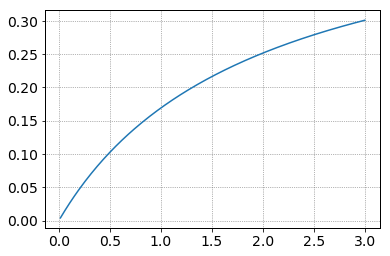

In [4]:
# plot resonant SHG model results
%matplotlib inline

P_SHG = Pc**2 * γ
fig,ax = plt.subplots(1,1)

ax.plot(Pin,(P_SHG/Pin).to(u.dimensionless).m)

In [5]:
# measure transmission through SHG crystal
P_final = 87 * u.mW
P_bg = 2 * u.mW
P_pre_dichro = 95 * u.mW
T_CaF2_24 = 0.89
P_pre_uc_lens = 101 * u.mW
P_pre_ppln_pre_coated_lens = 120*u.mW
T_ppln = ((P_pre_dichro-P_bg) / (P_pre_ppln_pre_coated_lens-P_bg)).to(u.dimensionless).m / T_CaF2_24
printval(T_ppln,p=3)

T_ppln: 0.886


Text(0,0.5,'cavity power enhancement $P_{cav}/P_{in}$ (1)')

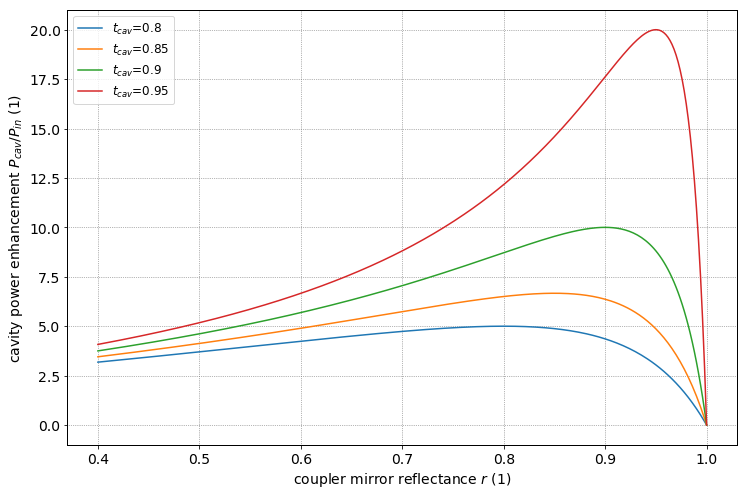

In [14]:
# cavity circulating power enhancement

r = np.linspace(0.4,1.0,300)[:,np.newaxis] # power reflectivity of coupler mirror
t_cav = np.array([0.8,0.85,0.9,0.95])[np.newaxis,:] # transmission of cavity round trip, ultimately should include "loss" to SHG conversion
t = 1-r # power transmission of coupler mirror
P_cav = t / ( 1 - np.sqrt(r*t_cav) )**2 # circulating power enhancement factor of cavity, so let input power P_in = 1 here
%matplotlib inline
fig,ax = plt.subplots(1,1,figsize=(12,8))

for tcind, tt in enumerate(t_cav[0,:]):
    ax.plot(r,P_cav[:,tcind],label='$t_{cav}$='+f'{tt}')
    
ax.legend()
ax.set_xlabel('coupler mirror reflectance $r$ (1)')
ax.set_ylabel('cavity power enhancement $P_{cav}/P_{in}$ (1)')

In [1]:
# 2.4 μm power calculations, Nov 20 2018
V_out = 100 * u.mV
η_fc = 0.33
P_in_fc = 0.9 * u.watt
P_in_chip = (P_in_fc * η_fc * R_BSW23_24_S * R_gold_45deg_24 * T_Mitutoyo_20x_24).to(u.mW)
P_out_det = (V_out/V_responsivity_PDA10D2).to(u.uW)
P_out_chip = ( P_out_det / T_Mitutoyo_20x_24 / T_BSW23_24_S / R_gold_45deg_24**3 / T_CaF2_24**2 / T_D_CaF2_24**3 / T_DM_24 ).to(u.uW)
η_chip = (P_out_chip / P_in_chip).to(u.dimensionless).m
η_gc_24_max = 0.3
η_gc_24_min = np.sqrt(η_chip)
P_U_min = P_out_chip / η_gc_24_max
P_U_max = P_out_chip.to(u.mW) / η_gc_24_min


printval(P_in_chip,p=3)
printval(P_out_det,p=3)
printval(P_out_chip,p=3)
printval(η_chip,p=4)
printval(η_gc_24_min,p=4)
printval(η_gc_24_max,p=4)
printval(P_U_min)
printval(P_U_max)


NameError: name 'u' is not defined

In [36]:
# 1.2 μm power calculations, Nov 20 2018
# V_out = 150 * u.mV
# g_tia = 1 * u.volt / u.mA
# η_fc = 0.55
# P_in_fc = 50.0 * u.milliwatt
# P_in_us = P_in_fc * η_fc 
# P_in_obj_meas = 13.8 * u.mW
# P_in_obj_theory = P_in_us * R_BSW23_12_S * R_gold_45deg_12**2 
# P_in_chip = (P_in_obj_meas * T_Mitutoyo_20x_12).to(u.mW)
# P_out_det = (V_out/g_tia/responsivity_DET08C_12).to(u.uW)
# P_out_chip = ( P_out_det / T_Mitutoyo_20x_12 / T_BSW23_12_S / R_gold_45deg_12**2).to(u.uW)
# η_chip = (P_out_chip / P_in_chip).to(u.dimensionless).m
# η_gc_12_max = 0.5
# η_gc_12_min = np.sqrt(η_chip)
# P_U_min = P_out_chip.to(u.mW) / η_gc_12_max
# P_U_max = P_out_chip.to(u.mW) / η_gc_12_min


# 1.2 μm power calculations, Dec 15 2018
V_out = 25 * u.mV
g_tia = 1 * u.volt / u.mA

P_in_fc = 8.8 * u.milliwatt
P_in_us = 6.6*u.milliwatt
η_fc = (P_in_us / P_in_fc).to(u.dimensionless).m
P_in_obj_meas = 4.05 * u.mW
P_in_obj_theory = P_in_us * R_BSW23_12_S * R_gold_45deg_12**2 
P_in_chip = (P_in_obj_meas * T_Mitutoyo_20x_12).to(u.mW)
P_out_det = (V_out/g_tia/responsivity_DET08C_12).to(u.uW)
P_out_chip = ( P_out_det / T_Mitutoyo_20x_12 / T_BSW23_12_S / R_gold_45deg_12**2).to(u.uW)
η_chip = (P_out_chip / P_in_chip).to(u.dimensionless).m
η_gc_12_max = 0.5
η_gc_12_min = np.sqrt(η_chip)
P_U_min = P_out_chip.to(u.mW) / η_gc_12_max
P_U_max = P_out_chip.to(u.mW) / η_gc_12_min

printval(P_in_chip,p=3)
printval(P_out_chip,p=3)
printval(η_fc,p=3)
printval(η_chip,p=4)
printval(η_gc_12_min,p=4)
printval(η_gc_12_max,p=4)
printval(P_U_min)
printval(P_U_max)


P_in_chip: 2.025 milliwatt
P_out_chip: 237.235 microwatt
η_fc: 0.750
η_chip: 0.1172
η_gc_12_min: 0.3423
η_gc_12_max: 0.5000
P_U_min: 0.5 milliwatt
P_U_max: 0.7 milliwatt


In [22]:
#### 3.35um diode laser fiber coupling ####

### 12/4 

V_responsivity_PDA20H_33 = 0.85 * 3e3 * u.volt/u.watt # at 3.35μm, ~85% of peak
T_NE30A_33 = 0.368/5.18 # transmission at 3.35μm of NE30A absorptive ND filter

## Attempt 1, Thorlabs silver 4mm off-axis-parabolic reflective collimator used to collect 3.35um light

V_fiber_out_33 = 5.18 * u.volt # voltage amplitude on PDA20H PbS detector with one of two NE30A ND filters used 
P_fiber_out_33 = (V_fiber_out_33 / T_NE30A_33 / V_responsivity_PDA20H_33).to(u.mW)
V_fiber_in_33 = 2.04 * u.volt # voltage amplitude on PDA20H PbS detector with two NE30A ND filters used 
P_fiber_in_33 = (V_fiber_in_33 / T_NE30A_33**2 / V_responsivity_PDA20H_33).to(u.mW)
η_fiber_33 = (P_fiber_out_33 / P_fiber_in_33).to(u.dimensionless).m

printval(T_NE30A_33, p=3)
printval(P_fiber_out_33)
printval(P_fiber_in_33)
printval(η_fiber_33,p=3)

# note this 

T_NE30A_33: 0.071
P_fiber_out_33: 28.6 milliwatt
P_fiber_in_33: 158.5 milliwatt
η_fiber_33: 0.180


# Scratch

In [25]:
# 2.4um mode coupling/alignment notes
# f = 10.0 * u.mm
# x0 = 185*u.um
# d = 30 * u.cm
# x1 = (d/f*x0).to(u.mm)

# x1
#1.5 * 7.7 = 11.55 cm apt on bol cam screen
#(185 * u.um / (17*u.um) * 10. / 480.) = 0.227 # pct of screen height of separated input and output at 10x mag, calc 3.2cm, meas 3.3 @ 1x
0.227*14.

# start at side knob @ 11.25 + 11 on knob


#(0.22* 480 * 17 * u.um).to(u.mm) / (0.1*u.mm) # 17.95 pixels on pyrocam separating these two spots for 10x mag
#==>for 4x: expect 18 * 4 / 10 pixels separation

bolo_cam_pixel_size = 17 * u.um
bolo_cam_pixel_size_on_screen = ((14 * u.cm) / 480.).to(u.mm)

w_skinny_out_pix = (2*u.mm / bolo_cam_pixel_size_on_screen * bolo_cam_pixel_size) # vertical
w_fat_out_pix = (15*u.mm / bolo_cam_pixel_size_on_screen * bolo_cam_pixel_size) # horizontal

print(f'bolo_cam_pixel_size_on_screen: {bolo_cam_pixel_size_on_screen:3.3f}')
print(f'w_skinny_out_pix: {w_skinny_out_pix:3.3f}')
print(f'w_fat_out_pix: {w_fat_out_pix:3.3f}')


# Mitutoyo 20x objective focused on chip surface for collimated 1.2μm light input @ 10.87mm
# @ 2.4μm light input @ ~10.55mm

# focal planes at these two wavelengths are ~320μm apart

bolo_cam_pixel_size_on_screen: 0.292 millimeter
w_skinny_out_pix: 116.571 micrometer
w_fat_out_pix: 874.286 micrometer


In [358]:
n_steps = -300
current_pos = ipg.sm.get_current_position(unitful=False)
new_pos = current_pos + n_steps
λ_current = ipg.get_lm()
printval(current_pos)
printval(λ_current)
printval(new_pos)

ipg.sm.go_and_wait(new_pos,speed=10)
λ_final = ipg.get_lm()
printval(λ_final)

current_pos: 5671.0
λ_current: 2384.7 nanometer
new_pos: 5371.0
λ_final: 2377.3 nanometer


In [361]:
def jog_set_temp(ΔT):
    current_set_temp = get_set_temp()
    print(f'Initial set temp: {current_set_temp}')
    new_set_temp = current_set_temp + ΔT
    print(f'Final set temp: {new_set_temp}')
    set_set_temp(new_set_temp)
    
def jog_stepper(n,speed=10):
    current_pos = ipg.sm.get_current_position(unitful=False)
    new_pos = current_pos + n
    λ_current = ipg.get_lm()
    print(f"Initial position: {current_pos}")
    print(f"Initial λ: {λ_current}")
    print(f"Final position: {new_pos}")
    ipg.sm.go_and_wait(new_pos,speed=10)
    λ_final = ipg.get_lm()
    print(f"final λ: {λ_final}")
    
def tune_SHG

In [286]:
jog_set_temp(-5)

Current set temp: 30.99949831679737
New set temp: 25.99949831679737


In [5]:

set_Vrb(9*u.volt,V_max=10.1*u.volt)

In [287]:
ipg.set_wavelength(2381*u.nm,tune_SHG=True)

tuning SHG:
	poling region: 1, LM=34.8000um
	set temperature: 76.0C
current_temp: 75.782 degC
set_temp: 75.9766680893442 degC


In [288]:
set_set_temp(16)

1.6189669370651245

In [363]:
jog_stepper(50)
#500 steps <==> ~ 3nm

Initial position: 5571
Initial λ: 2378.7900390625 nanometer
Final position: 6071
final λ: 2381.7890625 nanometer


In [4]:
ipg.tune_SHG(ipg.get_lm())

tuning SHG:
	poling region: 1, LM=34.8000um
	set temperature: 76.9C
current_temp: 75.977 degC
set_temp: 76.90223058878854 degC


In [5]:
configure_measurement(f_ring=0.5*u.Hz)

In [9]:

data = grab_traces()

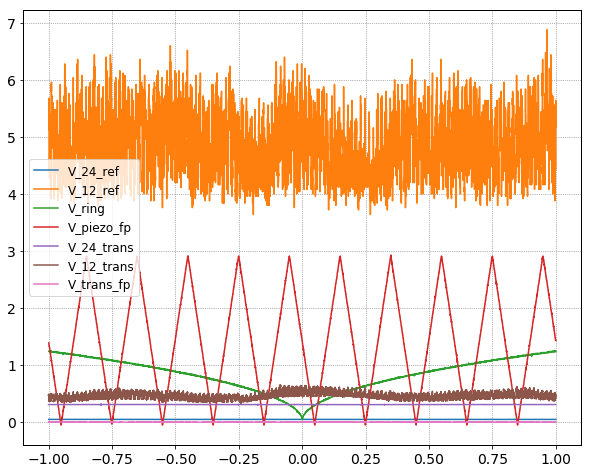

In [7]:
%matplotlib inline
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111)

for t_name,t in data.items():
#     print(f't[0].shape: {t[0].shape}')
#     print(f't[1].shape: {t[1].shape}')
    ax.plot(t[0][:],t[1][:],label=t_name)
ax.legend()


In [2]:
lm_start = 2380*u.nm
n_V_pzt = 5
name = 'test'
stepper_incr = 150
n_stepper_pts = 20

fpath = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)

tuning SHG:trans_fp trace from channel 4 on DPO2024... 
	poling region: 1, LM=34.8000um
	set temperature: 74.8C
current_temp: 74.828 degC
set_temp: 74.79157774932419 degC
tuning SHG:elength to 2380.000, loop 1, lm_meas: 2379.995nm, lm_err:  0.005nm, n_iter: 7 
	poling region: 1, LM=34.8000um
	set temperature: 75.0C
current_temp: 74.807 degC
set_temp: 75.01291420198906 degC
tuning SHG:trans_fp trace from channel 4 on DPO2024... 
	poling region: 1, LM=34.8000um
	set temperature: 76.1C
current_temp: 75.012 degC
set_temp: 76.14418940449839 degC
tuning SHG:trans_fp trace from channel 4 on DPO2024... 
	poling region: 1, LM=34.8000um
	set temperature: 77.4C
current_temp: 76.092 degC
set_temp: 77.38627749768831 degC
tuning SHG:trans_fp trace from channel 4 on DPO2024... 
	poling region: 1, LM=34.8000um
	set temperature: 80.5C
current_temp: 77.381 degC
set_temp: 80.54437402607734 degC
tuning SHG:trans_fp trace from channel 4 on DPO2024... 
	poling region: 1, LM=34.8000um
	set temperature: 89.8C

In [27]:
#fpath = os.path.normpath('C:/Users/Lab/Google Drive/data/OPO_data_test_2018_12_11_12_20_40.hdf5')
#fpath = os.path.normpath('C:/Users/Lab/Google Drive/data/OPO_data_test_2018_12_11_20_48_49.hdf5')
print('fpath: '+ fpath)
from scipy import signal
with h5py.File(fpath,'r') as f:
    λ = f['lm'][...] * u.nm
    t_scope0 = time_array(f['V_12_trans'])
    t_scope2 = time_array(f['V_12_ref'])    
#     T_24 = f['V_24_trans'][...] / signal.resample(f['V_24_ref'][...],f['V_24_trans'].attrs['length'])
#     T_12 = f['V_12_trans'][...] / signal.resample(f['V_12_ref'][...],f['V_12_trans'].attrs['length'])
#    T_24 = signal.resample(f['V_24_trans'][...],f['V_24_ref'].attrs['length']) / f['V_24_ref'][...]
    T_12 = signal.resample(f['V_12_trans'][...],f['V_12_ref'].attrs['length']) / f['V_12_ref'][...]
    T_24 = f['V_24_trans'][:,:,:]
#    T_12 = f['V_12_trans'][:,:,:]
# f_V_12_trans_t_interp = interp1d(t_scope2,f['V_12_ref'][...],axis=0)
# T_12 = f['V_12_trans'][...] / f_V_12_trans_t_interp(f['V_12_ref'][...])
# #f['V_12_ref'][...].shape


fpath: C:\Users\Lab\Google Drive\data\OPO_data_test_2018_12_12_02_00_34.hdf5


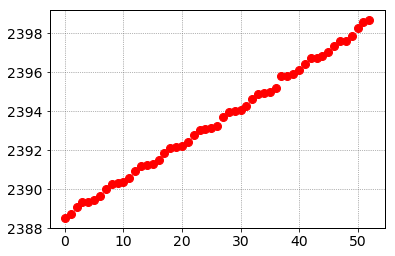

In [11]:
%matplotlib inline
plt.plot(np.sort(λ.flatten())[47:],'ro')

In [32]:
# T_24.shape
# : (5000, 5, 20)
# λ_sorted = np.sort(λ.flatten())
# sort_inds = np.argsort(λ.reshape(100))
# T_24_sorted = T_24.reshape(125000,100)[::100,sort_inds]

λ_sorted = np.sort(λ,axis=None)
sort_inds = np.argsort(λ,axis=None)
T_24_sorted = np.reshape(T_24,(125000,100),order='F')[::100,sort_inds]
T_12_sorted = np.reshape(T_12,(5000,100),order='F')[::5,sort_inds]


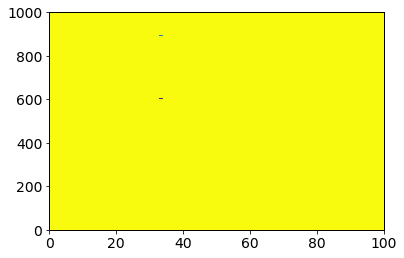

In [33]:
plt.pcolormesh(T_12_sorted)

<IPython.core.display.Javascript object>


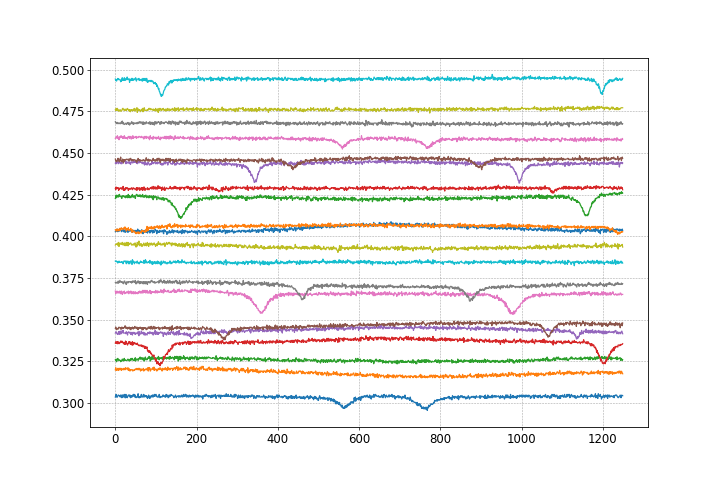

In [5]:
sind = 10
Vind = 1
ind_range = range(20)
#plt.pcolormesh(T_24[::100,:,sind])

offset= 0.01

fig,ax = plt.subplots(1,1,figsize=(12,8))
#max(abs(T_24[::100,3,sind] - T_24[::100,2,sind])) : 0
for i in ind_range:
    ax.plot(T_24[::100,Vind,i] + i * offset)

In [2]:
lm_start = 2381*u.nm
n_V_pzt = 10
name = 'test1'
stepper_incr = 130
n_stepper_pts = 20

fpath_15 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)


tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 76.0C
current_temp: 74.8 degC
set_temp: 75.9766680893442 degC
tuning SHG:elength to 2381.000, loop 1, lm_meas: 2380.985nm, lm_err:  0.015nm, n_iter: 7 
	poling region: 1, LM=34.8000um
	set temperature: 76.4C
current_temp: 75.591 degC
set_temp: 76.40863583291106 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 81.2C
current_temp: 76.437 degC
set_temp: 81.19709956491637 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 79.3C
current_temp: 81.402 degC
set_temp: 79.34655322342059 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 80.8C
current_temp: 79.284 degC
set_temp: 80.77265436745323 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set t

In [3]:
lm_start = 2370*u.nm
n_V_pzt = 10
name = 'ds1_V2_w800_g200_T15'
stepper_incr = 130
n_stepper_pts = 50

fpath_15 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)


set_set_temp(25)
name = 'ds1_V2_w800_g200_T25'

fpath_25 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)

tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 57.1C
current_temp: 100.342 degC
set_temp: 57.08777920045511 degC
tuning SHG:elength to 2370.000, loop 1, lm_meas: 2370.030nm, lm_err: -0.030nm, n_iter: 6 
	poling region: 1, LM=34.8000um
	set temperature: 57.6C
current_temp: 75.311 degC
set_temp: 57.616382728584064 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...                                
	poling region: 1, LM=34.8000um
	set temperature: 59.9C
current_temp: 63.409 degC
set_temp: 59.88042701442222 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 59.7C
current_temp: 59.695 degC
set_temp: 59.717824287105024 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 60.7C
current_temp: 59.716 degC
set_temp: 60.673766299660215 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	p

In [5]:
#set_set_temp(30)

lm_start = 2370*u.nm
n_V_pzt = 10
name = 'ds1_V2_w800_g200_T30'
stepper_incr = 130
n_stepper_pts = 50

fpath_30 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)


set_set_temp(45)
name = 'ds1_V2_w800_g200_T45'

fpath_45 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)

tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 57.1C
current_temp: 114.542 degC
set_temp: 57.08777920045511 degC
tuning SHG:velength: 2370.029nm, target wavelength 2370.000nm reached (or gave up) in 19 steps
	poling region: 1, LM=34.8000um
	set temperature: 57.1C
current_temp: 78.074 degC
set_temp: 57.1333484701214 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...                                      
	poling region: 1, LM=34.8000um
	set temperature: 58.8C
current_temp: 64.839 degC
set_temp: 58.76212436590791 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 59.8C
current_temp: 60.274 degC
set_temp: 59.802308266422855 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B...   
	poling region: 1, LM=34.8000um
	set temperature: 60.7C
current_temp: 59.793 degC
set_temp: 60.680131530978684 degC
tuning SHG:trans_fp trace from channel 4 on TDS 3034B

In [7]:
ipg.set_wavelength(2380*u.nm,tuning_SHG=True)

tuning SHG:
	poling region: 1, LM=34.8000um
	set temperature: 74.8C
current_temp: 114.579 degC
set_temp: 74.79157774932419 degC


In [2]:
# adding LIA trace acquisition during "SHG" traces and retesting...
lm_start = 2380*u.nm
n_V_pzt = 5
name = 'test2' 
stepper_incr = 130
n_stepper_pts = 3

fpath_test2 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)



tuning SHG:SHG_Y trace from channel 2 on SR850...       
	poling region: 1, LM=34.8000um
	set temperature: 74.8C
current_temp: 74.788 degC
set_temp: 74.79157774932419 degC
tuning SHG:velength: 2380.027nm, target wavelength 2380.000nm reached (or gave up) in 6 steps
	poling region: 1, LM=34.8000um
	set temperature: 74.8C
current_temp: 74.801 degC
set_temp: 74.81183075806477 degC
tuning SHG:SHG_Y trace from channel 2 on SR850...       
	poling region: 1, LM=34.8000um
	set temperature: 77.2C
current_temp: 74.805 degC
set_temp: 77.24392777911169 degC
tuning SHG:SHG_Y trace from channel 2 on SR850...       
	poling region: 1, LM=34.8000um
	set temperature: 77.9C
current_temp: 77.33 degC
set_temp: 77.90764780841 degC
tuning SHG:SHG_Y trace from channel 2 on SR850...       
	poling region: 1, LM=34.8000um
	set temperature: 74.8C
current_temp: 77.901 degC
set_temp: 74.79157774932419 degC


In [3]:

from scipy import signal
with h5py.File(fpath_test2,'r') as f:
    λ = f['lm'][...] * u.nm
    t_scope0 = time_array(f['12_on/V_12_trans'])
    t_scope2 = time_array(f['12_on/V_12_ref'])    
#     T_24 = f['V_24_trans'][...] / signal.resample(f['V_24_ref'][...],f['V_24_trans'].attrs['length'])
#     T_12 = f['V_12_trans'][...] / signal.resample(f['V_12_ref'][...],f['V_12_trans'].attrs['length'])
#    T_24 = signal.resample(f['V_24_trans'][...],f['V_24_ref'].attrs['length']) / f['V_24_ref'][...]
    T_12 = signal.resample(f['12_on/V_12_trans'][...],f['12_on/V_12_ref'].attrs['length']) / f['12_on/V_12_ref'][...]
    T_24 = f['12_on/V_24_trans'][:,:,:]
    SHG_X = f['12_off/V_SHG_X'][:,:,:]
    SHG_Y = f['12_off/V_SHG_Y'][:,:,:]

In [4]:
SHG_X.shape

(129, 5, 3)

<IPython.core.display.Javascript object>


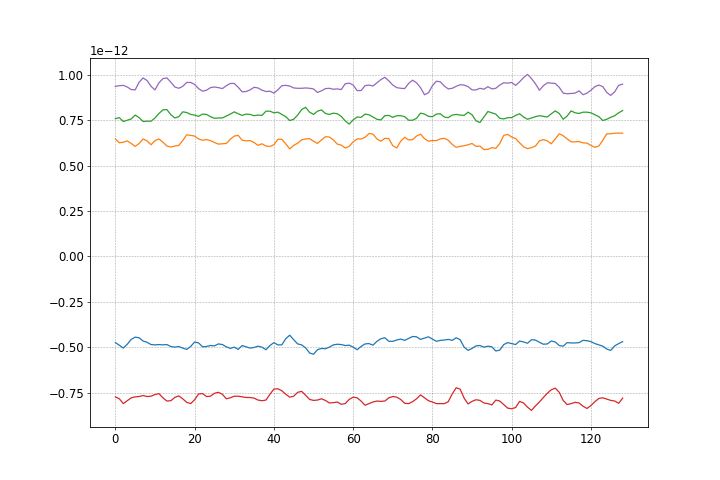

In [7]:
sind = 1
Vind = 1
ind_range = range(5)
#plt.pcolormesh(T_24[::100,:,sind])

offset= 0.0

fig,ax = plt.subplots(1,1,figsize=(12,8))
#max(abs(T_24[::100,3,sind] - T_24[::100,2,sind])) : 0
for i in ind_range:
    ax.plot(SHG_X[:,i,sind])
    


In [8]:
lm_start = 2370*u.nm
n_V_pzt = 10
name = 'ds2_V2_w800_g200_T20'
stepper_incr = 130
n_stepper_pts = 50

fpath_15 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)


set_set_temp(30)
name = 'ds2_V2_w800_g200_T30'

fpath_30 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)

tuning SHG:SHG_Y trace from channel 2 on SR850...       
	poling region: 1, LM=34.8000um
	set temperature: 57.1C
current_temp: 74.797 degC
set_temp: 57.08777920045511 degC
tuning SHG:elength to 2370.000, loop 1, lm_meas: 2370.023nm, lm_err: -0.023nm, n_iter: 13
	poling region: 1, LM=34.8000um
	set temperature: 57.1C
current_temp: 66.384 degC
set_temp: 57.12900853967699 degC
tuning SHG:SHG_Y trace from channel 2 on SR850...       
	poling region: 1, LM=34.8000um
	set temperature: 60.0C
current_temp: 56.845 degC
set_temp: 60.01236089993226 degC
tuning SHG:SHG_Y trace from channel 2 on SR850...       
	poling region: 1, LM=34.8000um
	set temperature: 61.0C
current_temp: 60.003 degC
set_temp: 60.99173853688726 degC
tuning SHG:SHG_Y trace from channel 2 on SR850...       
	poling region: 1, LM=34.8000um
	set temperature: 61.9C
current_temp: 60.993 degC
set_temp: 61.920772980687126 degC
tuning SHG:SHG_Y trace from channel 2 on SR850...       
	poling region: 1, LM=34.8000um
	set temperature:

In [2]:
lm_start = 2300*u.nm
n_V_pzt = 5
name = 'ds3_V2_w800_g300_T20'
stepper_incr = 130
n_stepper_pts = 200

fpath_ds3_20 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)



%matplotlib notebook
lia.set_time_constant(sr850.TimeConstant.x100ms)
lia.set_sensitivity(sr850.Sensitivity.x50uV_pA)
V = np.array([9.0])*u.volt #np.linspace(8.75,9.25,3) * u.volt
set_V_fn = lambda x: set_Vrb(x,V_max=9.3*u.volt)
lm_start = 2300*u.nm
steps_per_point = 5
n_pts_per_setpoint = 1
settle_time = 0.5*u.second
n_pts = 2500

T = np.array([20])
for TT in T:
    print_statusline(f'TT={TT}')
    name = f'ds3_SHG_{TT}C'
    #set_temp_and_wait(1.0*TT)
    collect_SHG_V_wavelength_sweep(V,
                                   set_V_fn,
                                   lm_start,
                                   steps_per_point,
                                   n_pts,
                                   name=name,
                                   norm_with_P_trans=True,
                                   n_pts_per_setpoint=n_pts_per_setpoint,
                                   settle_time=settle_time,)

tuning SHG:24_trans trace from channel 1 on TDS 3034B...6nm, lm_err:  0.004nm, n_iter: 5 
	poling region: 1, LM=34.8000um
	set temperature: 30.5C
current_temp: 103.645 degC
set_temp: 30.501672340704562 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B...                                
	poling region: 1, LM=34.8000um
	set temperature: 31.1C
current_temp: 64.154 degC
set_temp: 31.060944710640758 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B...
	poling region: 1, LM=34.8000um
	set temperature: 32.5C
current_temp: 54.042 degC
set_temp: 32.47489404942927 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B...
	poling region: 1, LM=34.8000um
	set temperature: 33.4C
current_temp: 48.607 degC
set_temp: 33.4291000898067 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B...
	poling region: 1, LM=34.8000um
	set temperature: 34.1C
current_temp: 45.06 degC
set_temp: 34.14907683653235 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B...
	poling region: 1

<IPython.core.display.Javascript object>

NameError: name 'scope' is not defined

In [2]:
lm_start = 2300*u.nm
n_V_pzt = 5
name = 'ds3_V2_w800_g400_T20'
stepper_incr = 130
n_stepper_pts = 200

# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_g400_20 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                        f_ring=0.5*u.Hz,name=name,settle_time=1*u.second)



tuning SHG:24_trans trace from channel 1 on TDS 3034B...000nm reached (or gave up) in 13 steps
	poling region: 1, LM=34.8000um
	set temperature: 30.4C
current_temp: 172.61 degC
set_temp: 30.385362204794394 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B....                                     
	poling region: 1, LM=34.8000um
	set temperature: 31.4C
current_temp: 71.837 degC
set_temp: 31.43591470103771 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B...  
	poling region: 1, LM=34.8000um
	set temperature: 32.8C
current_temp: 58.949 degC
set_temp: 32.75091362569369 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B...
	poling region: 1, LM=34.8000um
	set temperature: 33.2C
current_temp: 52.136 degC
set_temp: 33.234092548504584 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B...
	poling region: 1, LM=34.8000um
	set temperature: 34.6C
current_temp: 47.762 degC
set_temp: 34.56701213832889 degC
tuning SHG:24_trans trace from channel 1 on TDS 3034B...
	po

In [7]:
lm_start = 2300*u.nm
n_V_pzt = 5
set_Vrb(0*u.volt)
name = 'ds3_V2_w800_g400_T20_Vrb0'
stepper_incr = 130
n_stepper_pts = 200

# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_g400_20 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                                     f_ring=0.5*u.Hz,name=name,settle_time=1*u.second,Vrb=0*u.volt)



VisaIOError: VI_ERROR_SYSTEM_ERROR (-1073807360): Unknown system error (miscellaneous error).

In [ ]:
lm_start = 2300*u.nm
n_V_pzt = 5
set_Vrb(0*u.volt)
name = 'ds3_V2_w800_g400_T20_Vrb0'
stepper_incr = 130
n_stepper_pts = 200

# note that for this and the corresponding g300 dataset the scope3/ch1 (V_T_24) has a 289mV offset. The same is roughly true for previous ones too

fpath_ds3_g400_20 = collect_OPO_data(lm_start,n_V_pzt,stepper_incr,n_stepper_pts,config=True,
                                     f_ring=0.5*u.Hz,name=name,settle_time=1*u.second,Vrb=0*u.volt)



In [ ]:
def configure_12_chop(f_12_chop=240*u.Hz,sleep_time=30*u.ms):
    rigol_afg.use_external_clock()
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('output:load inf')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('output:load:ch2 inf')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('function square')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('function:ch2 square')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('function:square:dcycle 50.0') # chop square wave duty cycle in %
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('function:square:dcycle:ch2 50.0') # chop square wave duty cycle in %
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write(f'frequency {f_12_chop.to(u.Hz).m:6.3E}')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write(f'frequency:ch2 {f_12_chop.to(u.Hz).m:6.3E}')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('voltage:high 5.0')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('voltage:low 0.0')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('voltage:high:ch2 2.9') # rigol DG1022A ch2 has a lower voltage range, this is for the TTL frequency reference input to SR850 lock-in amplifier
    sleep(sleep_time.to(u.second).m)
    rigol_afg.write('voltage:low:ch2 0.0')
    sleep(sleep_time.to(u.second).m)
    rigol_afg.enable(ch=2) # turn on reference frequency signal, this is left on all the time so that the lock-in is always ready

configure_12_chop()
sleep(0.1)

In [90]:
def configure_lia(t_scan=2*u.second,sensitivity=sr850.Sensitivity.x50uV_pA,reference_phase=0*u.degree,
                 time_constant=sr850.TimeConstant.x10ms,sample_rate=sr850.ScanSampleRate.x64Hz):
    ## configure LIA
    lia.clear_registers()
    # turn off alarms to avoid lots of trigger noises
    lia.set_alarm_mode(sr850.AlarmMode.off)
    # configure reference frequency
    lia.set_reference_source(sr850.ReferenceSource.external) # use chopper reference out as lock-in reference signal
    lia.set_reference_slope(sr850.ReferenceSlope.ttl_rising)
    lia.set_reference_phase(reference_phase) # checked for current alignment by maximizing signal and running auto_phase, then checking reference phase
    # configure inputs
    lia.set_input_coupling(sr850.InputCoupling.AC)
    #lia.set_input_ground(sr850.InputGround.floating)
    #lia.set_input_ground(sr850.InputGround.ground)
    lia.set_input_configuration(sr850.InputConfiguration.I)
    lia.set_current_gain(sr850.CurrentGain.oneHundredMegaOhm)
    #lia.set_current_gain(sr850.CurrentGain.oneMegaOhm)
    lia.set_line_filter_status(sr850.LineFilter.both_filters)

    # configure gain, time constant, sensitivity
    lia.set_sensitivity(sensitivity)
    lia.set_time_constant(time_constant)
    lia.set_low_pass_slope(sr850.LowPassSlope.twentyfour_dB_per_octave)
    #lia.set_low_pass_slope(sr850.LowPassSlope.twelve_dB_per_octave)

    # configure scans and traces
    lia.set_trace_definitions(sr850.TraceNumber.one,sr850.Multiply.X)
    lia.set_trace_definitions(sr850.TraceNumber.two,sr850.Multiply.Y)
    lia.set_trace_definitions(sr850.TraceNumber.three,sr850.Multiply.X_n)
    lia.set_trace_definitions(sr850.TraceNumber.four,sr850.Multiply.Y_n)
    lia.set_scan_mode(sr850.ScanMode.single_shot)
    lia.set_scan_sample_rate(sample_rate)
    lia.set_scan_length(t_scan)
    lia.set_trigger_start_scan_mode(sr850.TriggerStartScanMode.yes)
    #lia.reset_scan()

    

configure_lia()


In [84]:
set_Vrb(8.5*u.volt)

In [89]:
jog_stepper(50,speed=3)

Initial position: 67
Initial λ: 2382.13525390625 nanometer
Final position: 117
final λ: 2382.407470703125 nanometer


In [92]:
ipg.set_wavelength(2379*u.nm,tuning_SHG=False)

In [93]:
set_set_temp(15.0)

1.711171269416809

In [18]:
#ipg.power_down()
#import ipg_sftl_lib as ipg
set_temp_and_wait(21)

IndexError: index 10 is out of bounds for axis 0 with size 10